In this algorithm we take the last one a bit further by now allowing for short selling via defining a weight function.  This improves diversification greatly.  It's definitely complicated to make a good weight function since it's heavily dependent on the stocks and our data pipeline, but this serves the purpose well enough.

Still we don't have a lot of short selling taking place.  In this case we'll want to make a data pipeline to take a lot of assets and pricing data (say the whole S&P 500) and shrink it into maybe 30-50 stocks that we'll trade, ensuring to have specific long/short signals so that we're not too long heavy.  We'll look more into pipelining in our next algo.  

In [2]:
!pip install HTML5LIB
!pip install BeautifulSoup4 # needed for html parsing

  Using cached beautifulsoup4-4.9.3-py3-none-any.whl (115 kB)
  Using cached soupsieve-2.0.1-py3-none-any.whl (32 kB)


In [14]:
import pandas as pd
result = pd.read_html("http://en.wikipedia.org/wiki/List_of_S%26P_500_companies")
data = result[0]
companies = list(data[0][1:])

def make_symbols(symbols: list, length=-1):
    new_list = []
    for asset in symbols:
        try:
            new_list.append(symbol(asset))
        except SymbolNotFound:
            pass
    shuffle(new_list)
    if length == -1:
        return new_list
    return new_list[:length]

In [46]:
from zipline.api import order_target_percent, symbol, order_target, set_max_leverage
from zipline import run_algorithm
import warnings
import pyfolio as pf
from random import shuffle
from ta.momentum import StochRSIIndicator
from zipline.errors import SymbolNotFound, CannotOrderDelistedAsset

warnings.filterwarnings("ignore")


STOCKS = companies
MAX_BAR_HOLD = 1 # only hold a stock for max 3 bars (days in our case)



def initialize(algo):
    algo.stocks = STOCKS
    algo.symbol_ids = make_symbols(STOCKS, 10) # [algo.symbol(asset) for asset in STOCKS]
#     algo.set_max_leverage(1.0) # only allowed to invest 100% of our total portfolio value
    print(algo.symbol_ids)
    algo.has_open_positions = {symbol: False for symbol in algo.symbol_ids} 
    algo.bars_held = {symbol: 0 for symbol in algo.symbol_ids} # number of bars (ie timesteps) we've held an asset

    
def purchase_share(algo, data):
    recent = data.history(assets=algo.symbol_ids, fields='close', bar_count=60, frequency='1d')
    short_mean = recent[-10:].mean()
    long_mean = recent[-50:].mean()
    return (short_mean > long_mean) # short term is outperforming long term

def make_weights(algo, data):
    recent = data.history(assets=algo.symbol_ids, fields='close', bar_count=20, frequency='1d')
    short_mean = recent[-5:].mean()
    long_mean = recent[-15:].mean()
    # simple percent change of two means.  Also accounts for short selling
    weights = (short_mean - long_mean) / long_mean 
    normalized_weights = weights / abs(weights).sum()
    return normalized_weights


def max_purchase_weight(security, weights):
    max_allowed_weight = len(STOCKS) / 100.0
    if weights[security] < 0:
        return max(-max_allowed_weight, weights[security])
    return min(max_allowed_weight, weights[security])

def handle_data(algo, data):
    purchase = purchase_share(algo, data)
    weights = make_weights(algo, data)
    recent = data.history(assets=algo.symbol_ids, fields='close', bar_count=30, frequency='1d')
    for security in algo.symbol_ids:
        rsi = StochRSIIndicator(recent[security])
        print(rsi.stochrsi())
        if not algo.has_open_positions[security] and algo.bars_held[security] <= MAX_BAR_HOLD and purchase[security]:
            try: 
                order_target_percent(security, max_purchase_weight(security, weights)) 
                algo.has_open_positions[security] = True;
                algo.bars_held[security] += 1;
            except CannotOrderDelistedAsset:
                pass
        elif algo.bars_held[security] > MAX_BAR_HOLD or not purchase[security]:
            try:
                order_target_percent(security, 0) # order nothing (sell share)
                algo.has_open_positions[security] = False # reset value for security's open positions
                algo.bars_held[security] = 0
            except CannotOrderDelistedAsset:
                pass
            


start = pd.Timestamp('2015-1-1', tz='utc')
end = pd.Timestamp('2018-1-1', tz='utc')
results = run_algorithm(start=start, end=end, capital_base=1000, initialize=initialize, handle_data=handle_data, 
                        data_frequency='daily')

returns, positions, orders = pf.utils.extract_rets_pos_txn_from_zipline(results)

[Equity(1608 [KMI]), Equity(1085 [FIS]), Equity(3067 [WDC]), Equity(906 [ECL]), Equity(1657 [LDOS]), Equity(567 [CHTR]), Equity(129 [ALLE]), Equity(1891 [MSCI]), Equity(61 [AEE]), Equity(2942 [UNH])]
2014-11-19 00:00:00+00:00         NaN
2014-11-20 00:00:00+00:00         NaN
2014-11-21 00:00:00+00:00         NaN
2014-11-24 00:00:00+00:00         NaN
2014-11-25 00:00:00+00:00         NaN
2014-11-26 00:00:00+00:00         NaN
2014-11-28 00:00:00+00:00         NaN
2014-12-01 00:00:00+00:00         NaN
2014-12-02 00:00:00+00:00         NaN
2014-12-03 00:00:00+00:00         NaN
2014-12-04 00:00:00+00:00         NaN
2014-12-05 00:00:00+00:00         NaN
2014-12-08 00:00:00+00:00         NaN
2014-12-09 00:00:00+00:00         NaN
2014-12-10 00:00:00+00:00         NaN
2014-12-11 00:00:00+00:00         NaN
2014-12-12 00:00:00+00:00         NaN
2014-12-15 00:00:00+00:00         NaN
2014-12-16 00:00:00+00:00         NaN
2014-12-17 00:00:00+00:00         NaN
2014-12-18 00:00:00+00:00         NaN
20

2014-11-21 00:00:00+00:00         NaN
2014-11-24 00:00:00+00:00         NaN
2014-11-25 00:00:00+00:00         NaN
2014-11-26 00:00:00+00:00         NaN
2014-11-28 00:00:00+00:00         NaN
2014-12-01 00:00:00+00:00         NaN
2014-12-02 00:00:00+00:00         NaN
2014-12-03 00:00:00+00:00         NaN
2014-12-04 00:00:00+00:00         NaN
2014-12-05 00:00:00+00:00         NaN
2014-12-08 00:00:00+00:00         NaN
2014-12-09 00:00:00+00:00         NaN
2014-12-10 00:00:00+00:00         NaN
2014-12-11 00:00:00+00:00         NaN
2014-12-12 00:00:00+00:00         NaN
2014-12-15 00:00:00+00:00         NaN
2014-12-16 00:00:00+00:00         NaN
2014-12-17 00:00:00+00:00         NaN
2014-12-18 00:00:00+00:00         NaN
2014-12-19 00:00:00+00:00         NaN
2014-12-22 00:00:00+00:00         NaN
2014-12-23 00:00:00+00:00         NaN
2014-12-24 00:00:00+00:00         NaN
2014-12-26 00:00:00+00:00         NaN
2014-12-29 00:00:00+00:00         NaN
2014-12-30 00:00:00+00:00         NaN
2014-12-31 0

Freq: C, Name: stochrsi, dtype: float64
2014-11-28 00:00:00+00:00         NaN
2014-12-01 00:00:00+00:00         NaN
2014-12-02 00:00:00+00:00         NaN
2014-12-03 00:00:00+00:00         NaN
2014-12-04 00:00:00+00:00         NaN
2014-12-05 00:00:00+00:00         NaN
2014-12-08 00:00:00+00:00         NaN
2014-12-09 00:00:00+00:00         NaN
2014-12-10 00:00:00+00:00         NaN
2014-12-11 00:00:00+00:00         NaN
2014-12-12 00:00:00+00:00         NaN
2014-12-15 00:00:00+00:00         NaN
2014-12-16 00:00:00+00:00         NaN
2014-12-17 00:00:00+00:00         NaN
2014-12-18 00:00:00+00:00         NaN
2014-12-19 00:00:00+00:00         NaN
2014-12-22 00:00:00+00:00         NaN
2014-12-23 00:00:00+00:00         NaN
2014-12-24 00:00:00+00:00         NaN
2014-12-26 00:00:00+00:00         NaN
2014-12-29 00:00:00+00:00         NaN
2014-12-30 00:00:00+00:00         NaN
2014-12-31 00:00:00+00:00         NaN
2015-01-02 00:00:00+00:00         NaN
2015-01-05 00:00:00+00:00         NaN
2015-01-06

Freq: C, Name: stochrsi, dtype: float64
2014-12-04 00:00:00+00:00         NaN
2014-12-05 00:00:00+00:00         NaN
2014-12-08 00:00:00+00:00         NaN
2014-12-09 00:00:00+00:00         NaN
2014-12-10 00:00:00+00:00         NaN
2014-12-11 00:00:00+00:00         NaN
2014-12-12 00:00:00+00:00         NaN
2014-12-15 00:00:00+00:00         NaN
2014-12-16 00:00:00+00:00         NaN
2014-12-17 00:00:00+00:00         NaN
2014-12-18 00:00:00+00:00         NaN
2014-12-19 00:00:00+00:00         NaN
2014-12-22 00:00:00+00:00         NaN
2014-12-23 00:00:00+00:00         NaN
2014-12-24 00:00:00+00:00         NaN
2014-12-26 00:00:00+00:00         NaN
2014-12-29 00:00:00+00:00         NaN
2014-12-30 00:00:00+00:00         NaN
2014-12-31 00:00:00+00:00         NaN
2015-01-02 00:00:00+00:00         NaN
2015-01-05 00:00:00+00:00         NaN
2015-01-06 00:00:00+00:00         NaN
2015-01-07 00:00:00+00:00         NaN
2015-01-08 00:00:00+00:00         NaN
2015-01-09 00:00:00+00:00         NaN
2015-01-12

Freq: C, Name: stochrsi, dtype: float64
2014-12-10 00:00:00+00:00         NaN
2014-12-11 00:00:00+00:00         NaN
2014-12-12 00:00:00+00:00         NaN
2014-12-15 00:00:00+00:00         NaN
2014-12-16 00:00:00+00:00         NaN
2014-12-17 00:00:00+00:00         NaN
2014-12-18 00:00:00+00:00         NaN
2014-12-19 00:00:00+00:00         NaN
2014-12-22 00:00:00+00:00         NaN
2014-12-23 00:00:00+00:00         NaN
2014-12-24 00:00:00+00:00         NaN
2014-12-26 00:00:00+00:00         NaN
2014-12-29 00:00:00+00:00         NaN
2014-12-30 00:00:00+00:00         NaN
2014-12-31 00:00:00+00:00         NaN
2015-01-02 00:00:00+00:00         NaN
2015-01-05 00:00:00+00:00         NaN
2015-01-06 00:00:00+00:00         NaN
2015-01-07 00:00:00+00:00         NaN
2015-01-08 00:00:00+00:00         NaN
2015-01-09 00:00:00+00:00         NaN
2015-01-12 00:00:00+00:00         NaN
2015-01-13 00:00:00+00:00         NaN
2015-01-14 00:00:00+00:00         NaN
2015-01-15 00:00:00+00:00         NaN
2015-01-16

2014-12-16 00:00:00+00:00         NaN
2014-12-17 00:00:00+00:00         NaN
2014-12-18 00:00:00+00:00         NaN
2014-12-19 00:00:00+00:00         NaN
2014-12-22 00:00:00+00:00         NaN
2014-12-23 00:00:00+00:00         NaN
2014-12-24 00:00:00+00:00         NaN
2014-12-26 00:00:00+00:00         NaN
2014-12-29 00:00:00+00:00         NaN
2014-12-30 00:00:00+00:00         NaN
2014-12-31 00:00:00+00:00         NaN
2015-01-02 00:00:00+00:00         NaN
2015-01-05 00:00:00+00:00         NaN
2015-01-06 00:00:00+00:00         NaN
2015-01-07 00:00:00+00:00         NaN
2015-01-08 00:00:00+00:00         NaN
2015-01-09 00:00:00+00:00         NaN
2015-01-12 00:00:00+00:00         NaN
2015-01-13 00:00:00+00:00         NaN
2015-01-14 00:00:00+00:00         NaN
2015-01-15 00:00:00+00:00         NaN
2015-01-16 00:00:00+00:00         NaN
2015-01-20 00:00:00+00:00         NaN
2015-01-21 00:00:00+00:00         NaN
2015-01-22 00:00:00+00:00         NaN
2015-01-23 00:00:00+00:00         NaN
2015-01-26 0

2014-12-22 00:00:00+00:00         NaN
2014-12-23 00:00:00+00:00         NaN
2014-12-24 00:00:00+00:00         NaN
2014-12-26 00:00:00+00:00         NaN
2014-12-29 00:00:00+00:00         NaN
2014-12-30 00:00:00+00:00         NaN
2014-12-31 00:00:00+00:00         NaN
2015-01-02 00:00:00+00:00         NaN
2015-01-05 00:00:00+00:00         NaN
2015-01-06 00:00:00+00:00         NaN
2015-01-07 00:00:00+00:00         NaN
2015-01-08 00:00:00+00:00         NaN
2015-01-09 00:00:00+00:00         NaN
2015-01-12 00:00:00+00:00         NaN
2015-01-13 00:00:00+00:00         NaN
2015-01-14 00:00:00+00:00         NaN
2015-01-15 00:00:00+00:00         NaN
2015-01-16 00:00:00+00:00         NaN
2015-01-20 00:00:00+00:00         NaN
2015-01-21 00:00:00+00:00         NaN
2015-01-22 00:00:00+00:00         NaN
2015-01-23 00:00:00+00:00         NaN
2015-01-26 00:00:00+00:00         NaN
2015-01-27 00:00:00+00:00         NaN
2015-01-28 00:00:00+00:00         NaN
2015-01-29 00:00:00+00:00         NaN
2015-01-30 0

Freq: C, Name: stochrsi, dtype: float64
2014-12-29 00:00:00+00:00         NaN
2014-12-30 00:00:00+00:00         NaN
2014-12-31 00:00:00+00:00         NaN
2015-01-02 00:00:00+00:00         NaN
2015-01-05 00:00:00+00:00         NaN
2015-01-06 00:00:00+00:00         NaN
2015-01-07 00:00:00+00:00         NaN
2015-01-08 00:00:00+00:00         NaN
2015-01-09 00:00:00+00:00         NaN
2015-01-12 00:00:00+00:00         NaN
2015-01-13 00:00:00+00:00         NaN
2015-01-14 00:00:00+00:00         NaN
2015-01-15 00:00:00+00:00         NaN
2015-01-16 00:00:00+00:00         NaN
2015-01-20 00:00:00+00:00         NaN
2015-01-21 00:00:00+00:00         NaN
2015-01-22 00:00:00+00:00         NaN
2015-01-23 00:00:00+00:00         NaN
2015-01-26 00:00:00+00:00         NaN
2015-01-27 00:00:00+00:00         NaN
2015-01-28 00:00:00+00:00         NaN
2015-01-29 00:00:00+00:00         NaN
2015-01-30 00:00:00+00:00         NaN
2015-02-02 00:00:00+00:00         NaN
2015-02-03 00:00:00+00:00         NaN
2015-02-04

2015-01-02 00:00:00+00:00         NaN
2015-01-05 00:00:00+00:00         NaN
2015-01-06 00:00:00+00:00         NaN
2015-01-07 00:00:00+00:00         NaN
2015-01-08 00:00:00+00:00         NaN
2015-01-09 00:00:00+00:00         NaN
2015-01-12 00:00:00+00:00         NaN
2015-01-13 00:00:00+00:00         NaN
2015-01-14 00:00:00+00:00         NaN
2015-01-15 00:00:00+00:00         NaN
2015-01-16 00:00:00+00:00         NaN
2015-01-20 00:00:00+00:00         NaN
2015-01-21 00:00:00+00:00         NaN
2015-01-22 00:00:00+00:00         NaN
2015-01-23 00:00:00+00:00         NaN
2015-01-26 00:00:00+00:00         NaN
2015-01-27 00:00:00+00:00         NaN
2015-01-28 00:00:00+00:00         NaN
2015-01-29 00:00:00+00:00         NaN
2015-01-30 00:00:00+00:00         NaN
2015-02-02 00:00:00+00:00         NaN
2015-02-03 00:00:00+00:00         NaN
2015-02-04 00:00:00+00:00         NaN
2015-02-05 00:00:00+00:00         NaN
2015-02-06 00:00:00+00:00         NaN
2015-02-09 00:00:00+00:00         NaN
2015-02-10 0

Freq: C, Name: stochrsi, dtype: float64
2015-01-08 00:00:00+00:00         NaN
2015-01-09 00:00:00+00:00         NaN
2015-01-12 00:00:00+00:00         NaN
2015-01-13 00:00:00+00:00         NaN
2015-01-14 00:00:00+00:00         NaN
2015-01-15 00:00:00+00:00         NaN
2015-01-16 00:00:00+00:00         NaN
2015-01-20 00:00:00+00:00         NaN
2015-01-21 00:00:00+00:00         NaN
2015-01-22 00:00:00+00:00         NaN
2015-01-23 00:00:00+00:00         NaN
2015-01-26 00:00:00+00:00         NaN
2015-01-27 00:00:00+00:00         NaN
2015-01-28 00:00:00+00:00         NaN
2015-01-29 00:00:00+00:00         NaN
2015-01-30 00:00:00+00:00         NaN
2015-02-02 00:00:00+00:00         NaN
2015-02-03 00:00:00+00:00         NaN
2015-02-04 00:00:00+00:00         NaN
2015-02-05 00:00:00+00:00         NaN
2015-02-06 00:00:00+00:00         NaN
2015-02-09 00:00:00+00:00         NaN
2015-02-10 00:00:00+00:00         NaN
2015-02-11 00:00:00+00:00         NaN
2015-02-12 00:00:00+00:00         NaN
2015-02-13

Freq: C, Name: stochrsi, dtype: float64
2015-01-14 00:00:00+00:00         NaN
2015-01-15 00:00:00+00:00         NaN
2015-01-16 00:00:00+00:00         NaN
2015-01-20 00:00:00+00:00         NaN
2015-01-21 00:00:00+00:00         NaN
2015-01-22 00:00:00+00:00         NaN
2015-01-23 00:00:00+00:00         NaN
2015-01-26 00:00:00+00:00         NaN
2015-01-27 00:00:00+00:00         NaN
2015-01-28 00:00:00+00:00         NaN
2015-01-29 00:00:00+00:00         NaN
2015-01-30 00:00:00+00:00         NaN
2015-02-02 00:00:00+00:00         NaN
2015-02-03 00:00:00+00:00         NaN
2015-02-04 00:00:00+00:00         NaN
2015-02-05 00:00:00+00:00         NaN
2015-02-06 00:00:00+00:00         NaN
2015-02-09 00:00:00+00:00         NaN
2015-02-10 00:00:00+00:00         NaN
2015-02-11 00:00:00+00:00         NaN
2015-02-12 00:00:00+00:00         NaN
2015-02-13 00:00:00+00:00         NaN
2015-02-17 00:00:00+00:00         NaN
2015-02-18 00:00:00+00:00         NaN
2015-02-19 00:00:00+00:00         NaN
2015-02-20

Freq: C, Name: stochrsi, dtype: float64
2015-01-21 00:00:00+00:00         NaN
2015-01-22 00:00:00+00:00         NaN
2015-01-23 00:00:00+00:00         NaN
2015-01-26 00:00:00+00:00         NaN
2015-01-27 00:00:00+00:00         NaN
2015-01-28 00:00:00+00:00         NaN
2015-01-29 00:00:00+00:00         NaN
2015-01-30 00:00:00+00:00         NaN
2015-02-02 00:00:00+00:00         NaN
2015-02-03 00:00:00+00:00         NaN
2015-02-04 00:00:00+00:00         NaN
2015-02-05 00:00:00+00:00         NaN
2015-02-06 00:00:00+00:00         NaN
2015-02-09 00:00:00+00:00         NaN
2015-02-10 00:00:00+00:00         NaN
2015-02-11 00:00:00+00:00         NaN
2015-02-12 00:00:00+00:00         NaN
2015-02-13 00:00:00+00:00         NaN
2015-02-17 00:00:00+00:00         NaN
2015-02-18 00:00:00+00:00         NaN
2015-02-19 00:00:00+00:00         NaN
2015-02-20 00:00:00+00:00         NaN
2015-02-23 00:00:00+00:00         NaN
2015-02-24 00:00:00+00:00         NaN
2015-02-25 00:00:00+00:00         NaN
2015-02-26

Freq: C, Name: stochrsi, dtype: float64
2015-01-27 00:00:00+00:00         NaN
2015-01-28 00:00:00+00:00         NaN
2015-01-29 00:00:00+00:00         NaN
2015-01-30 00:00:00+00:00         NaN
2015-02-02 00:00:00+00:00         NaN
2015-02-03 00:00:00+00:00         NaN
2015-02-04 00:00:00+00:00         NaN
2015-02-05 00:00:00+00:00         NaN
2015-02-06 00:00:00+00:00         NaN
2015-02-09 00:00:00+00:00         NaN
2015-02-10 00:00:00+00:00         NaN
2015-02-11 00:00:00+00:00         NaN
2015-02-12 00:00:00+00:00         NaN
2015-02-13 00:00:00+00:00         NaN
2015-02-17 00:00:00+00:00         NaN
2015-02-18 00:00:00+00:00         NaN
2015-02-19 00:00:00+00:00         NaN
2015-02-20 00:00:00+00:00         NaN
2015-02-23 00:00:00+00:00         NaN
2015-02-24 00:00:00+00:00         NaN
2015-02-25 00:00:00+00:00         NaN
2015-02-26 00:00:00+00:00         NaN
2015-02-27 00:00:00+00:00         NaN
2015-03-02 00:00:00+00:00         NaN
2015-03-03 00:00:00+00:00         NaN
2015-03-04

Freq: C, Name: stochrsi, dtype: float64
2015-02-02 00:00:00+00:00         NaN
2015-02-03 00:00:00+00:00         NaN
2015-02-04 00:00:00+00:00         NaN
2015-02-05 00:00:00+00:00         NaN
2015-02-06 00:00:00+00:00         NaN
2015-02-09 00:00:00+00:00         NaN
2015-02-10 00:00:00+00:00         NaN
2015-02-11 00:00:00+00:00         NaN
2015-02-12 00:00:00+00:00         NaN
2015-02-13 00:00:00+00:00         NaN
2015-02-17 00:00:00+00:00         NaN
2015-02-18 00:00:00+00:00         NaN
2015-02-19 00:00:00+00:00         NaN
2015-02-20 00:00:00+00:00         NaN
2015-02-23 00:00:00+00:00         NaN
2015-02-24 00:00:00+00:00         NaN
2015-02-25 00:00:00+00:00         NaN
2015-02-26 00:00:00+00:00         NaN
2015-02-27 00:00:00+00:00         NaN
2015-03-02 00:00:00+00:00         NaN
2015-03-03 00:00:00+00:00         NaN
2015-03-04 00:00:00+00:00         NaN
2015-03-05 00:00:00+00:00         NaN
2015-03-06 00:00:00+00:00         NaN
2015-03-09 00:00:00+00:00         NaN
2015-03-10

Freq: C, Name: stochrsi, dtype: float64
2015-02-06 00:00:00+00:00         NaN
2015-02-09 00:00:00+00:00         NaN
2015-02-10 00:00:00+00:00         NaN
2015-02-11 00:00:00+00:00         NaN
2015-02-12 00:00:00+00:00         NaN
2015-02-13 00:00:00+00:00         NaN
2015-02-17 00:00:00+00:00         NaN
2015-02-18 00:00:00+00:00         NaN
2015-02-19 00:00:00+00:00         NaN
2015-02-20 00:00:00+00:00         NaN
2015-02-23 00:00:00+00:00         NaN
2015-02-24 00:00:00+00:00         NaN
2015-02-25 00:00:00+00:00         NaN
2015-02-26 00:00:00+00:00         NaN
2015-02-27 00:00:00+00:00         NaN
2015-03-02 00:00:00+00:00         NaN
2015-03-03 00:00:00+00:00         NaN
2015-03-04 00:00:00+00:00         NaN
2015-03-05 00:00:00+00:00         NaN
2015-03-06 00:00:00+00:00         NaN
2015-03-09 00:00:00+00:00         NaN
2015-03-10 00:00:00+00:00         NaN
2015-03-11 00:00:00+00:00         NaN
2015-03-12 00:00:00+00:00         NaN
2015-03-13 00:00:00+00:00         NaN
2015-03-16

Freq: C, Name: stochrsi, dtype: float64
2015-02-12 00:00:00+00:00         NaN
2015-02-13 00:00:00+00:00         NaN
2015-02-17 00:00:00+00:00         NaN
2015-02-18 00:00:00+00:00         NaN
2015-02-19 00:00:00+00:00         NaN
2015-02-20 00:00:00+00:00         NaN
2015-02-23 00:00:00+00:00         NaN
2015-02-24 00:00:00+00:00         NaN
2015-02-25 00:00:00+00:00         NaN
2015-02-26 00:00:00+00:00         NaN
2015-02-27 00:00:00+00:00         NaN
2015-03-02 00:00:00+00:00         NaN
2015-03-03 00:00:00+00:00         NaN
2015-03-04 00:00:00+00:00         NaN
2015-03-05 00:00:00+00:00         NaN
2015-03-06 00:00:00+00:00         NaN
2015-03-09 00:00:00+00:00         NaN
2015-03-10 00:00:00+00:00         NaN
2015-03-11 00:00:00+00:00         NaN
2015-03-12 00:00:00+00:00         NaN
2015-03-13 00:00:00+00:00         NaN
2015-03-16 00:00:00+00:00         NaN
2015-03-17 00:00:00+00:00         NaN
2015-03-18 00:00:00+00:00         NaN
2015-03-19 00:00:00+00:00         NaN
2015-03-20

Freq: C, Name: stochrsi, dtype: float64
2015-02-19 00:00:00+00:00         NaN
2015-02-20 00:00:00+00:00         NaN
2015-02-23 00:00:00+00:00         NaN
2015-02-24 00:00:00+00:00         NaN
2015-02-25 00:00:00+00:00         NaN
2015-02-26 00:00:00+00:00         NaN
2015-02-27 00:00:00+00:00         NaN
2015-03-02 00:00:00+00:00         NaN
2015-03-03 00:00:00+00:00         NaN
2015-03-04 00:00:00+00:00         NaN
2015-03-05 00:00:00+00:00         NaN
2015-03-06 00:00:00+00:00         NaN
2015-03-09 00:00:00+00:00         NaN
2015-03-10 00:00:00+00:00         NaN
2015-03-11 00:00:00+00:00         NaN
2015-03-12 00:00:00+00:00         NaN
2015-03-13 00:00:00+00:00         NaN
2015-03-16 00:00:00+00:00         NaN
2015-03-17 00:00:00+00:00         NaN
2015-03-18 00:00:00+00:00         NaN
2015-03-19 00:00:00+00:00         NaN
2015-03-20 00:00:00+00:00         NaN
2015-03-23 00:00:00+00:00         NaN
2015-03-24 00:00:00+00:00         NaN
2015-03-25 00:00:00+00:00         NaN
2015-03-26

2015-02-25 00:00:00+00:00         NaN
2015-02-26 00:00:00+00:00         NaN
2015-02-27 00:00:00+00:00         NaN
2015-03-02 00:00:00+00:00         NaN
2015-03-03 00:00:00+00:00         NaN
2015-03-04 00:00:00+00:00         NaN
2015-03-05 00:00:00+00:00         NaN
2015-03-06 00:00:00+00:00         NaN
2015-03-09 00:00:00+00:00         NaN
2015-03-10 00:00:00+00:00         NaN
2015-03-11 00:00:00+00:00         NaN
2015-03-12 00:00:00+00:00         NaN
2015-03-13 00:00:00+00:00         NaN
2015-03-16 00:00:00+00:00         NaN
2015-03-17 00:00:00+00:00         NaN
2015-03-18 00:00:00+00:00         NaN
2015-03-19 00:00:00+00:00         NaN
2015-03-20 00:00:00+00:00         NaN
2015-03-23 00:00:00+00:00         NaN
2015-03-24 00:00:00+00:00         NaN
2015-03-25 00:00:00+00:00         NaN
2015-03-26 00:00:00+00:00         NaN
2015-03-27 00:00:00+00:00         NaN
2015-03-30 00:00:00+00:00         NaN
2015-03-31 00:00:00+00:00         NaN
2015-04-01 00:00:00+00:00         NaN
2015-04-02 0

2015-03-04 00:00:00+00:00        NaN
2015-03-05 00:00:00+00:00        NaN
2015-03-06 00:00:00+00:00        NaN
2015-03-09 00:00:00+00:00        NaN
2015-03-10 00:00:00+00:00        NaN
2015-03-11 00:00:00+00:00        NaN
2015-03-12 00:00:00+00:00        NaN
2015-03-13 00:00:00+00:00        NaN
2015-03-16 00:00:00+00:00        NaN
2015-03-17 00:00:00+00:00        NaN
2015-03-18 00:00:00+00:00        NaN
2015-03-19 00:00:00+00:00        NaN
2015-03-20 00:00:00+00:00        NaN
2015-03-23 00:00:00+00:00        NaN
2015-03-24 00:00:00+00:00        NaN
2015-03-25 00:00:00+00:00        NaN
2015-03-26 00:00:00+00:00        NaN
2015-03-27 00:00:00+00:00        NaN
2015-03-30 00:00:00+00:00        NaN
2015-03-31 00:00:00+00:00        NaN
2015-04-01 00:00:00+00:00        NaN
2015-04-02 00:00:00+00:00        NaN
2015-04-06 00:00:00+00:00        NaN
2015-04-07 00:00:00+00:00        NaN
2015-04-08 00:00:00+00:00        NaN
2015-04-09 00:00:00+00:00        NaN
2015-04-10 00:00:00+00:00    0.87731
2

2015-03-10 00:00:00+00:00         NaN
2015-03-11 00:00:00+00:00         NaN
2015-03-12 00:00:00+00:00         NaN
2015-03-13 00:00:00+00:00         NaN
2015-03-16 00:00:00+00:00         NaN
2015-03-17 00:00:00+00:00         NaN
2015-03-18 00:00:00+00:00         NaN
2015-03-19 00:00:00+00:00         NaN
2015-03-20 00:00:00+00:00         NaN
2015-03-23 00:00:00+00:00         NaN
2015-03-24 00:00:00+00:00         NaN
2015-03-25 00:00:00+00:00         NaN
2015-03-26 00:00:00+00:00         NaN
2015-03-27 00:00:00+00:00         NaN
2015-03-30 00:00:00+00:00         NaN
2015-03-31 00:00:00+00:00         NaN
2015-04-01 00:00:00+00:00         NaN
2015-04-02 00:00:00+00:00         NaN
2015-04-06 00:00:00+00:00         NaN
2015-04-07 00:00:00+00:00         NaN
2015-04-08 00:00:00+00:00         NaN
2015-04-09 00:00:00+00:00         NaN
2015-04-10 00:00:00+00:00         NaN
2015-04-13 00:00:00+00:00         NaN
2015-04-14 00:00:00+00:00         NaN
2015-04-15 00:00:00+00:00         NaN
2015-04-16 0

2015-03-16 00:00:00+00:00         NaN
2015-03-17 00:00:00+00:00         NaN
2015-03-18 00:00:00+00:00         NaN
2015-03-19 00:00:00+00:00         NaN
2015-03-20 00:00:00+00:00         NaN
2015-03-23 00:00:00+00:00         NaN
2015-03-24 00:00:00+00:00         NaN
2015-03-25 00:00:00+00:00         NaN
2015-03-26 00:00:00+00:00         NaN
2015-03-27 00:00:00+00:00         NaN
2015-03-30 00:00:00+00:00         NaN
2015-03-31 00:00:00+00:00         NaN
2015-04-01 00:00:00+00:00         NaN
2015-04-02 00:00:00+00:00         NaN
2015-04-06 00:00:00+00:00         NaN
2015-04-07 00:00:00+00:00         NaN
2015-04-08 00:00:00+00:00         NaN
2015-04-09 00:00:00+00:00         NaN
2015-04-10 00:00:00+00:00         NaN
2015-04-13 00:00:00+00:00         NaN
2015-04-14 00:00:00+00:00         NaN
2015-04-15 00:00:00+00:00         NaN
2015-04-16 00:00:00+00:00         NaN
2015-04-17 00:00:00+00:00         NaN
2015-04-20 00:00:00+00:00         NaN
2015-04-21 00:00:00+00:00         NaN
2015-04-22 0

2015-03-20 00:00:00+00:00         NaN
2015-03-23 00:00:00+00:00         NaN
2015-03-24 00:00:00+00:00         NaN
2015-03-25 00:00:00+00:00         NaN
2015-03-26 00:00:00+00:00         NaN
2015-03-27 00:00:00+00:00         NaN
2015-03-30 00:00:00+00:00         NaN
2015-03-31 00:00:00+00:00         NaN
2015-04-01 00:00:00+00:00         NaN
2015-04-02 00:00:00+00:00         NaN
2015-04-06 00:00:00+00:00         NaN
2015-04-07 00:00:00+00:00         NaN
2015-04-08 00:00:00+00:00         NaN
2015-04-09 00:00:00+00:00         NaN
2015-04-10 00:00:00+00:00         NaN
2015-04-13 00:00:00+00:00         NaN
2015-04-14 00:00:00+00:00         NaN
2015-04-15 00:00:00+00:00         NaN
2015-04-16 00:00:00+00:00         NaN
2015-04-17 00:00:00+00:00         NaN
2015-04-20 00:00:00+00:00         NaN
2015-04-21 00:00:00+00:00         NaN
2015-04-22 00:00:00+00:00         NaN
2015-04-23 00:00:00+00:00         NaN
2015-04-24 00:00:00+00:00         NaN
2015-04-27 00:00:00+00:00         NaN
2015-04-28 0

2015-03-26 00:00:00+00:00         NaN
2015-03-27 00:00:00+00:00         NaN
2015-03-30 00:00:00+00:00         NaN
2015-03-31 00:00:00+00:00         NaN
2015-04-01 00:00:00+00:00         NaN
2015-04-02 00:00:00+00:00         NaN
2015-04-06 00:00:00+00:00         NaN
2015-04-07 00:00:00+00:00         NaN
2015-04-08 00:00:00+00:00         NaN
2015-04-09 00:00:00+00:00         NaN
2015-04-10 00:00:00+00:00         NaN
2015-04-13 00:00:00+00:00         NaN
2015-04-14 00:00:00+00:00         NaN
2015-04-15 00:00:00+00:00         NaN
2015-04-16 00:00:00+00:00         NaN
2015-04-17 00:00:00+00:00         NaN
2015-04-20 00:00:00+00:00         NaN
2015-04-21 00:00:00+00:00         NaN
2015-04-22 00:00:00+00:00         NaN
2015-04-23 00:00:00+00:00         NaN
2015-04-24 00:00:00+00:00         NaN
2015-04-27 00:00:00+00:00         NaN
2015-04-28 00:00:00+00:00         NaN
2015-04-29 00:00:00+00:00         NaN
2015-04-30 00:00:00+00:00         NaN
2015-05-01 00:00:00+00:00         NaN
2015-05-04 0

2015-04-01 00:00:00+00:00         NaN
2015-04-02 00:00:00+00:00         NaN
2015-04-06 00:00:00+00:00         NaN
2015-04-07 00:00:00+00:00         NaN
2015-04-08 00:00:00+00:00         NaN
2015-04-09 00:00:00+00:00         NaN
2015-04-10 00:00:00+00:00         NaN
2015-04-13 00:00:00+00:00         NaN
2015-04-14 00:00:00+00:00         NaN
2015-04-15 00:00:00+00:00         NaN
2015-04-16 00:00:00+00:00         NaN
2015-04-17 00:00:00+00:00         NaN
2015-04-20 00:00:00+00:00         NaN
2015-04-21 00:00:00+00:00         NaN
2015-04-22 00:00:00+00:00         NaN
2015-04-23 00:00:00+00:00         NaN
2015-04-24 00:00:00+00:00         NaN
2015-04-27 00:00:00+00:00         NaN
2015-04-28 00:00:00+00:00         NaN
2015-04-29 00:00:00+00:00         NaN
2015-04-30 00:00:00+00:00         NaN
2015-05-01 00:00:00+00:00         NaN
2015-05-04 00:00:00+00:00         NaN
2015-05-05 00:00:00+00:00         NaN
2015-05-06 00:00:00+00:00         NaN
2015-05-07 00:00:00+00:00         NaN
2015-05-08 0

2015-04-08 00:00:00+00:00         NaN
2015-04-09 00:00:00+00:00         NaN
2015-04-10 00:00:00+00:00         NaN
2015-04-13 00:00:00+00:00         NaN
2015-04-14 00:00:00+00:00         NaN
2015-04-15 00:00:00+00:00         NaN
2015-04-16 00:00:00+00:00         NaN
2015-04-17 00:00:00+00:00         NaN
2015-04-20 00:00:00+00:00         NaN
2015-04-21 00:00:00+00:00         NaN
2015-04-22 00:00:00+00:00         NaN
2015-04-23 00:00:00+00:00         NaN
2015-04-24 00:00:00+00:00         NaN
2015-04-27 00:00:00+00:00         NaN
2015-04-28 00:00:00+00:00         NaN
2015-04-29 00:00:00+00:00         NaN
2015-04-30 00:00:00+00:00         NaN
2015-05-01 00:00:00+00:00         NaN
2015-05-04 00:00:00+00:00         NaN
2015-05-05 00:00:00+00:00         NaN
2015-05-06 00:00:00+00:00         NaN
2015-05-07 00:00:00+00:00         NaN
2015-05-08 00:00:00+00:00         NaN
2015-05-11 00:00:00+00:00         NaN
2015-05-12 00:00:00+00:00         NaN
2015-05-13 00:00:00+00:00         NaN
2015-05-14 0

2015-04-14 00:00:00+00:00    NaN
2015-04-15 00:00:00+00:00    NaN
2015-04-16 00:00:00+00:00    NaN
2015-04-17 00:00:00+00:00    NaN
2015-04-20 00:00:00+00:00    NaN
2015-04-21 00:00:00+00:00    NaN
2015-04-22 00:00:00+00:00    NaN
2015-04-23 00:00:00+00:00    NaN
2015-04-24 00:00:00+00:00    NaN
2015-04-27 00:00:00+00:00    NaN
2015-04-28 00:00:00+00:00    NaN
2015-04-29 00:00:00+00:00    NaN
2015-04-30 00:00:00+00:00    NaN
2015-05-01 00:00:00+00:00    NaN
2015-05-04 00:00:00+00:00    NaN
2015-05-05 00:00:00+00:00    NaN
2015-05-06 00:00:00+00:00    NaN
2015-05-07 00:00:00+00:00    NaN
2015-05-08 00:00:00+00:00    NaN
2015-05-11 00:00:00+00:00    NaN
2015-05-12 00:00:00+00:00    NaN
2015-05-13 00:00:00+00:00    NaN
2015-05-14 00:00:00+00:00    NaN
2015-05-15 00:00:00+00:00    NaN
2015-05-18 00:00:00+00:00    NaN
2015-05-19 00:00:00+00:00    NaN
2015-05-20 00:00:00+00:00    0.0
2015-05-21 00:00:00+00:00    0.0
2015-05-22 00:00:00+00:00    0.0
2015-05-26 00:00:00+00:00    0.0
Freq: C, N

2015-04-20 00:00:00+00:00         NaN
2015-04-21 00:00:00+00:00         NaN
2015-04-22 00:00:00+00:00         NaN
2015-04-23 00:00:00+00:00         NaN
2015-04-24 00:00:00+00:00         NaN
2015-04-27 00:00:00+00:00         NaN
2015-04-28 00:00:00+00:00         NaN
2015-04-29 00:00:00+00:00         NaN
2015-04-30 00:00:00+00:00         NaN
2015-05-01 00:00:00+00:00         NaN
2015-05-04 00:00:00+00:00         NaN
2015-05-05 00:00:00+00:00         NaN
2015-05-06 00:00:00+00:00         NaN
2015-05-07 00:00:00+00:00         NaN
2015-05-08 00:00:00+00:00         NaN
2015-05-11 00:00:00+00:00         NaN
2015-05-12 00:00:00+00:00         NaN
2015-05-13 00:00:00+00:00         NaN
2015-05-14 00:00:00+00:00         NaN
2015-05-15 00:00:00+00:00         NaN
2015-05-18 00:00:00+00:00         NaN
2015-05-19 00:00:00+00:00         NaN
2015-05-20 00:00:00+00:00         NaN
2015-05-21 00:00:00+00:00         NaN
2015-05-22 00:00:00+00:00         NaN
2015-05-26 00:00:00+00:00         NaN
2015-05-27 0

2015-04-27 00:00:00+00:00         NaN
2015-04-28 00:00:00+00:00         NaN
2015-04-29 00:00:00+00:00         NaN
2015-04-30 00:00:00+00:00         NaN
2015-05-01 00:00:00+00:00         NaN
2015-05-04 00:00:00+00:00         NaN
2015-05-05 00:00:00+00:00         NaN
2015-05-06 00:00:00+00:00         NaN
2015-05-07 00:00:00+00:00         NaN
2015-05-08 00:00:00+00:00         NaN
2015-05-11 00:00:00+00:00         NaN
2015-05-12 00:00:00+00:00         NaN
2015-05-13 00:00:00+00:00         NaN
2015-05-14 00:00:00+00:00         NaN
2015-05-15 00:00:00+00:00         NaN
2015-05-18 00:00:00+00:00         NaN
2015-05-19 00:00:00+00:00         NaN
2015-05-20 00:00:00+00:00         NaN
2015-05-21 00:00:00+00:00         NaN
2015-05-22 00:00:00+00:00         NaN
2015-05-26 00:00:00+00:00         NaN
2015-05-27 00:00:00+00:00         NaN
2015-05-28 00:00:00+00:00         NaN
2015-05-29 00:00:00+00:00         NaN
2015-06-01 00:00:00+00:00         NaN
2015-06-02 00:00:00+00:00         NaN
2015-06-03 0

2015-05-01 00:00:00+00:00         NaN
2015-05-04 00:00:00+00:00         NaN
2015-05-05 00:00:00+00:00         NaN
2015-05-06 00:00:00+00:00         NaN
2015-05-07 00:00:00+00:00         NaN
2015-05-08 00:00:00+00:00         NaN
2015-05-11 00:00:00+00:00         NaN
2015-05-12 00:00:00+00:00         NaN
2015-05-13 00:00:00+00:00         NaN
2015-05-14 00:00:00+00:00         NaN
2015-05-15 00:00:00+00:00         NaN
2015-05-18 00:00:00+00:00         NaN
2015-05-19 00:00:00+00:00         NaN
2015-05-20 00:00:00+00:00         NaN
2015-05-21 00:00:00+00:00         NaN
2015-05-22 00:00:00+00:00         NaN
2015-05-26 00:00:00+00:00         NaN
2015-05-27 00:00:00+00:00         NaN
2015-05-28 00:00:00+00:00         NaN
2015-05-29 00:00:00+00:00         NaN
2015-06-01 00:00:00+00:00         NaN
2015-06-02 00:00:00+00:00         NaN
2015-06-03 00:00:00+00:00         NaN
2015-06-04 00:00:00+00:00         NaN
2015-06-05 00:00:00+00:00         NaN
2015-06-08 00:00:00+00:00         NaN
2015-06-09 0

2015-05-07 00:00:00+00:00         NaN
2015-05-08 00:00:00+00:00         NaN
2015-05-11 00:00:00+00:00         NaN
2015-05-12 00:00:00+00:00         NaN
2015-05-13 00:00:00+00:00         NaN
2015-05-14 00:00:00+00:00         NaN
2015-05-15 00:00:00+00:00         NaN
2015-05-18 00:00:00+00:00         NaN
2015-05-19 00:00:00+00:00         NaN
2015-05-20 00:00:00+00:00         NaN
2015-05-21 00:00:00+00:00         NaN
2015-05-22 00:00:00+00:00         NaN
2015-05-26 00:00:00+00:00         NaN
2015-05-27 00:00:00+00:00         NaN
2015-05-28 00:00:00+00:00         NaN
2015-05-29 00:00:00+00:00         NaN
2015-06-01 00:00:00+00:00         NaN
2015-06-02 00:00:00+00:00         NaN
2015-06-03 00:00:00+00:00         NaN
2015-06-04 00:00:00+00:00         NaN
2015-06-05 00:00:00+00:00         NaN
2015-06-08 00:00:00+00:00         NaN
2015-06-09 00:00:00+00:00         NaN
2015-06-10 00:00:00+00:00         NaN
2015-06-11 00:00:00+00:00         NaN
2015-06-12 00:00:00+00:00         NaN
2015-06-15 0

2015-05-13 00:00:00+00:00         NaN
2015-05-14 00:00:00+00:00         NaN
2015-05-15 00:00:00+00:00         NaN
2015-05-18 00:00:00+00:00         NaN
2015-05-19 00:00:00+00:00         NaN
2015-05-20 00:00:00+00:00         NaN
2015-05-21 00:00:00+00:00         NaN
2015-05-22 00:00:00+00:00         NaN
2015-05-26 00:00:00+00:00         NaN
2015-05-27 00:00:00+00:00         NaN
2015-05-28 00:00:00+00:00         NaN
2015-05-29 00:00:00+00:00         NaN
2015-06-01 00:00:00+00:00         NaN
2015-06-02 00:00:00+00:00         NaN
2015-06-03 00:00:00+00:00         NaN
2015-06-04 00:00:00+00:00         NaN
2015-06-05 00:00:00+00:00         NaN
2015-06-08 00:00:00+00:00         NaN
2015-06-09 00:00:00+00:00         NaN
2015-06-10 00:00:00+00:00         NaN
2015-06-11 00:00:00+00:00         NaN
2015-06-12 00:00:00+00:00         NaN
2015-06-15 00:00:00+00:00         NaN
2015-06-16 00:00:00+00:00         NaN
2015-06-17 00:00:00+00:00         NaN
2015-06-18 00:00:00+00:00         NaN
2015-06-19 0

2015-05-19 00:00:00+00:00         NaN
2015-05-20 00:00:00+00:00         NaN
2015-05-21 00:00:00+00:00         NaN
2015-05-22 00:00:00+00:00         NaN
2015-05-26 00:00:00+00:00         NaN
2015-05-27 00:00:00+00:00         NaN
2015-05-28 00:00:00+00:00         NaN
2015-05-29 00:00:00+00:00         NaN
2015-06-01 00:00:00+00:00         NaN
2015-06-02 00:00:00+00:00         NaN
2015-06-03 00:00:00+00:00         NaN
2015-06-04 00:00:00+00:00         NaN
2015-06-05 00:00:00+00:00         NaN
2015-06-08 00:00:00+00:00         NaN
2015-06-09 00:00:00+00:00         NaN
2015-06-10 00:00:00+00:00         NaN
2015-06-11 00:00:00+00:00         NaN
2015-06-12 00:00:00+00:00         NaN
2015-06-15 00:00:00+00:00         NaN
2015-06-16 00:00:00+00:00         NaN
2015-06-17 00:00:00+00:00         NaN
2015-06-18 00:00:00+00:00         NaN
2015-06-19 00:00:00+00:00         NaN
2015-06-22 00:00:00+00:00         NaN
2015-06-23 00:00:00+00:00         NaN
2015-06-24 00:00:00+00:00         NaN
2015-06-25 0

2015-05-26 00:00:00+00:00         NaN
2015-05-27 00:00:00+00:00         NaN
2015-05-28 00:00:00+00:00         NaN
2015-05-29 00:00:00+00:00         NaN
2015-06-01 00:00:00+00:00         NaN
2015-06-02 00:00:00+00:00         NaN
2015-06-03 00:00:00+00:00         NaN
2015-06-04 00:00:00+00:00         NaN
2015-06-05 00:00:00+00:00         NaN
2015-06-08 00:00:00+00:00         NaN
2015-06-09 00:00:00+00:00         NaN
2015-06-10 00:00:00+00:00         NaN
2015-06-11 00:00:00+00:00         NaN
2015-06-12 00:00:00+00:00         NaN
2015-06-15 00:00:00+00:00         NaN
2015-06-16 00:00:00+00:00         NaN
2015-06-17 00:00:00+00:00         NaN
2015-06-18 00:00:00+00:00         NaN
2015-06-19 00:00:00+00:00         NaN
2015-06-22 00:00:00+00:00         NaN
2015-06-23 00:00:00+00:00         NaN
2015-06-24 00:00:00+00:00         NaN
2015-06-25 00:00:00+00:00         NaN
2015-06-26 00:00:00+00:00         NaN
2015-06-29 00:00:00+00:00         NaN
2015-06-30 00:00:00+00:00         NaN
2015-07-01 0

2015-06-01 00:00:00+00:00         NaN
2015-06-02 00:00:00+00:00         NaN
2015-06-03 00:00:00+00:00         NaN
2015-06-04 00:00:00+00:00         NaN
2015-06-05 00:00:00+00:00         NaN
2015-06-08 00:00:00+00:00         NaN
2015-06-09 00:00:00+00:00         NaN
2015-06-10 00:00:00+00:00         NaN
2015-06-11 00:00:00+00:00         NaN
2015-06-12 00:00:00+00:00         NaN
2015-06-15 00:00:00+00:00         NaN
2015-06-16 00:00:00+00:00         NaN
2015-06-17 00:00:00+00:00         NaN
2015-06-18 00:00:00+00:00         NaN
2015-06-19 00:00:00+00:00         NaN
2015-06-22 00:00:00+00:00         NaN
2015-06-23 00:00:00+00:00         NaN
2015-06-24 00:00:00+00:00         NaN
2015-06-25 00:00:00+00:00         NaN
2015-06-26 00:00:00+00:00         NaN
2015-06-29 00:00:00+00:00         NaN
2015-06-30 00:00:00+00:00         NaN
2015-07-01 00:00:00+00:00         NaN
2015-07-02 00:00:00+00:00         NaN
2015-07-06 00:00:00+00:00         NaN
2015-07-07 00:00:00+00:00         NaN
2015-07-08 0

Freq: C, Name: stochrsi, dtype: float64
2015-06-05 00:00:00+00:00         NaN
2015-06-08 00:00:00+00:00         NaN
2015-06-09 00:00:00+00:00         NaN
2015-06-10 00:00:00+00:00         NaN
2015-06-11 00:00:00+00:00         NaN
2015-06-12 00:00:00+00:00         NaN
2015-06-15 00:00:00+00:00         NaN
2015-06-16 00:00:00+00:00         NaN
2015-06-17 00:00:00+00:00         NaN
2015-06-18 00:00:00+00:00         NaN
2015-06-19 00:00:00+00:00         NaN
2015-06-22 00:00:00+00:00         NaN
2015-06-23 00:00:00+00:00         NaN
2015-06-24 00:00:00+00:00         NaN
2015-06-25 00:00:00+00:00         NaN
2015-06-26 00:00:00+00:00         NaN
2015-06-29 00:00:00+00:00         NaN
2015-06-30 00:00:00+00:00         NaN
2015-07-01 00:00:00+00:00         NaN
2015-07-02 00:00:00+00:00         NaN
2015-07-06 00:00:00+00:00         NaN
2015-07-07 00:00:00+00:00         NaN
2015-07-08 00:00:00+00:00         NaN
2015-07-09 00:00:00+00:00         NaN
2015-07-10 00:00:00+00:00         NaN
2015-07-13

2015-06-11 00:00:00+00:00         NaN
2015-06-12 00:00:00+00:00         NaN
2015-06-15 00:00:00+00:00         NaN
2015-06-16 00:00:00+00:00         NaN
2015-06-17 00:00:00+00:00         NaN
2015-06-18 00:00:00+00:00         NaN
2015-06-19 00:00:00+00:00         NaN
2015-06-22 00:00:00+00:00         NaN
2015-06-23 00:00:00+00:00         NaN
2015-06-24 00:00:00+00:00         NaN
2015-06-25 00:00:00+00:00         NaN
2015-06-26 00:00:00+00:00         NaN
2015-06-29 00:00:00+00:00         NaN
2015-06-30 00:00:00+00:00         NaN
2015-07-01 00:00:00+00:00         NaN
2015-07-02 00:00:00+00:00         NaN
2015-07-06 00:00:00+00:00         NaN
2015-07-07 00:00:00+00:00         NaN
2015-07-08 00:00:00+00:00         NaN
2015-07-09 00:00:00+00:00         NaN
2015-07-10 00:00:00+00:00         NaN
2015-07-13 00:00:00+00:00         NaN
2015-07-14 00:00:00+00:00         NaN
2015-07-15 00:00:00+00:00         NaN
2015-07-16 00:00:00+00:00         NaN
2015-07-17 00:00:00+00:00         NaN
2015-07-20 0

2015-06-17 00:00:00+00:00         NaN
2015-06-18 00:00:00+00:00         NaN
2015-06-19 00:00:00+00:00         NaN
2015-06-22 00:00:00+00:00         NaN
2015-06-23 00:00:00+00:00         NaN
2015-06-24 00:00:00+00:00         NaN
2015-06-25 00:00:00+00:00         NaN
2015-06-26 00:00:00+00:00         NaN
2015-06-29 00:00:00+00:00         NaN
2015-06-30 00:00:00+00:00         NaN
2015-07-01 00:00:00+00:00         NaN
2015-07-02 00:00:00+00:00         NaN
2015-07-06 00:00:00+00:00         NaN
2015-07-07 00:00:00+00:00         NaN
2015-07-08 00:00:00+00:00         NaN
2015-07-09 00:00:00+00:00         NaN
2015-07-10 00:00:00+00:00         NaN
2015-07-13 00:00:00+00:00         NaN
2015-07-14 00:00:00+00:00         NaN
2015-07-15 00:00:00+00:00         NaN
2015-07-16 00:00:00+00:00         NaN
2015-07-17 00:00:00+00:00         NaN
2015-07-20 00:00:00+00:00         NaN
2015-07-21 00:00:00+00:00         NaN
2015-07-22 00:00:00+00:00         NaN
2015-07-23 00:00:00+00:00         NaN
2015-07-24 0

2015-06-24 00:00:00+00:00         NaN
2015-06-25 00:00:00+00:00         NaN
2015-06-26 00:00:00+00:00         NaN
2015-06-29 00:00:00+00:00         NaN
2015-06-30 00:00:00+00:00         NaN
2015-07-01 00:00:00+00:00         NaN
2015-07-02 00:00:00+00:00         NaN
2015-07-06 00:00:00+00:00         NaN
2015-07-07 00:00:00+00:00         NaN
2015-07-08 00:00:00+00:00         NaN
2015-07-09 00:00:00+00:00         NaN
2015-07-10 00:00:00+00:00         NaN
2015-07-13 00:00:00+00:00         NaN
2015-07-14 00:00:00+00:00         NaN
2015-07-15 00:00:00+00:00         NaN
2015-07-16 00:00:00+00:00         NaN
2015-07-17 00:00:00+00:00         NaN
2015-07-20 00:00:00+00:00         NaN
2015-07-21 00:00:00+00:00         NaN
2015-07-22 00:00:00+00:00         NaN
2015-07-23 00:00:00+00:00         NaN
2015-07-24 00:00:00+00:00         NaN
2015-07-27 00:00:00+00:00         NaN
2015-07-28 00:00:00+00:00         NaN
2015-07-29 00:00:00+00:00         NaN
2015-07-30 00:00:00+00:00         NaN
2015-07-31 0

2015-06-30 00:00:00+00:00         NaN
2015-07-01 00:00:00+00:00         NaN
2015-07-02 00:00:00+00:00         NaN
2015-07-06 00:00:00+00:00         NaN
2015-07-07 00:00:00+00:00         NaN
2015-07-08 00:00:00+00:00         NaN
2015-07-09 00:00:00+00:00         NaN
2015-07-10 00:00:00+00:00         NaN
2015-07-13 00:00:00+00:00         NaN
2015-07-14 00:00:00+00:00         NaN
2015-07-15 00:00:00+00:00         NaN
2015-07-16 00:00:00+00:00         NaN
2015-07-17 00:00:00+00:00         NaN
2015-07-20 00:00:00+00:00         NaN
2015-07-21 00:00:00+00:00         NaN
2015-07-22 00:00:00+00:00         NaN
2015-07-23 00:00:00+00:00         NaN
2015-07-24 00:00:00+00:00         NaN
2015-07-27 00:00:00+00:00         NaN
2015-07-28 00:00:00+00:00         NaN
2015-07-29 00:00:00+00:00         NaN
2015-07-30 00:00:00+00:00         NaN
2015-07-31 00:00:00+00:00         NaN
2015-08-03 00:00:00+00:00         NaN
2015-08-04 00:00:00+00:00         NaN
2015-08-05 00:00:00+00:00         NaN
2015-08-06 0

2015-07-08 00:00:00+00:00         NaN
2015-07-09 00:00:00+00:00         NaN
2015-07-10 00:00:00+00:00         NaN
2015-07-13 00:00:00+00:00         NaN
2015-07-14 00:00:00+00:00         NaN
2015-07-15 00:00:00+00:00         NaN
2015-07-16 00:00:00+00:00         NaN
2015-07-17 00:00:00+00:00         NaN
2015-07-20 00:00:00+00:00         NaN
2015-07-21 00:00:00+00:00         NaN
2015-07-22 00:00:00+00:00         NaN
2015-07-23 00:00:00+00:00         NaN
2015-07-24 00:00:00+00:00         NaN
2015-07-27 00:00:00+00:00         NaN
2015-07-28 00:00:00+00:00         NaN
2015-07-29 00:00:00+00:00         NaN
2015-07-30 00:00:00+00:00         NaN
2015-07-31 00:00:00+00:00         NaN
2015-08-03 00:00:00+00:00         NaN
2015-08-04 00:00:00+00:00         NaN
2015-08-05 00:00:00+00:00         NaN
2015-08-06 00:00:00+00:00         NaN
2015-08-07 00:00:00+00:00         NaN
2015-08-10 00:00:00+00:00         NaN
2015-08-11 00:00:00+00:00         NaN
2015-08-12 00:00:00+00:00         NaN
2015-08-13 0

2015-07-14 00:00:00+00:00         NaN
2015-07-15 00:00:00+00:00         NaN
2015-07-16 00:00:00+00:00         NaN
2015-07-17 00:00:00+00:00         NaN
2015-07-20 00:00:00+00:00         NaN
2015-07-21 00:00:00+00:00         NaN
2015-07-22 00:00:00+00:00         NaN
2015-07-23 00:00:00+00:00         NaN
2015-07-24 00:00:00+00:00         NaN
2015-07-27 00:00:00+00:00         NaN
2015-07-28 00:00:00+00:00         NaN
2015-07-29 00:00:00+00:00         NaN
2015-07-30 00:00:00+00:00         NaN
2015-07-31 00:00:00+00:00         NaN
2015-08-03 00:00:00+00:00         NaN
2015-08-04 00:00:00+00:00         NaN
2015-08-05 00:00:00+00:00         NaN
2015-08-06 00:00:00+00:00         NaN
2015-08-07 00:00:00+00:00         NaN
2015-08-10 00:00:00+00:00         NaN
2015-08-11 00:00:00+00:00         NaN
2015-08-12 00:00:00+00:00         NaN
2015-08-13 00:00:00+00:00         NaN
2015-08-14 00:00:00+00:00         NaN
2015-08-17 00:00:00+00:00         NaN
2015-08-18 00:00:00+00:00         NaN
2015-08-19 0

Freq: C, Name: stochrsi, dtype: float64
2015-07-20 00:00:00+00:00         NaN
2015-07-21 00:00:00+00:00         NaN
2015-07-22 00:00:00+00:00         NaN
2015-07-23 00:00:00+00:00         NaN
2015-07-24 00:00:00+00:00         NaN
2015-07-27 00:00:00+00:00         NaN
2015-07-28 00:00:00+00:00         NaN
2015-07-29 00:00:00+00:00         NaN
2015-07-30 00:00:00+00:00         NaN
2015-07-31 00:00:00+00:00         NaN
2015-08-03 00:00:00+00:00         NaN
2015-08-04 00:00:00+00:00         NaN
2015-08-05 00:00:00+00:00         NaN
2015-08-06 00:00:00+00:00         NaN
2015-08-07 00:00:00+00:00         NaN
2015-08-10 00:00:00+00:00         NaN
2015-08-11 00:00:00+00:00         NaN
2015-08-12 00:00:00+00:00         NaN
2015-08-13 00:00:00+00:00         NaN
2015-08-14 00:00:00+00:00         NaN
2015-08-17 00:00:00+00:00         NaN
2015-08-18 00:00:00+00:00         NaN
2015-08-19 00:00:00+00:00         NaN
2015-08-20 00:00:00+00:00         NaN
2015-08-21 00:00:00+00:00         NaN
2015-08-24

2015-07-24 00:00:00+00:00         NaN
2015-07-27 00:00:00+00:00         NaN
2015-07-28 00:00:00+00:00         NaN
2015-07-29 00:00:00+00:00         NaN
2015-07-30 00:00:00+00:00         NaN
2015-07-31 00:00:00+00:00         NaN
2015-08-03 00:00:00+00:00         NaN
2015-08-04 00:00:00+00:00         NaN
2015-08-05 00:00:00+00:00         NaN
2015-08-06 00:00:00+00:00         NaN
2015-08-07 00:00:00+00:00         NaN
2015-08-10 00:00:00+00:00         NaN
2015-08-11 00:00:00+00:00         NaN
2015-08-12 00:00:00+00:00         NaN
2015-08-13 00:00:00+00:00         NaN
2015-08-14 00:00:00+00:00         NaN
2015-08-17 00:00:00+00:00         NaN
2015-08-18 00:00:00+00:00         NaN
2015-08-19 00:00:00+00:00         NaN
2015-08-20 00:00:00+00:00         NaN
2015-08-21 00:00:00+00:00         NaN
2015-08-24 00:00:00+00:00         NaN
2015-08-25 00:00:00+00:00         NaN
2015-08-26 00:00:00+00:00         NaN
2015-08-27 00:00:00+00:00         NaN
2015-08-28 00:00:00+00:00         NaN
2015-08-31 0

2015-07-30 00:00:00+00:00         NaN
2015-07-31 00:00:00+00:00         NaN
2015-08-03 00:00:00+00:00         NaN
2015-08-04 00:00:00+00:00         NaN
2015-08-05 00:00:00+00:00         NaN
2015-08-06 00:00:00+00:00         NaN
2015-08-07 00:00:00+00:00         NaN
2015-08-10 00:00:00+00:00         NaN
2015-08-11 00:00:00+00:00         NaN
2015-08-12 00:00:00+00:00         NaN
2015-08-13 00:00:00+00:00         NaN
2015-08-14 00:00:00+00:00         NaN
2015-08-17 00:00:00+00:00         NaN
2015-08-18 00:00:00+00:00         NaN
2015-08-19 00:00:00+00:00         NaN
2015-08-20 00:00:00+00:00         NaN
2015-08-21 00:00:00+00:00         NaN
2015-08-24 00:00:00+00:00         NaN
2015-08-25 00:00:00+00:00         NaN
2015-08-26 00:00:00+00:00         NaN
2015-08-27 00:00:00+00:00         NaN
2015-08-28 00:00:00+00:00         NaN
2015-08-31 00:00:00+00:00         NaN
2015-09-01 00:00:00+00:00         NaN
2015-09-02 00:00:00+00:00         NaN
2015-09-03 00:00:00+00:00         NaN
2015-09-04 0

2015-08-06 00:00:00+00:00         NaN
2015-08-07 00:00:00+00:00         NaN
2015-08-10 00:00:00+00:00         NaN
2015-08-11 00:00:00+00:00         NaN
2015-08-12 00:00:00+00:00         NaN
2015-08-13 00:00:00+00:00         NaN
2015-08-14 00:00:00+00:00         NaN
2015-08-17 00:00:00+00:00         NaN
2015-08-18 00:00:00+00:00         NaN
2015-08-19 00:00:00+00:00         NaN
2015-08-20 00:00:00+00:00         NaN
2015-08-21 00:00:00+00:00         NaN
2015-08-24 00:00:00+00:00         NaN
2015-08-25 00:00:00+00:00         NaN
2015-08-26 00:00:00+00:00         NaN
2015-08-27 00:00:00+00:00         NaN
2015-08-28 00:00:00+00:00         NaN
2015-08-31 00:00:00+00:00         NaN
2015-09-01 00:00:00+00:00         NaN
2015-09-02 00:00:00+00:00         NaN
2015-09-03 00:00:00+00:00         NaN
2015-09-04 00:00:00+00:00         NaN
2015-09-08 00:00:00+00:00         NaN
2015-09-09 00:00:00+00:00         NaN
2015-09-10 00:00:00+00:00         NaN
2015-09-11 00:00:00+00:00         NaN
2015-09-14 0

2015-08-12 00:00:00+00:00         NaN
2015-08-13 00:00:00+00:00         NaN
2015-08-14 00:00:00+00:00         NaN
2015-08-17 00:00:00+00:00         NaN
2015-08-18 00:00:00+00:00         NaN
2015-08-19 00:00:00+00:00         NaN
2015-08-20 00:00:00+00:00         NaN
2015-08-21 00:00:00+00:00         NaN
2015-08-24 00:00:00+00:00         NaN
2015-08-25 00:00:00+00:00         NaN
2015-08-26 00:00:00+00:00         NaN
2015-08-27 00:00:00+00:00         NaN
2015-08-28 00:00:00+00:00         NaN
2015-08-31 00:00:00+00:00         NaN
2015-09-01 00:00:00+00:00         NaN
2015-09-02 00:00:00+00:00         NaN
2015-09-03 00:00:00+00:00         NaN
2015-09-04 00:00:00+00:00         NaN
2015-09-08 00:00:00+00:00         NaN
2015-09-09 00:00:00+00:00         NaN
2015-09-10 00:00:00+00:00         NaN
2015-09-11 00:00:00+00:00         NaN
2015-09-14 00:00:00+00:00         NaN
2015-09-15 00:00:00+00:00         NaN
2015-09-16 00:00:00+00:00         NaN
2015-09-17 00:00:00+00:00         NaN
2015-09-18 0

Freq: C, Name: stochrsi, dtype: float64
2015-08-18 00:00:00+00:00         NaN
2015-08-19 00:00:00+00:00         NaN
2015-08-20 00:00:00+00:00         NaN
2015-08-21 00:00:00+00:00         NaN
2015-08-24 00:00:00+00:00         NaN
2015-08-25 00:00:00+00:00         NaN
2015-08-26 00:00:00+00:00         NaN
2015-08-27 00:00:00+00:00         NaN
2015-08-28 00:00:00+00:00         NaN
2015-08-31 00:00:00+00:00         NaN
2015-09-01 00:00:00+00:00         NaN
2015-09-02 00:00:00+00:00         NaN
2015-09-03 00:00:00+00:00         NaN
2015-09-04 00:00:00+00:00         NaN
2015-09-08 00:00:00+00:00         NaN
2015-09-09 00:00:00+00:00         NaN
2015-09-10 00:00:00+00:00         NaN
2015-09-11 00:00:00+00:00         NaN
2015-09-14 00:00:00+00:00         NaN
2015-09-15 00:00:00+00:00         NaN
2015-09-16 00:00:00+00:00         NaN
2015-09-17 00:00:00+00:00         NaN
2015-09-18 00:00:00+00:00         NaN
2015-09-21 00:00:00+00:00         NaN
2015-09-22 00:00:00+00:00         NaN
2015-09-23

Freq: C, Name: stochrsi, dtype: float64
2015-08-24 00:00:00+00:00         NaN
2015-08-25 00:00:00+00:00         NaN
2015-08-26 00:00:00+00:00         NaN
2015-08-27 00:00:00+00:00         NaN
2015-08-28 00:00:00+00:00         NaN
2015-08-31 00:00:00+00:00         NaN
2015-09-01 00:00:00+00:00         NaN
2015-09-02 00:00:00+00:00         NaN
2015-09-03 00:00:00+00:00         NaN
2015-09-04 00:00:00+00:00         NaN
2015-09-08 00:00:00+00:00         NaN
2015-09-09 00:00:00+00:00         NaN
2015-09-10 00:00:00+00:00         NaN
2015-09-11 00:00:00+00:00         NaN
2015-09-14 00:00:00+00:00         NaN
2015-09-15 00:00:00+00:00         NaN
2015-09-16 00:00:00+00:00         NaN
2015-09-17 00:00:00+00:00         NaN
2015-09-18 00:00:00+00:00         NaN
2015-09-21 00:00:00+00:00         NaN
2015-09-22 00:00:00+00:00         NaN
2015-09-23 00:00:00+00:00         NaN
2015-09-24 00:00:00+00:00         NaN
2015-09-25 00:00:00+00:00         NaN
2015-09-28 00:00:00+00:00         NaN
2015-09-29

2015-08-28 00:00:00+00:00         NaN
2015-08-31 00:00:00+00:00         NaN
2015-09-01 00:00:00+00:00         NaN
2015-09-02 00:00:00+00:00         NaN
2015-09-03 00:00:00+00:00         NaN
2015-09-04 00:00:00+00:00         NaN
2015-09-08 00:00:00+00:00         NaN
2015-09-09 00:00:00+00:00         NaN
2015-09-10 00:00:00+00:00         NaN
2015-09-11 00:00:00+00:00         NaN
2015-09-14 00:00:00+00:00         NaN
2015-09-15 00:00:00+00:00         NaN
2015-09-16 00:00:00+00:00         NaN
2015-09-17 00:00:00+00:00         NaN
2015-09-18 00:00:00+00:00         NaN
2015-09-21 00:00:00+00:00         NaN
2015-09-22 00:00:00+00:00         NaN
2015-09-23 00:00:00+00:00         NaN
2015-09-24 00:00:00+00:00         NaN
2015-09-25 00:00:00+00:00         NaN
2015-09-28 00:00:00+00:00         NaN
2015-09-29 00:00:00+00:00         NaN
2015-09-30 00:00:00+00:00         NaN
2015-10-01 00:00:00+00:00         NaN
2015-10-02 00:00:00+00:00         NaN
2015-10-05 00:00:00+00:00         NaN
2015-10-06 0

Freq: C, Name: stochrsi, dtype: float64
2015-09-03 00:00:00+00:00         NaN
2015-09-04 00:00:00+00:00         NaN
2015-09-08 00:00:00+00:00         NaN
2015-09-09 00:00:00+00:00         NaN
2015-09-10 00:00:00+00:00         NaN
2015-09-11 00:00:00+00:00         NaN
2015-09-14 00:00:00+00:00         NaN
2015-09-15 00:00:00+00:00         NaN
2015-09-16 00:00:00+00:00         NaN
2015-09-17 00:00:00+00:00         NaN
2015-09-18 00:00:00+00:00         NaN
2015-09-21 00:00:00+00:00         NaN
2015-09-22 00:00:00+00:00         NaN
2015-09-23 00:00:00+00:00         NaN
2015-09-24 00:00:00+00:00         NaN
2015-09-25 00:00:00+00:00         NaN
2015-09-28 00:00:00+00:00         NaN
2015-09-29 00:00:00+00:00         NaN
2015-09-30 00:00:00+00:00         NaN
2015-10-01 00:00:00+00:00         NaN
2015-10-02 00:00:00+00:00         NaN
2015-10-05 00:00:00+00:00         NaN
2015-10-06 00:00:00+00:00         NaN
2015-10-07 00:00:00+00:00         NaN
2015-10-08 00:00:00+00:00         NaN
2015-10-09

2015-09-10 00:00:00+00:00         NaN
2015-09-11 00:00:00+00:00         NaN
2015-09-14 00:00:00+00:00         NaN
2015-09-15 00:00:00+00:00         NaN
2015-09-16 00:00:00+00:00         NaN
2015-09-17 00:00:00+00:00         NaN
2015-09-18 00:00:00+00:00         NaN
2015-09-21 00:00:00+00:00         NaN
2015-09-22 00:00:00+00:00         NaN
2015-09-23 00:00:00+00:00         NaN
2015-09-24 00:00:00+00:00         NaN
2015-09-25 00:00:00+00:00         NaN
2015-09-28 00:00:00+00:00         NaN
2015-09-29 00:00:00+00:00         NaN
2015-09-30 00:00:00+00:00         NaN
2015-10-01 00:00:00+00:00         NaN
2015-10-02 00:00:00+00:00         NaN
2015-10-05 00:00:00+00:00         NaN
2015-10-06 00:00:00+00:00         NaN
2015-10-07 00:00:00+00:00         NaN
2015-10-08 00:00:00+00:00         NaN
2015-10-09 00:00:00+00:00         NaN
2015-10-12 00:00:00+00:00         NaN
2015-10-13 00:00:00+00:00         NaN
2015-10-14 00:00:00+00:00         NaN
2015-10-15 00:00:00+00:00         NaN
2015-10-16 0

Freq: C, Name: stochrsi, dtype: float64
2015-09-16 00:00:00+00:00         NaN
2015-09-17 00:00:00+00:00         NaN
2015-09-18 00:00:00+00:00         NaN
2015-09-21 00:00:00+00:00         NaN
2015-09-22 00:00:00+00:00         NaN
2015-09-23 00:00:00+00:00         NaN
2015-09-24 00:00:00+00:00         NaN
2015-09-25 00:00:00+00:00         NaN
2015-09-28 00:00:00+00:00         NaN
2015-09-29 00:00:00+00:00         NaN
2015-09-30 00:00:00+00:00         NaN
2015-10-01 00:00:00+00:00         NaN
2015-10-02 00:00:00+00:00         NaN
2015-10-05 00:00:00+00:00         NaN
2015-10-06 00:00:00+00:00         NaN
2015-10-07 00:00:00+00:00         NaN
2015-10-08 00:00:00+00:00         NaN
2015-10-09 00:00:00+00:00         NaN
2015-10-12 00:00:00+00:00         NaN
2015-10-13 00:00:00+00:00         NaN
2015-10-14 00:00:00+00:00         NaN
2015-10-15 00:00:00+00:00         NaN
2015-10-16 00:00:00+00:00         NaN
2015-10-19 00:00:00+00:00         NaN
2015-10-20 00:00:00+00:00         NaN
2015-10-21

2015-09-23 00:00:00+00:00         NaN
2015-09-24 00:00:00+00:00         NaN
2015-09-25 00:00:00+00:00         NaN
2015-09-28 00:00:00+00:00         NaN
2015-09-29 00:00:00+00:00         NaN
2015-09-30 00:00:00+00:00         NaN
2015-10-01 00:00:00+00:00         NaN
2015-10-02 00:00:00+00:00         NaN
2015-10-05 00:00:00+00:00         NaN
2015-10-06 00:00:00+00:00         NaN
2015-10-07 00:00:00+00:00         NaN
2015-10-08 00:00:00+00:00         NaN
2015-10-09 00:00:00+00:00         NaN
2015-10-12 00:00:00+00:00         NaN
2015-10-13 00:00:00+00:00         NaN
2015-10-14 00:00:00+00:00         NaN
2015-10-15 00:00:00+00:00         NaN
2015-10-16 00:00:00+00:00         NaN
2015-10-19 00:00:00+00:00         NaN
2015-10-20 00:00:00+00:00         NaN
2015-10-21 00:00:00+00:00         NaN
2015-10-22 00:00:00+00:00         NaN
2015-10-23 00:00:00+00:00         NaN
2015-10-26 00:00:00+00:00         NaN
2015-10-27 00:00:00+00:00         NaN
2015-10-28 00:00:00+00:00         NaN
2015-10-29 0

Freq: C, Name: stochrsi, dtype: float64
2015-09-29 00:00:00+00:00         NaN
2015-09-30 00:00:00+00:00         NaN
2015-10-01 00:00:00+00:00         NaN
2015-10-02 00:00:00+00:00         NaN
2015-10-05 00:00:00+00:00         NaN
2015-10-06 00:00:00+00:00         NaN
2015-10-07 00:00:00+00:00         NaN
2015-10-08 00:00:00+00:00         NaN
2015-10-09 00:00:00+00:00         NaN
2015-10-12 00:00:00+00:00         NaN
2015-10-13 00:00:00+00:00         NaN
2015-10-14 00:00:00+00:00         NaN
2015-10-15 00:00:00+00:00         NaN
2015-10-16 00:00:00+00:00         NaN
2015-10-19 00:00:00+00:00         NaN
2015-10-20 00:00:00+00:00         NaN
2015-10-21 00:00:00+00:00         NaN
2015-10-22 00:00:00+00:00         NaN
2015-10-23 00:00:00+00:00         NaN
2015-10-26 00:00:00+00:00         NaN
2015-10-27 00:00:00+00:00         NaN
2015-10-28 00:00:00+00:00         NaN
2015-10-29 00:00:00+00:00         NaN
2015-10-30 00:00:00+00:00         NaN
2015-11-02 00:00:00+00:00         NaN
2015-11-03

Freq: C, Name: stochrsi, dtype: float64
2015-10-06 00:00:00+00:00         NaN
2015-10-07 00:00:00+00:00         NaN
2015-10-08 00:00:00+00:00         NaN
2015-10-09 00:00:00+00:00         NaN
2015-10-12 00:00:00+00:00         NaN
2015-10-13 00:00:00+00:00         NaN
2015-10-14 00:00:00+00:00         NaN
2015-10-15 00:00:00+00:00         NaN
2015-10-16 00:00:00+00:00         NaN
2015-10-19 00:00:00+00:00         NaN
2015-10-20 00:00:00+00:00         NaN
2015-10-21 00:00:00+00:00         NaN
2015-10-22 00:00:00+00:00         NaN
2015-10-23 00:00:00+00:00         NaN
2015-10-26 00:00:00+00:00         NaN
2015-10-27 00:00:00+00:00         NaN
2015-10-28 00:00:00+00:00         NaN
2015-10-29 00:00:00+00:00         NaN
2015-10-30 00:00:00+00:00         NaN
2015-11-02 00:00:00+00:00         NaN
2015-11-03 00:00:00+00:00         NaN
2015-11-04 00:00:00+00:00         NaN
2015-11-05 00:00:00+00:00         NaN
2015-11-06 00:00:00+00:00         NaN
2015-11-09 00:00:00+00:00         NaN
2015-11-10

2015-10-12 00:00:00+00:00         NaN
2015-10-13 00:00:00+00:00         NaN
2015-10-14 00:00:00+00:00         NaN
2015-10-15 00:00:00+00:00         NaN
2015-10-16 00:00:00+00:00         NaN
2015-10-19 00:00:00+00:00         NaN
2015-10-20 00:00:00+00:00         NaN
2015-10-21 00:00:00+00:00         NaN
2015-10-22 00:00:00+00:00         NaN
2015-10-23 00:00:00+00:00         NaN
2015-10-26 00:00:00+00:00         NaN
2015-10-27 00:00:00+00:00         NaN
2015-10-28 00:00:00+00:00         NaN
2015-10-29 00:00:00+00:00         NaN
2015-10-30 00:00:00+00:00         NaN
2015-11-02 00:00:00+00:00         NaN
2015-11-03 00:00:00+00:00         NaN
2015-11-04 00:00:00+00:00         NaN
2015-11-05 00:00:00+00:00         NaN
2015-11-06 00:00:00+00:00         NaN
2015-11-09 00:00:00+00:00         NaN
2015-11-10 00:00:00+00:00         NaN
2015-11-11 00:00:00+00:00         NaN
2015-11-12 00:00:00+00:00         NaN
2015-11-13 00:00:00+00:00         NaN
2015-11-16 00:00:00+00:00         NaN
2015-11-17 0

2015-10-16 00:00:00+00:00         NaN
2015-10-19 00:00:00+00:00         NaN
2015-10-20 00:00:00+00:00         NaN
2015-10-21 00:00:00+00:00         NaN
2015-10-22 00:00:00+00:00         NaN
2015-10-23 00:00:00+00:00         NaN
2015-10-26 00:00:00+00:00         NaN
2015-10-27 00:00:00+00:00         NaN
2015-10-28 00:00:00+00:00         NaN
2015-10-29 00:00:00+00:00         NaN
2015-10-30 00:00:00+00:00         NaN
2015-11-02 00:00:00+00:00         NaN
2015-11-03 00:00:00+00:00         NaN
2015-11-04 00:00:00+00:00         NaN
2015-11-05 00:00:00+00:00         NaN
2015-11-06 00:00:00+00:00         NaN
2015-11-09 00:00:00+00:00         NaN
2015-11-10 00:00:00+00:00         NaN
2015-11-11 00:00:00+00:00         NaN
2015-11-12 00:00:00+00:00         NaN
2015-11-13 00:00:00+00:00         NaN
2015-11-16 00:00:00+00:00         NaN
2015-11-17 00:00:00+00:00         NaN
2015-11-18 00:00:00+00:00         NaN
2015-11-19 00:00:00+00:00         NaN
2015-11-20 00:00:00+00:00         NaN
2015-11-23 0

Freq: C, Name: stochrsi, dtype: float64
2015-10-22 00:00:00+00:00         NaN
2015-10-23 00:00:00+00:00         NaN
2015-10-26 00:00:00+00:00         NaN
2015-10-27 00:00:00+00:00         NaN
2015-10-28 00:00:00+00:00         NaN
2015-10-29 00:00:00+00:00         NaN
2015-10-30 00:00:00+00:00         NaN
2015-11-02 00:00:00+00:00         NaN
2015-11-03 00:00:00+00:00         NaN
2015-11-04 00:00:00+00:00         NaN
2015-11-05 00:00:00+00:00         NaN
2015-11-06 00:00:00+00:00         NaN
2015-11-09 00:00:00+00:00         NaN
2015-11-10 00:00:00+00:00         NaN
2015-11-11 00:00:00+00:00         NaN
2015-11-12 00:00:00+00:00         NaN
2015-11-13 00:00:00+00:00         NaN
2015-11-16 00:00:00+00:00         NaN
2015-11-17 00:00:00+00:00         NaN
2015-11-18 00:00:00+00:00         NaN
2015-11-19 00:00:00+00:00         NaN
2015-11-20 00:00:00+00:00         NaN
2015-11-23 00:00:00+00:00         NaN
2015-11-24 00:00:00+00:00         NaN
2015-11-25 00:00:00+00:00         NaN
2015-11-27

2015-10-29 00:00:00+00:00         NaN
2015-10-30 00:00:00+00:00         NaN
2015-11-02 00:00:00+00:00         NaN
2015-11-03 00:00:00+00:00         NaN
2015-11-04 00:00:00+00:00         NaN
2015-11-05 00:00:00+00:00         NaN
2015-11-06 00:00:00+00:00         NaN
2015-11-09 00:00:00+00:00         NaN
2015-11-10 00:00:00+00:00         NaN
2015-11-11 00:00:00+00:00         NaN
2015-11-12 00:00:00+00:00         NaN
2015-11-13 00:00:00+00:00         NaN
2015-11-16 00:00:00+00:00         NaN
2015-11-17 00:00:00+00:00         NaN
2015-11-18 00:00:00+00:00         NaN
2015-11-19 00:00:00+00:00         NaN
2015-11-20 00:00:00+00:00         NaN
2015-11-23 00:00:00+00:00         NaN
2015-11-24 00:00:00+00:00         NaN
2015-11-25 00:00:00+00:00         NaN
2015-11-27 00:00:00+00:00         NaN
2015-11-30 00:00:00+00:00         NaN
2015-12-01 00:00:00+00:00         NaN
2015-12-02 00:00:00+00:00         NaN
2015-12-03 00:00:00+00:00         NaN
2015-12-04 00:00:00+00:00         NaN
2015-12-07 0

2015-11-04 00:00:00+00:00         NaN
2015-11-05 00:00:00+00:00         NaN
2015-11-06 00:00:00+00:00         NaN
2015-11-09 00:00:00+00:00         NaN
2015-11-10 00:00:00+00:00         NaN
2015-11-11 00:00:00+00:00         NaN
2015-11-12 00:00:00+00:00         NaN
2015-11-13 00:00:00+00:00         NaN
2015-11-16 00:00:00+00:00         NaN
2015-11-17 00:00:00+00:00         NaN
2015-11-18 00:00:00+00:00         NaN
2015-11-19 00:00:00+00:00         NaN
2015-11-20 00:00:00+00:00         NaN
2015-11-23 00:00:00+00:00         NaN
2015-11-24 00:00:00+00:00         NaN
2015-11-25 00:00:00+00:00         NaN
2015-11-27 00:00:00+00:00         NaN
2015-11-30 00:00:00+00:00         NaN
2015-12-01 00:00:00+00:00         NaN
2015-12-02 00:00:00+00:00         NaN
2015-12-03 00:00:00+00:00         NaN
2015-12-04 00:00:00+00:00         NaN
2015-12-07 00:00:00+00:00         NaN
2015-12-08 00:00:00+00:00         NaN
2015-12-09 00:00:00+00:00         NaN
2015-12-10 00:00:00+00:00         NaN
2015-12-11 0

2015-11-10 00:00:00+00:00         NaN
2015-11-11 00:00:00+00:00         NaN
2015-11-12 00:00:00+00:00         NaN
2015-11-13 00:00:00+00:00         NaN
2015-11-16 00:00:00+00:00         NaN
2015-11-17 00:00:00+00:00         NaN
2015-11-18 00:00:00+00:00         NaN
2015-11-19 00:00:00+00:00         NaN
2015-11-20 00:00:00+00:00         NaN
2015-11-23 00:00:00+00:00         NaN
2015-11-24 00:00:00+00:00         NaN
2015-11-25 00:00:00+00:00         NaN
2015-11-27 00:00:00+00:00         NaN
2015-11-30 00:00:00+00:00         NaN
2015-12-01 00:00:00+00:00         NaN
2015-12-02 00:00:00+00:00         NaN
2015-12-03 00:00:00+00:00         NaN
2015-12-04 00:00:00+00:00         NaN
2015-12-07 00:00:00+00:00         NaN
2015-12-08 00:00:00+00:00         NaN
2015-12-09 00:00:00+00:00         NaN
2015-12-10 00:00:00+00:00         NaN
2015-12-11 00:00:00+00:00         NaN
2015-12-14 00:00:00+00:00         NaN
2015-12-15 00:00:00+00:00         NaN
2015-12-16 00:00:00+00:00         NaN
2015-12-17 0

2015-11-16 00:00:00+00:00         NaN
2015-11-17 00:00:00+00:00         NaN
2015-11-18 00:00:00+00:00         NaN
2015-11-19 00:00:00+00:00         NaN
2015-11-20 00:00:00+00:00         NaN
2015-11-23 00:00:00+00:00         NaN
2015-11-24 00:00:00+00:00         NaN
2015-11-25 00:00:00+00:00         NaN
2015-11-27 00:00:00+00:00         NaN
2015-11-30 00:00:00+00:00         NaN
2015-12-01 00:00:00+00:00         NaN
2015-12-02 00:00:00+00:00         NaN
2015-12-03 00:00:00+00:00         NaN
2015-12-04 00:00:00+00:00         NaN
2015-12-07 00:00:00+00:00         NaN
2015-12-08 00:00:00+00:00         NaN
2015-12-09 00:00:00+00:00         NaN
2015-12-10 00:00:00+00:00         NaN
2015-12-11 00:00:00+00:00         NaN
2015-12-14 00:00:00+00:00         NaN
2015-12-15 00:00:00+00:00         NaN
2015-12-16 00:00:00+00:00         NaN
2015-12-17 00:00:00+00:00         NaN
2015-12-18 00:00:00+00:00         NaN
2015-12-21 00:00:00+00:00         NaN
2015-12-22 00:00:00+00:00         NaN
2015-12-23 0

2015-11-20 00:00:00+00:00         NaN
2015-11-23 00:00:00+00:00         NaN
2015-11-24 00:00:00+00:00         NaN
2015-11-25 00:00:00+00:00         NaN
2015-11-27 00:00:00+00:00         NaN
2015-11-30 00:00:00+00:00         NaN
2015-12-01 00:00:00+00:00         NaN
2015-12-02 00:00:00+00:00         NaN
2015-12-03 00:00:00+00:00         NaN
2015-12-04 00:00:00+00:00         NaN
2015-12-07 00:00:00+00:00         NaN
2015-12-08 00:00:00+00:00         NaN
2015-12-09 00:00:00+00:00         NaN
2015-12-10 00:00:00+00:00         NaN
2015-12-11 00:00:00+00:00         NaN
2015-12-14 00:00:00+00:00         NaN
2015-12-15 00:00:00+00:00         NaN
2015-12-16 00:00:00+00:00         NaN
2015-12-17 00:00:00+00:00         NaN
2015-12-18 00:00:00+00:00         NaN
2015-12-21 00:00:00+00:00         NaN
2015-12-22 00:00:00+00:00         NaN
2015-12-23 00:00:00+00:00         NaN
2015-12-24 00:00:00+00:00         NaN
2015-12-28 00:00:00+00:00         NaN
2015-12-29 00:00:00+00:00         NaN
2015-12-30 0

2015-11-27 00:00:00+00:00         NaN
2015-11-30 00:00:00+00:00         NaN
2015-12-01 00:00:00+00:00         NaN
2015-12-02 00:00:00+00:00         NaN
2015-12-03 00:00:00+00:00         NaN
2015-12-04 00:00:00+00:00         NaN
2015-12-07 00:00:00+00:00         NaN
2015-12-08 00:00:00+00:00         NaN
2015-12-09 00:00:00+00:00         NaN
2015-12-10 00:00:00+00:00         NaN
2015-12-11 00:00:00+00:00         NaN
2015-12-14 00:00:00+00:00         NaN
2015-12-15 00:00:00+00:00         NaN
2015-12-16 00:00:00+00:00         NaN
2015-12-17 00:00:00+00:00         NaN
2015-12-18 00:00:00+00:00         NaN
2015-12-21 00:00:00+00:00         NaN
2015-12-22 00:00:00+00:00         NaN
2015-12-23 00:00:00+00:00         NaN
2015-12-24 00:00:00+00:00         NaN
2015-12-28 00:00:00+00:00         NaN
2015-12-29 00:00:00+00:00         NaN
2015-12-30 00:00:00+00:00         NaN
2015-12-31 00:00:00+00:00         NaN
2016-01-04 00:00:00+00:00         NaN
2016-01-05 00:00:00+00:00         NaN
2016-01-06 0

2015-12-03 00:00:00+00:00         NaN
2015-12-04 00:00:00+00:00         NaN
2015-12-07 00:00:00+00:00         NaN
2015-12-08 00:00:00+00:00         NaN
2015-12-09 00:00:00+00:00         NaN
2015-12-10 00:00:00+00:00         NaN
2015-12-11 00:00:00+00:00         NaN
2015-12-14 00:00:00+00:00         NaN
2015-12-15 00:00:00+00:00         NaN
2015-12-16 00:00:00+00:00         NaN
2015-12-17 00:00:00+00:00         NaN
2015-12-18 00:00:00+00:00         NaN
2015-12-21 00:00:00+00:00         NaN
2015-12-22 00:00:00+00:00         NaN
2015-12-23 00:00:00+00:00         NaN
2015-12-24 00:00:00+00:00         NaN
2015-12-28 00:00:00+00:00         NaN
2015-12-29 00:00:00+00:00         NaN
2015-12-30 00:00:00+00:00         NaN
2015-12-31 00:00:00+00:00         NaN
2016-01-04 00:00:00+00:00         NaN
2016-01-05 00:00:00+00:00         NaN
2016-01-06 00:00:00+00:00         NaN
2016-01-07 00:00:00+00:00         NaN
2016-01-08 00:00:00+00:00         NaN
2016-01-11 00:00:00+00:00         NaN
2016-01-12 0

2015-12-09 00:00:00+00:00         NaN
2015-12-10 00:00:00+00:00         NaN
2015-12-11 00:00:00+00:00         NaN
2015-12-14 00:00:00+00:00         NaN
2015-12-15 00:00:00+00:00         NaN
2015-12-16 00:00:00+00:00         NaN
2015-12-17 00:00:00+00:00         NaN
2015-12-18 00:00:00+00:00         NaN
2015-12-21 00:00:00+00:00         NaN
2015-12-22 00:00:00+00:00         NaN
2015-12-23 00:00:00+00:00         NaN
2015-12-24 00:00:00+00:00         NaN
2015-12-28 00:00:00+00:00         NaN
2015-12-29 00:00:00+00:00         NaN
2015-12-30 00:00:00+00:00         NaN
2015-12-31 00:00:00+00:00         NaN
2016-01-04 00:00:00+00:00         NaN
2016-01-05 00:00:00+00:00         NaN
2016-01-06 00:00:00+00:00         NaN
2016-01-07 00:00:00+00:00         NaN
2016-01-08 00:00:00+00:00         NaN
2016-01-11 00:00:00+00:00         NaN
2016-01-12 00:00:00+00:00         NaN
2016-01-13 00:00:00+00:00         NaN
2016-01-14 00:00:00+00:00         NaN
2016-01-15 00:00:00+00:00         NaN
2016-01-19 0

2015-12-15 00:00:00+00:00         NaN
2015-12-16 00:00:00+00:00         NaN
2015-12-17 00:00:00+00:00         NaN
2015-12-18 00:00:00+00:00         NaN
2015-12-21 00:00:00+00:00         NaN
2015-12-22 00:00:00+00:00         NaN
2015-12-23 00:00:00+00:00         NaN
2015-12-24 00:00:00+00:00         NaN
2015-12-28 00:00:00+00:00         NaN
2015-12-29 00:00:00+00:00         NaN
2015-12-30 00:00:00+00:00         NaN
2015-12-31 00:00:00+00:00         NaN
2016-01-04 00:00:00+00:00         NaN
2016-01-05 00:00:00+00:00         NaN
2016-01-06 00:00:00+00:00         NaN
2016-01-07 00:00:00+00:00         NaN
2016-01-08 00:00:00+00:00         NaN
2016-01-11 00:00:00+00:00         NaN
2016-01-12 00:00:00+00:00         NaN
2016-01-13 00:00:00+00:00         NaN
2016-01-14 00:00:00+00:00         NaN
2016-01-15 00:00:00+00:00         NaN
2016-01-19 00:00:00+00:00         NaN
2016-01-20 00:00:00+00:00         NaN
2016-01-21 00:00:00+00:00         NaN
2016-01-22 00:00:00+00:00         NaN
2016-01-25 0

Freq: C, Name: stochrsi, dtype: float64
2015-12-22 00:00:00+00:00         NaN
2015-12-23 00:00:00+00:00         NaN
2015-12-24 00:00:00+00:00         NaN
2015-12-28 00:00:00+00:00         NaN
2015-12-29 00:00:00+00:00         NaN
2015-12-30 00:00:00+00:00         NaN
2015-12-31 00:00:00+00:00         NaN
2016-01-04 00:00:00+00:00         NaN
2016-01-05 00:00:00+00:00         NaN
2016-01-06 00:00:00+00:00         NaN
2016-01-07 00:00:00+00:00         NaN
2016-01-08 00:00:00+00:00         NaN
2016-01-11 00:00:00+00:00         NaN
2016-01-12 00:00:00+00:00         NaN
2016-01-13 00:00:00+00:00         NaN
2016-01-14 00:00:00+00:00         NaN
2016-01-15 00:00:00+00:00         NaN
2016-01-19 00:00:00+00:00         NaN
2016-01-20 00:00:00+00:00         NaN
2016-01-21 00:00:00+00:00         NaN
2016-01-22 00:00:00+00:00         NaN
2016-01-25 00:00:00+00:00         NaN
2016-01-26 00:00:00+00:00         NaN
2016-01-27 00:00:00+00:00         NaN
2016-01-28 00:00:00+00:00         NaN
2016-01-29

2015-12-29 00:00:00+00:00         NaN
2015-12-30 00:00:00+00:00         NaN
2015-12-31 00:00:00+00:00         NaN
2016-01-04 00:00:00+00:00         NaN
2016-01-05 00:00:00+00:00         NaN
2016-01-06 00:00:00+00:00         NaN
2016-01-07 00:00:00+00:00         NaN
2016-01-08 00:00:00+00:00         NaN
2016-01-11 00:00:00+00:00         NaN
2016-01-12 00:00:00+00:00         NaN
2016-01-13 00:00:00+00:00         NaN
2016-01-14 00:00:00+00:00         NaN
2016-01-15 00:00:00+00:00         NaN
2016-01-19 00:00:00+00:00         NaN
2016-01-20 00:00:00+00:00         NaN
2016-01-21 00:00:00+00:00         NaN
2016-01-22 00:00:00+00:00         NaN
2016-01-25 00:00:00+00:00         NaN
2016-01-26 00:00:00+00:00         NaN
2016-01-27 00:00:00+00:00         NaN
2016-01-28 00:00:00+00:00         NaN
2016-01-29 00:00:00+00:00         NaN
2016-02-01 00:00:00+00:00         NaN
2016-02-02 00:00:00+00:00         NaN
2016-02-03 00:00:00+00:00         NaN
2016-02-04 00:00:00+00:00         NaN
2016-02-05 0

2016-01-05 00:00:00+00:00        NaN
2016-01-06 00:00:00+00:00        NaN
2016-01-07 00:00:00+00:00        NaN
2016-01-08 00:00:00+00:00        NaN
2016-01-11 00:00:00+00:00        NaN
2016-01-12 00:00:00+00:00        NaN
2016-01-13 00:00:00+00:00        NaN
2016-01-14 00:00:00+00:00        NaN
2016-01-15 00:00:00+00:00        NaN
2016-01-19 00:00:00+00:00        NaN
2016-01-20 00:00:00+00:00        NaN
2016-01-21 00:00:00+00:00        NaN
2016-01-22 00:00:00+00:00        NaN
2016-01-25 00:00:00+00:00        NaN
2016-01-26 00:00:00+00:00        NaN
2016-01-27 00:00:00+00:00        NaN
2016-01-28 00:00:00+00:00        NaN
2016-01-29 00:00:00+00:00        NaN
2016-02-01 00:00:00+00:00        NaN
2016-02-02 00:00:00+00:00        NaN
2016-02-03 00:00:00+00:00        NaN
2016-02-04 00:00:00+00:00        NaN
2016-02-05 00:00:00+00:00        NaN
2016-02-08 00:00:00+00:00        NaN
2016-02-09 00:00:00+00:00        NaN
2016-02-10 00:00:00+00:00        NaN
2016-02-11 00:00:00+00:00    0.00000
2

2016-01-11 00:00:00+00:00         NaN
2016-01-12 00:00:00+00:00         NaN
2016-01-13 00:00:00+00:00         NaN
2016-01-14 00:00:00+00:00         NaN
2016-01-15 00:00:00+00:00         NaN
2016-01-19 00:00:00+00:00         NaN
2016-01-20 00:00:00+00:00         NaN
2016-01-21 00:00:00+00:00         NaN
2016-01-22 00:00:00+00:00         NaN
2016-01-25 00:00:00+00:00         NaN
2016-01-26 00:00:00+00:00         NaN
2016-01-27 00:00:00+00:00         NaN
2016-01-28 00:00:00+00:00         NaN
2016-01-29 00:00:00+00:00         NaN
2016-02-01 00:00:00+00:00         NaN
2016-02-02 00:00:00+00:00         NaN
2016-02-03 00:00:00+00:00         NaN
2016-02-04 00:00:00+00:00         NaN
2016-02-05 00:00:00+00:00         NaN
2016-02-08 00:00:00+00:00         NaN
2016-02-09 00:00:00+00:00         NaN
2016-02-10 00:00:00+00:00         NaN
2016-02-11 00:00:00+00:00         NaN
2016-02-12 00:00:00+00:00         NaN
2016-02-16 00:00:00+00:00         NaN
2016-02-17 00:00:00+00:00         NaN
2016-02-18 0

Freq: C, Name: stochrsi, dtype: float64
2016-01-15 00:00:00+00:00         NaN
2016-01-19 00:00:00+00:00         NaN
2016-01-20 00:00:00+00:00         NaN
2016-01-21 00:00:00+00:00         NaN
2016-01-22 00:00:00+00:00         NaN
2016-01-25 00:00:00+00:00         NaN
2016-01-26 00:00:00+00:00         NaN
2016-01-27 00:00:00+00:00         NaN
2016-01-28 00:00:00+00:00         NaN
2016-01-29 00:00:00+00:00         NaN
2016-02-01 00:00:00+00:00         NaN
2016-02-02 00:00:00+00:00         NaN
2016-02-03 00:00:00+00:00         NaN
2016-02-04 00:00:00+00:00         NaN
2016-02-05 00:00:00+00:00         NaN
2016-02-08 00:00:00+00:00         NaN
2016-02-09 00:00:00+00:00         NaN
2016-02-10 00:00:00+00:00         NaN
2016-02-11 00:00:00+00:00         NaN
2016-02-12 00:00:00+00:00         NaN
2016-02-16 00:00:00+00:00         NaN
2016-02-17 00:00:00+00:00         NaN
2016-02-18 00:00:00+00:00         NaN
2016-02-19 00:00:00+00:00         NaN
2016-02-22 00:00:00+00:00         NaN
2016-02-23

Freq: C, Name: stochrsi, dtype: float64
2016-01-22 00:00:00+00:00         NaN
2016-01-25 00:00:00+00:00         NaN
2016-01-26 00:00:00+00:00         NaN
2016-01-27 00:00:00+00:00         NaN
2016-01-28 00:00:00+00:00         NaN
2016-01-29 00:00:00+00:00         NaN
2016-02-01 00:00:00+00:00         NaN
2016-02-02 00:00:00+00:00         NaN
2016-02-03 00:00:00+00:00         NaN
2016-02-04 00:00:00+00:00         NaN
2016-02-05 00:00:00+00:00         NaN
2016-02-08 00:00:00+00:00         NaN
2016-02-09 00:00:00+00:00         NaN
2016-02-10 00:00:00+00:00         NaN
2016-02-11 00:00:00+00:00         NaN
2016-02-12 00:00:00+00:00         NaN
2016-02-16 00:00:00+00:00         NaN
2016-02-17 00:00:00+00:00         NaN
2016-02-18 00:00:00+00:00         NaN
2016-02-19 00:00:00+00:00         NaN
2016-02-22 00:00:00+00:00         NaN
2016-02-23 00:00:00+00:00         NaN
2016-02-24 00:00:00+00:00         NaN
2016-02-25 00:00:00+00:00         NaN
2016-02-26 00:00:00+00:00         NaN
2016-02-29

Freq: C, Name: stochrsi, dtype: float64
2016-01-29 00:00:00+00:00         NaN
2016-02-01 00:00:00+00:00         NaN
2016-02-02 00:00:00+00:00         NaN
2016-02-03 00:00:00+00:00         NaN
2016-02-04 00:00:00+00:00         NaN
2016-02-05 00:00:00+00:00         NaN
2016-02-08 00:00:00+00:00         NaN
2016-02-09 00:00:00+00:00         NaN
2016-02-10 00:00:00+00:00         NaN
2016-02-11 00:00:00+00:00         NaN
2016-02-12 00:00:00+00:00         NaN
2016-02-16 00:00:00+00:00         NaN
2016-02-17 00:00:00+00:00         NaN
2016-02-18 00:00:00+00:00         NaN
2016-02-19 00:00:00+00:00         NaN
2016-02-22 00:00:00+00:00         NaN
2016-02-23 00:00:00+00:00         NaN
2016-02-24 00:00:00+00:00         NaN
2016-02-25 00:00:00+00:00         NaN
2016-02-26 00:00:00+00:00         NaN
2016-02-29 00:00:00+00:00         NaN
2016-03-01 00:00:00+00:00         NaN
2016-03-02 00:00:00+00:00         NaN
2016-03-03 00:00:00+00:00         NaN
2016-03-04 00:00:00+00:00         NaN
2016-03-07

2016-02-04 00:00:00+00:00         NaN
2016-02-05 00:00:00+00:00         NaN
2016-02-08 00:00:00+00:00         NaN
2016-02-09 00:00:00+00:00         NaN
2016-02-10 00:00:00+00:00         NaN
2016-02-11 00:00:00+00:00         NaN
2016-02-12 00:00:00+00:00         NaN
2016-02-16 00:00:00+00:00         NaN
2016-02-17 00:00:00+00:00         NaN
2016-02-18 00:00:00+00:00         NaN
2016-02-19 00:00:00+00:00         NaN
2016-02-22 00:00:00+00:00         NaN
2016-02-23 00:00:00+00:00         NaN
2016-02-24 00:00:00+00:00         NaN
2016-02-25 00:00:00+00:00         NaN
2016-02-26 00:00:00+00:00         NaN
2016-02-29 00:00:00+00:00         NaN
2016-03-01 00:00:00+00:00         NaN
2016-03-02 00:00:00+00:00         NaN
2016-03-03 00:00:00+00:00         NaN
2016-03-04 00:00:00+00:00         NaN
2016-03-07 00:00:00+00:00         NaN
2016-03-08 00:00:00+00:00         NaN
2016-03-09 00:00:00+00:00         NaN
2016-03-10 00:00:00+00:00         NaN
2016-03-11 00:00:00+00:00         NaN
2016-03-14 0

Freq: C, Name: stochrsi, dtype: float64
2016-02-11 00:00:00+00:00         NaN
2016-02-12 00:00:00+00:00         NaN
2016-02-16 00:00:00+00:00         NaN
2016-02-17 00:00:00+00:00         NaN
2016-02-18 00:00:00+00:00         NaN
2016-02-19 00:00:00+00:00         NaN
2016-02-22 00:00:00+00:00         NaN
2016-02-23 00:00:00+00:00         NaN
2016-02-24 00:00:00+00:00         NaN
2016-02-25 00:00:00+00:00         NaN
2016-02-26 00:00:00+00:00         NaN
2016-02-29 00:00:00+00:00         NaN
2016-03-01 00:00:00+00:00         NaN
2016-03-02 00:00:00+00:00         NaN
2016-03-03 00:00:00+00:00         NaN
2016-03-04 00:00:00+00:00         NaN
2016-03-07 00:00:00+00:00         NaN
2016-03-08 00:00:00+00:00         NaN
2016-03-09 00:00:00+00:00         NaN
2016-03-10 00:00:00+00:00         NaN
2016-03-11 00:00:00+00:00         NaN
2016-03-14 00:00:00+00:00         NaN
2016-03-15 00:00:00+00:00         NaN
2016-03-16 00:00:00+00:00         NaN
2016-03-17 00:00:00+00:00         NaN
2016-03-18

Freq: C, Name: stochrsi, dtype: float64
2016-02-19 00:00:00+00:00         NaN
2016-02-22 00:00:00+00:00         NaN
2016-02-23 00:00:00+00:00         NaN
2016-02-24 00:00:00+00:00         NaN
2016-02-25 00:00:00+00:00         NaN
2016-02-26 00:00:00+00:00         NaN
2016-02-29 00:00:00+00:00         NaN
2016-03-01 00:00:00+00:00         NaN
2016-03-02 00:00:00+00:00         NaN
2016-03-03 00:00:00+00:00         NaN
2016-03-04 00:00:00+00:00         NaN
2016-03-07 00:00:00+00:00         NaN
2016-03-08 00:00:00+00:00         NaN
2016-03-09 00:00:00+00:00         NaN
2016-03-10 00:00:00+00:00         NaN
2016-03-11 00:00:00+00:00         NaN
2016-03-14 00:00:00+00:00         NaN
2016-03-15 00:00:00+00:00         NaN
2016-03-16 00:00:00+00:00         NaN
2016-03-17 00:00:00+00:00         NaN
2016-03-18 00:00:00+00:00         NaN
2016-03-21 00:00:00+00:00         NaN
2016-03-22 00:00:00+00:00         NaN
2016-03-23 00:00:00+00:00         NaN
2016-03-24 00:00:00+00:00         NaN
2016-03-28

Freq: C, Name: stochrsi, dtype: float64
2016-02-25 00:00:00+00:00         NaN
2016-02-26 00:00:00+00:00         NaN
2016-02-29 00:00:00+00:00         NaN
2016-03-01 00:00:00+00:00         NaN
2016-03-02 00:00:00+00:00         NaN
2016-03-03 00:00:00+00:00         NaN
2016-03-04 00:00:00+00:00         NaN
2016-03-07 00:00:00+00:00         NaN
2016-03-08 00:00:00+00:00         NaN
2016-03-09 00:00:00+00:00         NaN
2016-03-10 00:00:00+00:00         NaN
2016-03-11 00:00:00+00:00         NaN
2016-03-14 00:00:00+00:00         NaN
2016-03-15 00:00:00+00:00         NaN
2016-03-16 00:00:00+00:00         NaN
2016-03-17 00:00:00+00:00         NaN
2016-03-18 00:00:00+00:00         NaN
2016-03-21 00:00:00+00:00         NaN
2016-03-22 00:00:00+00:00         NaN
2016-03-23 00:00:00+00:00         NaN
2016-03-24 00:00:00+00:00         NaN
2016-03-28 00:00:00+00:00         NaN
2016-03-29 00:00:00+00:00         NaN
2016-03-30 00:00:00+00:00         NaN
2016-03-31 00:00:00+00:00         NaN
2016-04-01

Freq: C, Name: stochrsi, dtype: float64
2016-03-02 00:00:00+00:00         NaN
2016-03-03 00:00:00+00:00         NaN
2016-03-04 00:00:00+00:00         NaN
2016-03-07 00:00:00+00:00         NaN
2016-03-08 00:00:00+00:00         NaN
2016-03-09 00:00:00+00:00         NaN
2016-03-10 00:00:00+00:00         NaN
2016-03-11 00:00:00+00:00         NaN
2016-03-14 00:00:00+00:00         NaN
2016-03-15 00:00:00+00:00         NaN
2016-03-16 00:00:00+00:00         NaN
2016-03-17 00:00:00+00:00         NaN
2016-03-18 00:00:00+00:00         NaN
2016-03-21 00:00:00+00:00         NaN
2016-03-22 00:00:00+00:00         NaN
2016-03-23 00:00:00+00:00         NaN
2016-03-24 00:00:00+00:00         NaN
2016-03-28 00:00:00+00:00         NaN
2016-03-29 00:00:00+00:00         NaN
2016-03-30 00:00:00+00:00         NaN
2016-03-31 00:00:00+00:00         NaN
2016-04-01 00:00:00+00:00         NaN
2016-04-04 00:00:00+00:00         NaN
2016-04-05 00:00:00+00:00         NaN
2016-04-06 00:00:00+00:00         NaN
2016-04-07

2016-03-09 00:00:00+00:00         NaN
2016-03-10 00:00:00+00:00         NaN
2016-03-11 00:00:00+00:00         NaN
2016-03-14 00:00:00+00:00         NaN
2016-03-15 00:00:00+00:00         NaN
2016-03-16 00:00:00+00:00         NaN
2016-03-17 00:00:00+00:00         NaN
2016-03-18 00:00:00+00:00         NaN
2016-03-21 00:00:00+00:00         NaN
2016-03-22 00:00:00+00:00         NaN
2016-03-23 00:00:00+00:00         NaN
2016-03-24 00:00:00+00:00         NaN
2016-03-28 00:00:00+00:00         NaN
2016-03-29 00:00:00+00:00         NaN
2016-03-30 00:00:00+00:00         NaN
2016-03-31 00:00:00+00:00         NaN
2016-04-01 00:00:00+00:00         NaN
2016-04-04 00:00:00+00:00         NaN
2016-04-05 00:00:00+00:00         NaN
2016-04-06 00:00:00+00:00         NaN
2016-04-07 00:00:00+00:00         NaN
2016-04-08 00:00:00+00:00         NaN
2016-04-11 00:00:00+00:00         NaN
2016-04-12 00:00:00+00:00         NaN
2016-04-13 00:00:00+00:00         NaN
2016-04-14 00:00:00+00:00         NaN
2016-04-15 0

Freq: C, Name: stochrsi, dtype: float64
2016-03-15 00:00:00+00:00         NaN
2016-03-16 00:00:00+00:00         NaN
2016-03-17 00:00:00+00:00         NaN
2016-03-18 00:00:00+00:00         NaN
2016-03-21 00:00:00+00:00         NaN
2016-03-22 00:00:00+00:00         NaN
2016-03-23 00:00:00+00:00         NaN
2016-03-24 00:00:00+00:00         NaN
2016-03-28 00:00:00+00:00         NaN
2016-03-29 00:00:00+00:00         NaN
2016-03-30 00:00:00+00:00         NaN
2016-03-31 00:00:00+00:00         NaN
2016-04-01 00:00:00+00:00         NaN
2016-04-04 00:00:00+00:00         NaN
2016-04-05 00:00:00+00:00         NaN
2016-04-06 00:00:00+00:00         NaN
2016-04-07 00:00:00+00:00         NaN
2016-04-08 00:00:00+00:00         NaN
2016-04-11 00:00:00+00:00         NaN
2016-04-12 00:00:00+00:00         NaN
2016-04-13 00:00:00+00:00         NaN
2016-04-14 00:00:00+00:00         NaN
2016-04-15 00:00:00+00:00         NaN
2016-04-18 00:00:00+00:00         NaN
2016-04-19 00:00:00+00:00         NaN
2016-04-20

Freq: C, Name: stochrsi, dtype: float64
2016-03-21 00:00:00+00:00         NaN
2016-03-22 00:00:00+00:00         NaN
2016-03-23 00:00:00+00:00         NaN
2016-03-24 00:00:00+00:00         NaN
2016-03-28 00:00:00+00:00         NaN
2016-03-29 00:00:00+00:00         NaN
2016-03-30 00:00:00+00:00         NaN
2016-03-31 00:00:00+00:00         NaN
2016-04-01 00:00:00+00:00         NaN
2016-04-04 00:00:00+00:00         NaN
2016-04-05 00:00:00+00:00         NaN
2016-04-06 00:00:00+00:00         NaN
2016-04-07 00:00:00+00:00         NaN
2016-04-08 00:00:00+00:00         NaN
2016-04-11 00:00:00+00:00         NaN
2016-04-12 00:00:00+00:00         NaN
2016-04-13 00:00:00+00:00         NaN
2016-04-14 00:00:00+00:00         NaN
2016-04-15 00:00:00+00:00         NaN
2016-04-18 00:00:00+00:00         NaN
2016-04-19 00:00:00+00:00         NaN
2016-04-20 00:00:00+00:00         NaN
2016-04-21 00:00:00+00:00         NaN
2016-04-22 00:00:00+00:00         NaN
2016-04-25 00:00:00+00:00         NaN
2016-04-26

2016-03-29 00:00:00+00:00         NaN
2016-03-30 00:00:00+00:00         NaN
2016-03-31 00:00:00+00:00         NaN
2016-04-01 00:00:00+00:00         NaN
2016-04-04 00:00:00+00:00         NaN
2016-04-05 00:00:00+00:00         NaN
2016-04-06 00:00:00+00:00         NaN
2016-04-07 00:00:00+00:00         NaN
2016-04-08 00:00:00+00:00         NaN
2016-04-11 00:00:00+00:00         NaN
2016-04-12 00:00:00+00:00         NaN
2016-04-13 00:00:00+00:00         NaN
2016-04-14 00:00:00+00:00         NaN
2016-04-15 00:00:00+00:00         NaN
2016-04-18 00:00:00+00:00         NaN
2016-04-19 00:00:00+00:00         NaN
2016-04-20 00:00:00+00:00         NaN
2016-04-21 00:00:00+00:00         NaN
2016-04-22 00:00:00+00:00         NaN
2016-04-25 00:00:00+00:00         NaN
2016-04-26 00:00:00+00:00         NaN
2016-04-27 00:00:00+00:00         NaN
2016-04-28 00:00:00+00:00         NaN
2016-04-29 00:00:00+00:00         NaN
2016-05-02 00:00:00+00:00         NaN
2016-05-03 00:00:00+00:00         NaN
2016-05-04 0

2016-04-04 00:00:00+00:00         NaN
2016-04-05 00:00:00+00:00         NaN
2016-04-06 00:00:00+00:00         NaN
2016-04-07 00:00:00+00:00         NaN
2016-04-08 00:00:00+00:00         NaN
2016-04-11 00:00:00+00:00         NaN
2016-04-12 00:00:00+00:00         NaN
2016-04-13 00:00:00+00:00         NaN
2016-04-14 00:00:00+00:00         NaN
2016-04-15 00:00:00+00:00         NaN
2016-04-18 00:00:00+00:00         NaN
2016-04-19 00:00:00+00:00         NaN
2016-04-20 00:00:00+00:00         NaN
2016-04-21 00:00:00+00:00         NaN
2016-04-22 00:00:00+00:00         NaN
2016-04-25 00:00:00+00:00         NaN
2016-04-26 00:00:00+00:00         NaN
2016-04-27 00:00:00+00:00         NaN
2016-04-28 00:00:00+00:00         NaN
2016-04-29 00:00:00+00:00         NaN
2016-05-02 00:00:00+00:00         NaN
2016-05-03 00:00:00+00:00         NaN
2016-05-04 00:00:00+00:00         NaN
2016-05-05 00:00:00+00:00         NaN
2016-05-06 00:00:00+00:00         NaN
2016-05-09 00:00:00+00:00         NaN
2016-05-10 0

Freq: C, Name: stochrsi, dtype: float64
2016-04-08 00:00:00+00:00         NaN
2016-04-11 00:00:00+00:00         NaN
2016-04-12 00:00:00+00:00         NaN
2016-04-13 00:00:00+00:00         NaN
2016-04-14 00:00:00+00:00         NaN
2016-04-15 00:00:00+00:00         NaN
2016-04-18 00:00:00+00:00         NaN
2016-04-19 00:00:00+00:00         NaN
2016-04-20 00:00:00+00:00         NaN
2016-04-21 00:00:00+00:00         NaN
2016-04-22 00:00:00+00:00         NaN
2016-04-25 00:00:00+00:00         NaN
2016-04-26 00:00:00+00:00         NaN
2016-04-27 00:00:00+00:00         NaN
2016-04-28 00:00:00+00:00         NaN
2016-04-29 00:00:00+00:00         NaN
2016-05-02 00:00:00+00:00         NaN
2016-05-03 00:00:00+00:00         NaN
2016-05-04 00:00:00+00:00         NaN
2016-05-05 00:00:00+00:00         NaN
2016-05-06 00:00:00+00:00         NaN
2016-05-09 00:00:00+00:00         NaN
2016-05-10 00:00:00+00:00         NaN
2016-05-11 00:00:00+00:00         NaN
2016-05-12 00:00:00+00:00         NaN
2016-05-13

2016-04-14 00:00:00+00:00         NaN
2016-04-15 00:00:00+00:00         NaN
2016-04-18 00:00:00+00:00         NaN
2016-04-19 00:00:00+00:00         NaN
2016-04-20 00:00:00+00:00         NaN
2016-04-21 00:00:00+00:00         NaN
2016-04-22 00:00:00+00:00         NaN
2016-04-25 00:00:00+00:00         NaN
2016-04-26 00:00:00+00:00         NaN
2016-04-27 00:00:00+00:00         NaN
2016-04-28 00:00:00+00:00         NaN
2016-04-29 00:00:00+00:00         NaN
2016-05-02 00:00:00+00:00         NaN
2016-05-03 00:00:00+00:00         NaN
2016-05-04 00:00:00+00:00         NaN
2016-05-05 00:00:00+00:00         NaN
2016-05-06 00:00:00+00:00         NaN
2016-05-09 00:00:00+00:00         NaN
2016-05-10 00:00:00+00:00         NaN
2016-05-11 00:00:00+00:00         NaN
2016-05-12 00:00:00+00:00         NaN
2016-05-13 00:00:00+00:00         NaN
2016-05-16 00:00:00+00:00         NaN
2016-05-17 00:00:00+00:00         NaN
2016-05-18 00:00:00+00:00         NaN
2016-05-19 00:00:00+00:00         NaN
2016-05-20 0

2016-04-21 00:00:00+00:00         NaN
2016-04-22 00:00:00+00:00         NaN
2016-04-25 00:00:00+00:00         NaN
2016-04-26 00:00:00+00:00         NaN
2016-04-27 00:00:00+00:00         NaN
2016-04-28 00:00:00+00:00         NaN
2016-04-29 00:00:00+00:00         NaN
2016-05-02 00:00:00+00:00         NaN
2016-05-03 00:00:00+00:00         NaN
2016-05-04 00:00:00+00:00         NaN
2016-05-05 00:00:00+00:00         NaN
2016-05-06 00:00:00+00:00         NaN
2016-05-09 00:00:00+00:00         NaN
2016-05-10 00:00:00+00:00         NaN
2016-05-11 00:00:00+00:00         NaN
2016-05-12 00:00:00+00:00         NaN
2016-05-13 00:00:00+00:00         NaN
2016-05-16 00:00:00+00:00         NaN
2016-05-17 00:00:00+00:00         NaN
2016-05-18 00:00:00+00:00         NaN
2016-05-19 00:00:00+00:00         NaN
2016-05-20 00:00:00+00:00         NaN
2016-05-23 00:00:00+00:00         NaN
2016-05-24 00:00:00+00:00         NaN
2016-05-25 00:00:00+00:00         NaN
2016-05-26 00:00:00+00:00         NaN
2016-05-27 0

2016-04-27 00:00:00+00:00         NaN
2016-04-28 00:00:00+00:00         NaN
2016-04-29 00:00:00+00:00         NaN
2016-05-02 00:00:00+00:00         NaN
2016-05-03 00:00:00+00:00         NaN
2016-05-04 00:00:00+00:00         NaN
2016-05-05 00:00:00+00:00         NaN
2016-05-06 00:00:00+00:00         NaN
2016-05-09 00:00:00+00:00         NaN
2016-05-10 00:00:00+00:00         NaN
2016-05-11 00:00:00+00:00         NaN
2016-05-12 00:00:00+00:00         NaN
2016-05-13 00:00:00+00:00         NaN
2016-05-16 00:00:00+00:00         NaN
2016-05-17 00:00:00+00:00         NaN
2016-05-18 00:00:00+00:00         NaN
2016-05-19 00:00:00+00:00         NaN
2016-05-20 00:00:00+00:00         NaN
2016-05-23 00:00:00+00:00         NaN
2016-05-24 00:00:00+00:00         NaN
2016-05-25 00:00:00+00:00         NaN
2016-05-26 00:00:00+00:00         NaN
2016-05-27 00:00:00+00:00         NaN
2016-05-31 00:00:00+00:00         NaN
2016-06-01 00:00:00+00:00         NaN
2016-06-02 00:00:00+00:00         NaN
2016-06-03 0

2016-05-04 00:00:00+00:00         NaN
2016-05-05 00:00:00+00:00         NaN
2016-05-06 00:00:00+00:00         NaN
2016-05-09 00:00:00+00:00         NaN
2016-05-10 00:00:00+00:00         NaN
2016-05-11 00:00:00+00:00         NaN
2016-05-12 00:00:00+00:00         NaN
2016-05-13 00:00:00+00:00         NaN
2016-05-16 00:00:00+00:00         NaN
2016-05-17 00:00:00+00:00         NaN
2016-05-18 00:00:00+00:00         NaN
2016-05-19 00:00:00+00:00         NaN
2016-05-20 00:00:00+00:00         NaN
2016-05-23 00:00:00+00:00         NaN
2016-05-24 00:00:00+00:00         NaN
2016-05-25 00:00:00+00:00         NaN
2016-05-26 00:00:00+00:00         NaN
2016-05-27 00:00:00+00:00         NaN
2016-05-31 00:00:00+00:00         NaN
2016-06-01 00:00:00+00:00         NaN
2016-06-02 00:00:00+00:00         NaN
2016-06-03 00:00:00+00:00         NaN
2016-06-06 00:00:00+00:00         NaN
2016-06-07 00:00:00+00:00         NaN
2016-06-08 00:00:00+00:00         NaN
2016-06-09 00:00:00+00:00         NaN
2016-06-10 0

Freq: C, Name: stochrsi, dtype: float64
2016-05-10 00:00:00+00:00         NaN
2016-05-11 00:00:00+00:00         NaN
2016-05-12 00:00:00+00:00         NaN
2016-05-13 00:00:00+00:00         NaN
2016-05-16 00:00:00+00:00         NaN
2016-05-17 00:00:00+00:00         NaN
2016-05-18 00:00:00+00:00         NaN
2016-05-19 00:00:00+00:00         NaN
2016-05-20 00:00:00+00:00         NaN
2016-05-23 00:00:00+00:00         NaN
2016-05-24 00:00:00+00:00         NaN
2016-05-25 00:00:00+00:00         NaN
2016-05-26 00:00:00+00:00         NaN
2016-05-27 00:00:00+00:00         NaN
2016-05-31 00:00:00+00:00         NaN
2016-06-01 00:00:00+00:00         NaN
2016-06-02 00:00:00+00:00         NaN
2016-06-03 00:00:00+00:00         NaN
2016-06-06 00:00:00+00:00         NaN
2016-06-07 00:00:00+00:00         NaN
2016-06-08 00:00:00+00:00         NaN
2016-06-09 00:00:00+00:00         NaN
2016-06-10 00:00:00+00:00         NaN
2016-06-13 00:00:00+00:00         NaN
2016-06-14 00:00:00+00:00         NaN
2016-06-15

Freq: C, Name: stochrsi, dtype: float64
2016-05-16 00:00:00+00:00         NaN
2016-05-17 00:00:00+00:00         NaN
2016-05-18 00:00:00+00:00         NaN
2016-05-19 00:00:00+00:00         NaN
2016-05-20 00:00:00+00:00         NaN
2016-05-23 00:00:00+00:00         NaN
2016-05-24 00:00:00+00:00         NaN
2016-05-25 00:00:00+00:00         NaN
2016-05-26 00:00:00+00:00         NaN
2016-05-27 00:00:00+00:00         NaN
2016-05-31 00:00:00+00:00         NaN
2016-06-01 00:00:00+00:00         NaN
2016-06-02 00:00:00+00:00         NaN
2016-06-03 00:00:00+00:00         NaN
2016-06-06 00:00:00+00:00         NaN
2016-06-07 00:00:00+00:00         NaN
2016-06-08 00:00:00+00:00         NaN
2016-06-09 00:00:00+00:00         NaN
2016-06-10 00:00:00+00:00         NaN
2016-06-13 00:00:00+00:00         NaN
2016-06-14 00:00:00+00:00         NaN
2016-06-15 00:00:00+00:00         NaN
2016-06-16 00:00:00+00:00         NaN
2016-06-17 00:00:00+00:00         NaN
2016-06-20 00:00:00+00:00         NaN
2016-06-21

2016-05-20 00:00:00+00:00         NaN
2016-05-23 00:00:00+00:00         NaN
2016-05-24 00:00:00+00:00         NaN
2016-05-25 00:00:00+00:00         NaN
2016-05-26 00:00:00+00:00         NaN
2016-05-27 00:00:00+00:00         NaN
2016-05-31 00:00:00+00:00         NaN
2016-06-01 00:00:00+00:00         NaN
2016-06-02 00:00:00+00:00         NaN
2016-06-03 00:00:00+00:00         NaN
2016-06-06 00:00:00+00:00         NaN
2016-06-07 00:00:00+00:00         NaN
2016-06-08 00:00:00+00:00         NaN
2016-06-09 00:00:00+00:00         NaN
2016-06-10 00:00:00+00:00         NaN
2016-06-13 00:00:00+00:00         NaN
2016-06-14 00:00:00+00:00         NaN
2016-06-15 00:00:00+00:00         NaN
2016-06-16 00:00:00+00:00         NaN
2016-06-17 00:00:00+00:00         NaN
2016-06-20 00:00:00+00:00         NaN
2016-06-21 00:00:00+00:00         NaN
2016-06-22 00:00:00+00:00         NaN
2016-06-23 00:00:00+00:00         NaN
2016-06-24 00:00:00+00:00         NaN
2016-06-27 00:00:00+00:00         NaN
2016-06-28 0

Freq: C, Name: stochrsi, dtype: float64
2016-05-26 00:00:00+00:00         NaN
2016-05-27 00:00:00+00:00         NaN
2016-05-31 00:00:00+00:00         NaN
2016-06-01 00:00:00+00:00         NaN
2016-06-02 00:00:00+00:00         NaN
2016-06-03 00:00:00+00:00         NaN
2016-06-06 00:00:00+00:00         NaN
2016-06-07 00:00:00+00:00         NaN
2016-06-08 00:00:00+00:00         NaN
2016-06-09 00:00:00+00:00         NaN
2016-06-10 00:00:00+00:00         NaN
2016-06-13 00:00:00+00:00         NaN
2016-06-14 00:00:00+00:00         NaN
2016-06-15 00:00:00+00:00         NaN
2016-06-16 00:00:00+00:00         NaN
2016-06-17 00:00:00+00:00         NaN
2016-06-20 00:00:00+00:00         NaN
2016-06-21 00:00:00+00:00         NaN
2016-06-22 00:00:00+00:00         NaN
2016-06-23 00:00:00+00:00         NaN
2016-06-24 00:00:00+00:00         NaN
2016-06-27 00:00:00+00:00         NaN
2016-06-28 00:00:00+00:00         NaN
2016-06-29 00:00:00+00:00         NaN
2016-06-30 00:00:00+00:00         NaN
2016-07-01

Freq: C, Name: stochrsi, dtype: float64
2016-06-02 00:00:00+00:00         NaN
2016-06-03 00:00:00+00:00         NaN
2016-06-06 00:00:00+00:00         NaN
2016-06-07 00:00:00+00:00         NaN
2016-06-08 00:00:00+00:00         NaN
2016-06-09 00:00:00+00:00         NaN
2016-06-10 00:00:00+00:00         NaN
2016-06-13 00:00:00+00:00         NaN
2016-06-14 00:00:00+00:00         NaN
2016-06-15 00:00:00+00:00         NaN
2016-06-16 00:00:00+00:00         NaN
2016-06-17 00:00:00+00:00         NaN
2016-06-20 00:00:00+00:00         NaN
2016-06-21 00:00:00+00:00         NaN
2016-06-22 00:00:00+00:00         NaN
2016-06-23 00:00:00+00:00         NaN
2016-06-24 00:00:00+00:00         NaN
2016-06-27 00:00:00+00:00         NaN
2016-06-28 00:00:00+00:00         NaN
2016-06-29 00:00:00+00:00         NaN
2016-06-30 00:00:00+00:00         NaN
2016-07-01 00:00:00+00:00         NaN
2016-07-05 00:00:00+00:00         NaN
2016-07-06 00:00:00+00:00         NaN
2016-07-07 00:00:00+00:00         NaN
2016-07-08

2016-06-09 00:00:00+00:00         NaN
2016-06-10 00:00:00+00:00         NaN
2016-06-13 00:00:00+00:00         NaN
2016-06-14 00:00:00+00:00         NaN
2016-06-15 00:00:00+00:00         NaN
2016-06-16 00:00:00+00:00         NaN
2016-06-17 00:00:00+00:00         NaN
2016-06-20 00:00:00+00:00         NaN
2016-06-21 00:00:00+00:00         NaN
2016-06-22 00:00:00+00:00         NaN
2016-06-23 00:00:00+00:00         NaN
2016-06-24 00:00:00+00:00         NaN
2016-06-27 00:00:00+00:00         NaN
2016-06-28 00:00:00+00:00         NaN
2016-06-29 00:00:00+00:00         NaN
2016-06-30 00:00:00+00:00         NaN
2016-07-01 00:00:00+00:00         NaN
2016-07-05 00:00:00+00:00         NaN
2016-07-06 00:00:00+00:00         NaN
2016-07-07 00:00:00+00:00         NaN
2016-07-08 00:00:00+00:00         NaN
2016-07-11 00:00:00+00:00         NaN
2016-07-12 00:00:00+00:00         NaN
2016-07-13 00:00:00+00:00         NaN
2016-07-14 00:00:00+00:00         NaN
2016-07-15 00:00:00+00:00         NaN
2016-07-18 0

2016-06-16 00:00:00+00:00         NaN
2016-06-17 00:00:00+00:00         NaN
2016-06-20 00:00:00+00:00         NaN
2016-06-21 00:00:00+00:00         NaN
2016-06-22 00:00:00+00:00         NaN
2016-06-23 00:00:00+00:00         NaN
2016-06-24 00:00:00+00:00         NaN
2016-06-27 00:00:00+00:00         NaN
2016-06-28 00:00:00+00:00         NaN
2016-06-29 00:00:00+00:00         NaN
2016-06-30 00:00:00+00:00         NaN
2016-07-01 00:00:00+00:00         NaN
2016-07-05 00:00:00+00:00         NaN
2016-07-06 00:00:00+00:00         NaN
2016-07-07 00:00:00+00:00         NaN
2016-07-08 00:00:00+00:00         NaN
2016-07-11 00:00:00+00:00         NaN
2016-07-12 00:00:00+00:00         NaN
2016-07-13 00:00:00+00:00         NaN
2016-07-14 00:00:00+00:00         NaN
2016-07-15 00:00:00+00:00         NaN
2016-07-18 00:00:00+00:00         NaN
2016-07-19 00:00:00+00:00         NaN
2016-07-20 00:00:00+00:00         NaN
2016-07-21 00:00:00+00:00         NaN
2016-07-22 00:00:00+00:00         NaN
2016-07-25 0

2016-06-23 00:00:00+00:00         NaN
2016-06-24 00:00:00+00:00         NaN
2016-06-27 00:00:00+00:00         NaN
2016-06-28 00:00:00+00:00         NaN
2016-06-29 00:00:00+00:00         NaN
2016-06-30 00:00:00+00:00         NaN
2016-07-01 00:00:00+00:00         NaN
2016-07-05 00:00:00+00:00         NaN
2016-07-06 00:00:00+00:00         NaN
2016-07-07 00:00:00+00:00         NaN
2016-07-08 00:00:00+00:00         NaN
2016-07-11 00:00:00+00:00         NaN
2016-07-12 00:00:00+00:00         NaN
2016-07-13 00:00:00+00:00         NaN
2016-07-14 00:00:00+00:00         NaN
2016-07-15 00:00:00+00:00         NaN
2016-07-18 00:00:00+00:00         NaN
2016-07-19 00:00:00+00:00         NaN
2016-07-20 00:00:00+00:00         NaN
2016-07-21 00:00:00+00:00         NaN
2016-07-22 00:00:00+00:00         NaN
2016-07-25 00:00:00+00:00         NaN
2016-07-26 00:00:00+00:00         NaN
2016-07-27 00:00:00+00:00         NaN
2016-07-28 00:00:00+00:00         NaN
2016-07-29 00:00:00+00:00         NaN
2016-08-01 0

2016-06-29 00:00:00+00:00         NaN
2016-06-30 00:00:00+00:00         NaN
2016-07-01 00:00:00+00:00         NaN
2016-07-05 00:00:00+00:00         NaN
2016-07-06 00:00:00+00:00         NaN
2016-07-07 00:00:00+00:00         NaN
2016-07-08 00:00:00+00:00         NaN
2016-07-11 00:00:00+00:00         NaN
2016-07-12 00:00:00+00:00         NaN
2016-07-13 00:00:00+00:00         NaN
2016-07-14 00:00:00+00:00         NaN
2016-07-15 00:00:00+00:00         NaN
2016-07-18 00:00:00+00:00         NaN
2016-07-19 00:00:00+00:00         NaN
2016-07-20 00:00:00+00:00         NaN
2016-07-21 00:00:00+00:00         NaN
2016-07-22 00:00:00+00:00         NaN
2016-07-25 00:00:00+00:00         NaN
2016-07-26 00:00:00+00:00         NaN
2016-07-27 00:00:00+00:00         NaN
2016-07-28 00:00:00+00:00         NaN
2016-07-29 00:00:00+00:00         NaN
2016-08-01 00:00:00+00:00         NaN
2016-08-02 00:00:00+00:00         NaN
2016-08-03 00:00:00+00:00         NaN
2016-08-04 00:00:00+00:00         NaN
2016-08-05 0

Freq: C, Name: stochrsi, dtype: float64
2016-07-06 00:00:00+00:00         NaN
2016-07-07 00:00:00+00:00         NaN
2016-07-08 00:00:00+00:00         NaN
2016-07-11 00:00:00+00:00         NaN
2016-07-12 00:00:00+00:00         NaN
2016-07-13 00:00:00+00:00         NaN
2016-07-14 00:00:00+00:00         NaN
2016-07-15 00:00:00+00:00         NaN
2016-07-18 00:00:00+00:00         NaN
2016-07-19 00:00:00+00:00         NaN
2016-07-20 00:00:00+00:00         NaN
2016-07-21 00:00:00+00:00         NaN
2016-07-22 00:00:00+00:00         NaN
2016-07-25 00:00:00+00:00         NaN
2016-07-26 00:00:00+00:00         NaN
2016-07-27 00:00:00+00:00         NaN
2016-07-28 00:00:00+00:00         NaN
2016-07-29 00:00:00+00:00         NaN
2016-08-01 00:00:00+00:00         NaN
2016-08-02 00:00:00+00:00         NaN
2016-08-03 00:00:00+00:00         NaN
2016-08-04 00:00:00+00:00         NaN
2016-08-05 00:00:00+00:00         NaN
2016-08-08 00:00:00+00:00         NaN
2016-08-09 00:00:00+00:00         NaN
2016-08-10

2016-07-12 00:00:00+00:00    NaN
2016-07-13 00:00:00+00:00    NaN
2016-07-14 00:00:00+00:00    NaN
2016-07-15 00:00:00+00:00    NaN
2016-07-18 00:00:00+00:00    NaN
2016-07-19 00:00:00+00:00    NaN
2016-07-20 00:00:00+00:00    NaN
2016-07-21 00:00:00+00:00    NaN
2016-07-22 00:00:00+00:00    NaN
2016-07-25 00:00:00+00:00    NaN
2016-07-26 00:00:00+00:00    NaN
2016-07-27 00:00:00+00:00    NaN
2016-07-28 00:00:00+00:00    NaN
2016-07-29 00:00:00+00:00    NaN
2016-08-01 00:00:00+00:00    NaN
2016-08-02 00:00:00+00:00    NaN
2016-08-03 00:00:00+00:00    NaN
2016-08-04 00:00:00+00:00    NaN
2016-08-05 00:00:00+00:00    NaN
2016-08-08 00:00:00+00:00    NaN
2016-08-09 00:00:00+00:00    NaN
2016-08-10 00:00:00+00:00    NaN
2016-08-11 00:00:00+00:00    NaN
2016-08-12 00:00:00+00:00    NaN
2016-08-15 00:00:00+00:00    NaN
2016-08-16 00:00:00+00:00    NaN
2016-08-17 00:00:00+00:00    1.0
2016-08-18 00:00:00+00:00    1.0
2016-08-19 00:00:00+00:00    1.0
2016-08-22 00:00:00+00:00    1.0
Freq: C, N

2016-07-19 00:00:00+00:00         NaN
2016-07-20 00:00:00+00:00         NaN
2016-07-21 00:00:00+00:00         NaN
2016-07-22 00:00:00+00:00         NaN
2016-07-25 00:00:00+00:00         NaN
2016-07-26 00:00:00+00:00         NaN
2016-07-27 00:00:00+00:00         NaN
2016-07-28 00:00:00+00:00         NaN
2016-07-29 00:00:00+00:00         NaN
2016-08-01 00:00:00+00:00         NaN
2016-08-02 00:00:00+00:00         NaN
2016-08-03 00:00:00+00:00         NaN
2016-08-04 00:00:00+00:00         NaN
2016-08-05 00:00:00+00:00         NaN
2016-08-08 00:00:00+00:00         NaN
2016-08-09 00:00:00+00:00         NaN
2016-08-10 00:00:00+00:00         NaN
2016-08-11 00:00:00+00:00         NaN
2016-08-12 00:00:00+00:00         NaN
2016-08-15 00:00:00+00:00         NaN
2016-08-16 00:00:00+00:00         NaN
2016-08-17 00:00:00+00:00         NaN
2016-08-18 00:00:00+00:00         NaN
2016-08-19 00:00:00+00:00         NaN
2016-08-22 00:00:00+00:00         NaN
2016-08-23 00:00:00+00:00         NaN
2016-08-24 0

Freq: C, Name: stochrsi, dtype: float64
2016-07-25 00:00:00+00:00         NaN
2016-07-26 00:00:00+00:00         NaN
2016-07-27 00:00:00+00:00         NaN
2016-07-28 00:00:00+00:00         NaN
2016-07-29 00:00:00+00:00         NaN
2016-08-01 00:00:00+00:00         NaN
2016-08-02 00:00:00+00:00         NaN
2016-08-03 00:00:00+00:00         NaN
2016-08-04 00:00:00+00:00         NaN
2016-08-05 00:00:00+00:00         NaN
2016-08-08 00:00:00+00:00         NaN
2016-08-09 00:00:00+00:00         NaN
2016-08-10 00:00:00+00:00         NaN
2016-08-11 00:00:00+00:00         NaN
2016-08-12 00:00:00+00:00         NaN
2016-08-15 00:00:00+00:00         NaN
2016-08-16 00:00:00+00:00         NaN
2016-08-17 00:00:00+00:00         NaN
2016-08-18 00:00:00+00:00         NaN
2016-08-19 00:00:00+00:00         NaN
2016-08-22 00:00:00+00:00         NaN
2016-08-23 00:00:00+00:00         NaN
2016-08-24 00:00:00+00:00         NaN
2016-08-25 00:00:00+00:00         NaN
2016-08-26 00:00:00+00:00         NaN
2016-08-29

Freq: C, Name: stochrsi, dtype: float64
2016-07-29 00:00:00+00:00         NaN
2016-08-01 00:00:00+00:00         NaN
2016-08-02 00:00:00+00:00         NaN
2016-08-03 00:00:00+00:00         NaN
2016-08-04 00:00:00+00:00         NaN
2016-08-05 00:00:00+00:00         NaN
2016-08-08 00:00:00+00:00         NaN
2016-08-09 00:00:00+00:00         NaN
2016-08-10 00:00:00+00:00         NaN
2016-08-11 00:00:00+00:00         NaN
2016-08-12 00:00:00+00:00         NaN
2016-08-15 00:00:00+00:00         NaN
2016-08-16 00:00:00+00:00         NaN
2016-08-17 00:00:00+00:00         NaN
2016-08-18 00:00:00+00:00         NaN
2016-08-19 00:00:00+00:00         NaN
2016-08-22 00:00:00+00:00         NaN
2016-08-23 00:00:00+00:00         NaN
2016-08-24 00:00:00+00:00         NaN
2016-08-25 00:00:00+00:00         NaN
2016-08-26 00:00:00+00:00         NaN
2016-08-29 00:00:00+00:00         NaN
2016-08-30 00:00:00+00:00         NaN
2016-08-31 00:00:00+00:00         NaN
2016-09-01 00:00:00+00:00         NaN
2016-09-02

Freq: C, Name: stochrsi, dtype: float64
2016-08-04 00:00:00+00:00         NaN
2016-08-05 00:00:00+00:00         NaN
2016-08-08 00:00:00+00:00         NaN
2016-08-09 00:00:00+00:00         NaN
2016-08-10 00:00:00+00:00         NaN
2016-08-11 00:00:00+00:00         NaN
2016-08-12 00:00:00+00:00         NaN
2016-08-15 00:00:00+00:00         NaN
2016-08-16 00:00:00+00:00         NaN
2016-08-17 00:00:00+00:00         NaN
2016-08-18 00:00:00+00:00         NaN
2016-08-19 00:00:00+00:00         NaN
2016-08-22 00:00:00+00:00         NaN
2016-08-23 00:00:00+00:00         NaN
2016-08-24 00:00:00+00:00         NaN
2016-08-25 00:00:00+00:00         NaN
2016-08-26 00:00:00+00:00         NaN
2016-08-29 00:00:00+00:00         NaN
2016-08-30 00:00:00+00:00         NaN
2016-08-31 00:00:00+00:00         NaN
2016-09-01 00:00:00+00:00         NaN
2016-09-02 00:00:00+00:00         NaN
2016-09-06 00:00:00+00:00         NaN
2016-09-07 00:00:00+00:00         NaN
2016-09-08 00:00:00+00:00         NaN
2016-09-09

2016-08-11 00:00:00+00:00         NaN
2016-08-12 00:00:00+00:00         NaN
2016-08-15 00:00:00+00:00         NaN
2016-08-16 00:00:00+00:00         NaN
2016-08-17 00:00:00+00:00         NaN
2016-08-18 00:00:00+00:00         NaN
2016-08-19 00:00:00+00:00         NaN
2016-08-22 00:00:00+00:00         NaN
2016-08-23 00:00:00+00:00         NaN
2016-08-24 00:00:00+00:00         NaN
2016-08-25 00:00:00+00:00         NaN
2016-08-26 00:00:00+00:00         NaN
2016-08-29 00:00:00+00:00         NaN
2016-08-30 00:00:00+00:00         NaN
2016-08-31 00:00:00+00:00         NaN
2016-09-01 00:00:00+00:00         NaN
2016-09-02 00:00:00+00:00         NaN
2016-09-06 00:00:00+00:00         NaN
2016-09-07 00:00:00+00:00         NaN
2016-09-08 00:00:00+00:00         NaN
2016-09-09 00:00:00+00:00         NaN
2016-09-12 00:00:00+00:00         NaN
2016-09-13 00:00:00+00:00         NaN
2016-09-14 00:00:00+00:00         NaN
2016-09-15 00:00:00+00:00         NaN
2016-09-16 00:00:00+00:00         NaN
2016-09-19 0

Freq: C, Name: stochrsi, dtype: float64
2016-08-17 00:00:00+00:00         NaN
2016-08-18 00:00:00+00:00         NaN
2016-08-19 00:00:00+00:00         NaN
2016-08-22 00:00:00+00:00         NaN
2016-08-23 00:00:00+00:00         NaN
2016-08-24 00:00:00+00:00         NaN
2016-08-25 00:00:00+00:00         NaN
2016-08-26 00:00:00+00:00         NaN
2016-08-29 00:00:00+00:00         NaN
2016-08-30 00:00:00+00:00         NaN
2016-08-31 00:00:00+00:00         NaN
2016-09-01 00:00:00+00:00         NaN
2016-09-02 00:00:00+00:00         NaN
2016-09-06 00:00:00+00:00         NaN
2016-09-07 00:00:00+00:00         NaN
2016-09-08 00:00:00+00:00         NaN
2016-09-09 00:00:00+00:00         NaN
2016-09-12 00:00:00+00:00         NaN
2016-09-13 00:00:00+00:00         NaN
2016-09-14 00:00:00+00:00         NaN
2016-09-15 00:00:00+00:00         NaN
2016-09-16 00:00:00+00:00         NaN
2016-09-19 00:00:00+00:00         NaN
2016-09-20 00:00:00+00:00         NaN
2016-09-21 00:00:00+00:00         NaN
2016-09-22

Freq: C, Name: stochrsi, dtype: float64
2016-08-23 00:00:00+00:00         NaN
2016-08-24 00:00:00+00:00         NaN
2016-08-25 00:00:00+00:00         NaN
2016-08-26 00:00:00+00:00         NaN
2016-08-29 00:00:00+00:00         NaN
2016-08-30 00:00:00+00:00         NaN
2016-08-31 00:00:00+00:00         NaN
2016-09-01 00:00:00+00:00         NaN
2016-09-02 00:00:00+00:00         NaN
2016-09-06 00:00:00+00:00         NaN
2016-09-07 00:00:00+00:00         NaN
2016-09-08 00:00:00+00:00         NaN
2016-09-09 00:00:00+00:00         NaN
2016-09-12 00:00:00+00:00         NaN
2016-09-13 00:00:00+00:00         NaN
2016-09-14 00:00:00+00:00         NaN
2016-09-15 00:00:00+00:00         NaN
2016-09-16 00:00:00+00:00         NaN
2016-09-19 00:00:00+00:00         NaN
2016-09-20 00:00:00+00:00         NaN
2016-09-21 00:00:00+00:00         NaN
2016-09-22 00:00:00+00:00         NaN
2016-09-23 00:00:00+00:00         NaN
2016-09-26 00:00:00+00:00         NaN
2016-09-27 00:00:00+00:00         NaN
2016-09-28

2016-08-29 00:00:00+00:00         NaN
2016-08-30 00:00:00+00:00         NaN
2016-08-31 00:00:00+00:00         NaN
2016-09-01 00:00:00+00:00         NaN
2016-09-02 00:00:00+00:00         NaN
2016-09-06 00:00:00+00:00         NaN
2016-09-07 00:00:00+00:00         NaN
2016-09-08 00:00:00+00:00         NaN
2016-09-09 00:00:00+00:00         NaN
2016-09-12 00:00:00+00:00         NaN
2016-09-13 00:00:00+00:00         NaN
2016-09-14 00:00:00+00:00         NaN
2016-09-15 00:00:00+00:00         NaN
2016-09-16 00:00:00+00:00         NaN
2016-09-19 00:00:00+00:00         NaN
2016-09-20 00:00:00+00:00         NaN
2016-09-21 00:00:00+00:00         NaN
2016-09-22 00:00:00+00:00         NaN
2016-09-23 00:00:00+00:00         NaN
2016-09-26 00:00:00+00:00         NaN
2016-09-27 00:00:00+00:00         NaN
2016-09-28 00:00:00+00:00         NaN
2016-09-29 00:00:00+00:00         NaN
2016-09-30 00:00:00+00:00         NaN
2016-10-03 00:00:00+00:00         NaN
2016-10-04 00:00:00+00:00         NaN
2016-10-05 0

2016-09-06 00:00:00+00:00    NaN
2016-09-07 00:00:00+00:00    NaN
2016-09-08 00:00:00+00:00    NaN
2016-09-09 00:00:00+00:00    NaN
2016-09-12 00:00:00+00:00    NaN
2016-09-13 00:00:00+00:00    NaN
2016-09-14 00:00:00+00:00    NaN
2016-09-15 00:00:00+00:00    NaN
2016-09-16 00:00:00+00:00    NaN
2016-09-19 00:00:00+00:00    NaN
2016-09-20 00:00:00+00:00    NaN
2016-09-21 00:00:00+00:00    NaN
2016-09-22 00:00:00+00:00    NaN
2016-09-23 00:00:00+00:00    NaN
2016-09-26 00:00:00+00:00    NaN
2016-09-27 00:00:00+00:00    NaN
2016-09-28 00:00:00+00:00    NaN
2016-09-29 00:00:00+00:00    NaN
2016-09-30 00:00:00+00:00    NaN
2016-10-03 00:00:00+00:00    NaN
2016-10-04 00:00:00+00:00    NaN
2016-10-05 00:00:00+00:00    NaN
2016-10-06 00:00:00+00:00    NaN
2016-10-07 00:00:00+00:00    NaN
2016-10-10 00:00:00+00:00    NaN
2016-10-11 00:00:00+00:00    NaN
2016-10-12 00:00:00+00:00    0.0
2016-10-13 00:00:00+00:00    0.0
2016-10-14 00:00:00+00:00    0.0
2016-10-17 00:00:00+00:00    0.0
Freq: C, N

2016-09-12 00:00:00+00:00         NaN
2016-09-13 00:00:00+00:00         NaN
2016-09-14 00:00:00+00:00         NaN
2016-09-15 00:00:00+00:00         NaN
2016-09-16 00:00:00+00:00         NaN
2016-09-19 00:00:00+00:00         NaN
2016-09-20 00:00:00+00:00         NaN
2016-09-21 00:00:00+00:00         NaN
2016-09-22 00:00:00+00:00         NaN
2016-09-23 00:00:00+00:00         NaN
2016-09-26 00:00:00+00:00         NaN
2016-09-27 00:00:00+00:00         NaN
2016-09-28 00:00:00+00:00         NaN
2016-09-29 00:00:00+00:00         NaN
2016-09-30 00:00:00+00:00         NaN
2016-10-03 00:00:00+00:00         NaN
2016-10-04 00:00:00+00:00         NaN
2016-10-05 00:00:00+00:00         NaN
2016-10-06 00:00:00+00:00         NaN
2016-10-07 00:00:00+00:00         NaN
2016-10-10 00:00:00+00:00         NaN
2016-10-11 00:00:00+00:00         NaN
2016-10-12 00:00:00+00:00         NaN
2016-10-13 00:00:00+00:00         NaN
2016-10-14 00:00:00+00:00         NaN
2016-10-17 00:00:00+00:00         NaN
2016-10-18 0

2016-09-16 00:00:00+00:00         NaN
2016-09-19 00:00:00+00:00         NaN
2016-09-20 00:00:00+00:00         NaN
2016-09-21 00:00:00+00:00         NaN
2016-09-22 00:00:00+00:00         NaN
2016-09-23 00:00:00+00:00         NaN
2016-09-26 00:00:00+00:00         NaN
2016-09-27 00:00:00+00:00         NaN
2016-09-28 00:00:00+00:00         NaN
2016-09-29 00:00:00+00:00         NaN
2016-09-30 00:00:00+00:00         NaN
2016-10-03 00:00:00+00:00         NaN
2016-10-04 00:00:00+00:00         NaN
2016-10-05 00:00:00+00:00         NaN
2016-10-06 00:00:00+00:00         NaN
2016-10-07 00:00:00+00:00         NaN
2016-10-10 00:00:00+00:00         NaN
2016-10-11 00:00:00+00:00         NaN
2016-10-12 00:00:00+00:00         NaN
2016-10-13 00:00:00+00:00         NaN
2016-10-14 00:00:00+00:00         NaN
2016-10-17 00:00:00+00:00         NaN
2016-10-18 00:00:00+00:00         NaN
2016-10-19 00:00:00+00:00         NaN
2016-10-20 00:00:00+00:00         NaN
2016-10-21 00:00:00+00:00         NaN
2016-10-24 0

2016-09-22 00:00:00+00:00         NaN
2016-09-23 00:00:00+00:00         NaN
2016-09-26 00:00:00+00:00         NaN
2016-09-27 00:00:00+00:00         NaN
2016-09-28 00:00:00+00:00         NaN
2016-09-29 00:00:00+00:00         NaN
2016-09-30 00:00:00+00:00         NaN
2016-10-03 00:00:00+00:00         NaN
2016-10-04 00:00:00+00:00         NaN
2016-10-05 00:00:00+00:00         NaN
2016-10-06 00:00:00+00:00         NaN
2016-10-07 00:00:00+00:00         NaN
2016-10-10 00:00:00+00:00         NaN
2016-10-11 00:00:00+00:00         NaN
2016-10-12 00:00:00+00:00         NaN
2016-10-13 00:00:00+00:00         NaN
2016-10-14 00:00:00+00:00         NaN
2016-10-17 00:00:00+00:00         NaN
2016-10-18 00:00:00+00:00         NaN
2016-10-19 00:00:00+00:00         NaN
2016-10-20 00:00:00+00:00         NaN
2016-10-21 00:00:00+00:00         NaN
2016-10-24 00:00:00+00:00         NaN
2016-10-25 00:00:00+00:00         NaN
2016-10-26 00:00:00+00:00         NaN
2016-10-27 00:00:00+00:00         NaN
2016-10-28 0

2016-09-28 00:00:00+00:00         NaN
2016-09-29 00:00:00+00:00         NaN
2016-09-30 00:00:00+00:00         NaN
2016-10-03 00:00:00+00:00         NaN
2016-10-04 00:00:00+00:00         NaN
2016-10-05 00:00:00+00:00         NaN
2016-10-06 00:00:00+00:00         NaN
2016-10-07 00:00:00+00:00         NaN
2016-10-10 00:00:00+00:00         NaN
2016-10-11 00:00:00+00:00         NaN
2016-10-12 00:00:00+00:00         NaN
2016-10-13 00:00:00+00:00         NaN
2016-10-14 00:00:00+00:00         NaN
2016-10-17 00:00:00+00:00         NaN
2016-10-18 00:00:00+00:00         NaN
2016-10-19 00:00:00+00:00         NaN
2016-10-20 00:00:00+00:00         NaN
2016-10-21 00:00:00+00:00         NaN
2016-10-24 00:00:00+00:00         NaN
2016-10-25 00:00:00+00:00         NaN
2016-10-26 00:00:00+00:00         NaN
2016-10-27 00:00:00+00:00         NaN
2016-10-28 00:00:00+00:00         NaN
2016-10-31 00:00:00+00:00         NaN
2016-11-01 00:00:00+00:00         NaN
2016-11-02 00:00:00+00:00         NaN
2016-11-03 0

2016-10-04 00:00:00+00:00         NaN
2016-10-05 00:00:00+00:00         NaN
2016-10-06 00:00:00+00:00         NaN
2016-10-07 00:00:00+00:00         NaN
2016-10-10 00:00:00+00:00         NaN
2016-10-11 00:00:00+00:00         NaN
2016-10-12 00:00:00+00:00         NaN
2016-10-13 00:00:00+00:00         NaN
2016-10-14 00:00:00+00:00         NaN
2016-10-17 00:00:00+00:00         NaN
2016-10-18 00:00:00+00:00         NaN
2016-10-19 00:00:00+00:00         NaN
2016-10-20 00:00:00+00:00         NaN
2016-10-21 00:00:00+00:00         NaN
2016-10-24 00:00:00+00:00         NaN
2016-10-25 00:00:00+00:00         NaN
2016-10-26 00:00:00+00:00         NaN
2016-10-27 00:00:00+00:00         NaN
2016-10-28 00:00:00+00:00         NaN
2016-10-31 00:00:00+00:00         NaN
2016-11-01 00:00:00+00:00         NaN
2016-11-02 00:00:00+00:00         NaN
2016-11-03 00:00:00+00:00         NaN
2016-11-04 00:00:00+00:00         NaN
2016-11-07 00:00:00+00:00         NaN
2016-11-08 00:00:00+00:00         NaN
2016-11-09 0

2016-10-10 00:00:00+00:00         NaN
2016-10-11 00:00:00+00:00         NaN
2016-10-12 00:00:00+00:00         NaN
2016-10-13 00:00:00+00:00         NaN
2016-10-14 00:00:00+00:00         NaN
2016-10-17 00:00:00+00:00         NaN
2016-10-18 00:00:00+00:00         NaN
2016-10-19 00:00:00+00:00         NaN
2016-10-20 00:00:00+00:00         NaN
2016-10-21 00:00:00+00:00         NaN
2016-10-24 00:00:00+00:00         NaN
2016-10-25 00:00:00+00:00         NaN
2016-10-26 00:00:00+00:00         NaN
2016-10-27 00:00:00+00:00         NaN
2016-10-28 00:00:00+00:00         NaN
2016-10-31 00:00:00+00:00         NaN
2016-11-01 00:00:00+00:00         NaN
2016-11-02 00:00:00+00:00         NaN
2016-11-03 00:00:00+00:00         NaN
2016-11-04 00:00:00+00:00         NaN
2016-11-07 00:00:00+00:00         NaN
2016-11-08 00:00:00+00:00         NaN
2016-11-09 00:00:00+00:00         NaN
2016-11-10 00:00:00+00:00         NaN
2016-11-11 00:00:00+00:00         NaN
2016-11-14 00:00:00+00:00         NaN
2016-11-15 0

2016-10-14 00:00:00+00:00         NaN
2016-10-17 00:00:00+00:00         NaN
2016-10-18 00:00:00+00:00         NaN
2016-10-19 00:00:00+00:00         NaN
2016-10-20 00:00:00+00:00         NaN
2016-10-21 00:00:00+00:00         NaN
2016-10-24 00:00:00+00:00         NaN
2016-10-25 00:00:00+00:00         NaN
2016-10-26 00:00:00+00:00         NaN
2016-10-27 00:00:00+00:00         NaN
2016-10-28 00:00:00+00:00         NaN
2016-10-31 00:00:00+00:00         NaN
2016-11-01 00:00:00+00:00         NaN
2016-11-02 00:00:00+00:00         NaN
2016-11-03 00:00:00+00:00         NaN
2016-11-04 00:00:00+00:00         NaN
2016-11-07 00:00:00+00:00         NaN
2016-11-08 00:00:00+00:00         NaN
2016-11-09 00:00:00+00:00         NaN
2016-11-10 00:00:00+00:00         NaN
2016-11-11 00:00:00+00:00         NaN
2016-11-14 00:00:00+00:00         NaN
2016-11-15 00:00:00+00:00         NaN
2016-11-16 00:00:00+00:00         NaN
2016-11-17 00:00:00+00:00         NaN
2016-11-18 00:00:00+00:00         NaN
2016-11-21 0

2016-10-21 00:00:00+00:00         NaN
2016-10-24 00:00:00+00:00         NaN
2016-10-25 00:00:00+00:00         NaN
2016-10-26 00:00:00+00:00         NaN
2016-10-27 00:00:00+00:00         NaN
2016-10-28 00:00:00+00:00         NaN
2016-10-31 00:00:00+00:00         NaN
2016-11-01 00:00:00+00:00         NaN
2016-11-02 00:00:00+00:00         NaN
2016-11-03 00:00:00+00:00         NaN
2016-11-04 00:00:00+00:00         NaN
2016-11-07 00:00:00+00:00         NaN
2016-11-08 00:00:00+00:00         NaN
2016-11-09 00:00:00+00:00         NaN
2016-11-10 00:00:00+00:00         NaN
2016-11-11 00:00:00+00:00         NaN
2016-11-14 00:00:00+00:00         NaN
2016-11-15 00:00:00+00:00         NaN
2016-11-16 00:00:00+00:00         NaN
2016-11-17 00:00:00+00:00         NaN
2016-11-18 00:00:00+00:00         NaN
2016-11-21 00:00:00+00:00         NaN
2016-11-22 00:00:00+00:00         NaN
2016-11-23 00:00:00+00:00         NaN
2016-11-25 00:00:00+00:00         NaN
2016-11-28 00:00:00+00:00         NaN
2016-11-29 0

Freq: C, Name: stochrsi, dtype: float64
2016-10-27 00:00:00+00:00         NaN
2016-10-28 00:00:00+00:00         NaN
2016-10-31 00:00:00+00:00         NaN
2016-11-01 00:00:00+00:00         NaN
2016-11-02 00:00:00+00:00         NaN
2016-11-03 00:00:00+00:00         NaN
2016-11-04 00:00:00+00:00         NaN
2016-11-07 00:00:00+00:00         NaN
2016-11-08 00:00:00+00:00         NaN
2016-11-09 00:00:00+00:00         NaN
2016-11-10 00:00:00+00:00         NaN
2016-11-11 00:00:00+00:00         NaN
2016-11-14 00:00:00+00:00         NaN
2016-11-15 00:00:00+00:00         NaN
2016-11-16 00:00:00+00:00         NaN
2016-11-17 00:00:00+00:00         NaN
2016-11-18 00:00:00+00:00         NaN
2016-11-21 00:00:00+00:00         NaN
2016-11-22 00:00:00+00:00         NaN
2016-11-23 00:00:00+00:00         NaN
2016-11-25 00:00:00+00:00         NaN
2016-11-28 00:00:00+00:00         NaN
2016-11-29 00:00:00+00:00         NaN
2016-11-30 00:00:00+00:00         NaN
2016-12-01 00:00:00+00:00         NaN
2016-12-02

Freq: C, Name: stochrsi, dtype: float64
2016-11-02 00:00:00+00:00         NaN
2016-11-03 00:00:00+00:00         NaN
2016-11-04 00:00:00+00:00         NaN
2016-11-07 00:00:00+00:00         NaN
2016-11-08 00:00:00+00:00         NaN
2016-11-09 00:00:00+00:00         NaN
2016-11-10 00:00:00+00:00         NaN
2016-11-11 00:00:00+00:00         NaN
2016-11-14 00:00:00+00:00         NaN
2016-11-15 00:00:00+00:00         NaN
2016-11-16 00:00:00+00:00         NaN
2016-11-17 00:00:00+00:00         NaN
2016-11-18 00:00:00+00:00         NaN
2016-11-21 00:00:00+00:00         NaN
2016-11-22 00:00:00+00:00         NaN
2016-11-23 00:00:00+00:00         NaN
2016-11-25 00:00:00+00:00         NaN
2016-11-28 00:00:00+00:00         NaN
2016-11-29 00:00:00+00:00         NaN
2016-11-30 00:00:00+00:00         NaN
2016-12-01 00:00:00+00:00         NaN
2016-12-02 00:00:00+00:00         NaN
2016-12-05 00:00:00+00:00         NaN
2016-12-06 00:00:00+00:00         NaN
2016-12-07 00:00:00+00:00         NaN
2016-12-08

2016-11-08 00:00:00+00:00         NaN
2016-11-09 00:00:00+00:00         NaN
2016-11-10 00:00:00+00:00         NaN
2016-11-11 00:00:00+00:00         NaN
2016-11-14 00:00:00+00:00         NaN
2016-11-15 00:00:00+00:00         NaN
2016-11-16 00:00:00+00:00         NaN
2016-11-17 00:00:00+00:00         NaN
2016-11-18 00:00:00+00:00         NaN
2016-11-21 00:00:00+00:00         NaN
2016-11-22 00:00:00+00:00         NaN
2016-11-23 00:00:00+00:00         NaN
2016-11-25 00:00:00+00:00         NaN
2016-11-28 00:00:00+00:00         NaN
2016-11-29 00:00:00+00:00         NaN
2016-11-30 00:00:00+00:00         NaN
2016-12-01 00:00:00+00:00         NaN
2016-12-02 00:00:00+00:00         NaN
2016-12-05 00:00:00+00:00         NaN
2016-12-06 00:00:00+00:00         NaN
2016-12-07 00:00:00+00:00         NaN
2016-12-08 00:00:00+00:00         NaN
2016-12-09 00:00:00+00:00         NaN
2016-12-12 00:00:00+00:00         NaN
2016-12-13 00:00:00+00:00         NaN
2016-12-14 00:00:00+00:00         NaN
2016-12-15 0

2016-11-14 00:00:00+00:00         NaN
2016-11-15 00:00:00+00:00         NaN
2016-11-16 00:00:00+00:00         NaN
2016-11-17 00:00:00+00:00         NaN
2016-11-18 00:00:00+00:00         NaN
2016-11-21 00:00:00+00:00         NaN
2016-11-22 00:00:00+00:00         NaN
2016-11-23 00:00:00+00:00         NaN
2016-11-25 00:00:00+00:00         NaN
2016-11-28 00:00:00+00:00         NaN
2016-11-29 00:00:00+00:00         NaN
2016-11-30 00:00:00+00:00         NaN
2016-12-01 00:00:00+00:00         NaN
2016-12-02 00:00:00+00:00         NaN
2016-12-05 00:00:00+00:00         NaN
2016-12-06 00:00:00+00:00         NaN
2016-12-07 00:00:00+00:00         NaN
2016-12-08 00:00:00+00:00         NaN
2016-12-09 00:00:00+00:00         NaN
2016-12-12 00:00:00+00:00         NaN
2016-12-13 00:00:00+00:00         NaN
2016-12-14 00:00:00+00:00         NaN
2016-12-15 00:00:00+00:00         NaN
2016-12-16 00:00:00+00:00         NaN
2016-12-19 00:00:00+00:00         NaN
2016-12-20 00:00:00+00:00         NaN
2016-12-21 0

2016-11-18 00:00:00+00:00         NaN
2016-11-21 00:00:00+00:00         NaN
2016-11-22 00:00:00+00:00         NaN
2016-11-23 00:00:00+00:00         NaN
2016-11-25 00:00:00+00:00         NaN
2016-11-28 00:00:00+00:00         NaN
2016-11-29 00:00:00+00:00         NaN
2016-11-30 00:00:00+00:00         NaN
2016-12-01 00:00:00+00:00         NaN
2016-12-02 00:00:00+00:00         NaN
2016-12-05 00:00:00+00:00         NaN
2016-12-06 00:00:00+00:00         NaN
2016-12-07 00:00:00+00:00         NaN
2016-12-08 00:00:00+00:00         NaN
2016-12-09 00:00:00+00:00         NaN
2016-12-12 00:00:00+00:00         NaN
2016-12-13 00:00:00+00:00         NaN
2016-12-14 00:00:00+00:00         NaN
2016-12-15 00:00:00+00:00         NaN
2016-12-16 00:00:00+00:00         NaN
2016-12-19 00:00:00+00:00         NaN
2016-12-20 00:00:00+00:00         NaN
2016-12-21 00:00:00+00:00         NaN
2016-12-22 00:00:00+00:00         NaN
2016-12-23 00:00:00+00:00         NaN
2016-12-27 00:00:00+00:00         NaN
2016-12-28 0

2016-11-25 00:00:00+00:00         NaN
2016-11-28 00:00:00+00:00         NaN
2016-11-29 00:00:00+00:00         NaN
2016-11-30 00:00:00+00:00         NaN
2016-12-01 00:00:00+00:00         NaN
2016-12-02 00:00:00+00:00         NaN
2016-12-05 00:00:00+00:00         NaN
2016-12-06 00:00:00+00:00         NaN
2016-12-07 00:00:00+00:00         NaN
2016-12-08 00:00:00+00:00         NaN
2016-12-09 00:00:00+00:00         NaN
2016-12-12 00:00:00+00:00         NaN
2016-12-13 00:00:00+00:00         NaN
2016-12-14 00:00:00+00:00         NaN
2016-12-15 00:00:00+00:00         NaN
2016-12-16 00:00:00+00:00         NaN
2016-12-19 00:00:00+00:00         NaN
2016-12-20 00:00:00+00:00         NaN
2016-12-21 00:00:00+00:00         NaN
2016-12-22 00:00:00+00:00         NaN
2016-12-23 00:00:00+00:00         NaN
2016-12-27 00:00:00+00:00         NaN
2016-12-28 00:00:00+00:00         NaN
2016-12-29 00:00:00+00:00         NaN
2016-12-30 00:00:00+00:00         NaN
2017-01-03 00:00:00+00:00         NaN
2017-01-04 0

Freq: C, Name: stochrsi, dtype: float64
2016-12-01 00:00:00+00:00         NaN
2016-12-02 00:00:00+00:00         NaN
2016-12-05 00:00:00+00:00         NaN
2016-12-06 00:00:00+00:00         NaN
2016-12-07 00:00:00+00:00         NaN
2016-12-08 00:00:00+00:00         NaN
2016-12-09 00:00:00+00:00         NaN
2016-12-12 00:00:00+00:00         NaN
2016-12-13 00:00:00+00:00         NaN
2016-12-14 00:00:00+00:00         NaN
2016-12-15 00:00:00+00:00         NaN
2016-12-16 00:00:00+00:00         NaN
2016-12-19 00:00:00+00:00         NaN
2016-12-20 00:00:00+00:00         NaN
2016-12-21 00:00:00+00:00         NaN
2016-12-22 00:00:00+00:00         NaN
2016-12-23 00:00:00+00:00         NaN
2016-12-27 00:00:00+00:00         NaN
2016-12-28 00:00:00+00:00         NaN
2016-12-29 00:00:00+00:00         NaN
2016-12-30 00:00:00+00:00         NaN
2017-01-03 00:00:00+00:00         NaN
2017-01-04 00:00:00+00:00         NaN
2017-01-05 00:00:00+00:00         NaN
2017-01-06 00:00:00+00:00         NaN
2017-01-09

Freq: C, Name: stochrsi, dtype: float64
2016-12-08 00:00:00+00:00         NaN
2016-12-09 00:00:00+00:00         NaN
2016-12-12 00:00:00+00:00         NaN
2016-12-13 00:00:00+00:00         NaN
2016-12-14 00:00:00+00:00         NaN
2016-12-15 00:00:00+00:00         NaN
2016-12-16 00:00:00+00:00         NaN
2016-12-19 00:00:00+00:00         NaN
2016-12-20 00:00:00+00:00         NaN
2016-12-21 00:00:00+00:00         NaN
2016-12-22 00:00:00+00:00         NaN
2016-12-23 00:00:00+00:00         NaN
2016-12-27 00:00:00+00:00         NaN
2016-12-28 00:00:00+00:00         NaN
2016-12-29 00:00:00+00:00         NaN
2016-12-30 00:00:00+00:00         NaN
2017-01-03 00:00:00+00:00         NaN
2017-01-04 00:00:00+00:00         NaN
2017-01-05 00:00:00+00:00         NaN
2017-01-06 00:00:00+00:00         NaN
2017-01-09 00:00:00+00:00         NaN
2017-01-10 00:00:00+00:00         NaN
2017-01-11 00:00:00+00:00         NaN
2017-01-12 00:00:00+00:00         NaN
2017-01-13 00:00:00+00:00         NaN
2017-01-17

Freq: C, Name: stochrsi, dtype: float64
2016-12-13 00:00:00+00:00         NaN
2016-12-14 00:00:00+00:00         NaN
2016-12-15 00:00:00+00:00         NaN
2016-12-16 00:00:00+00:00         NaN
2016-12-19 00:00:00+00:00         NaN
2016-12-20 00:00:00+00:00         NaN
2016-12-21 00:00:00+00:00         NaN
2016-12-22 00:00:00+00:00         NaN
2016-12-23 00:00:00+00:00         NaN
2016-12-27 00:00:00+00:00         NaN
2016-12-28 00:00:00+00:00         NaN
2016-12-29 00:00:00+00:00         NaN
2016-12-30 00:00:00+00:00         NaN
2017-01-03 00:00:00+00:00         NaN
2017-01-04 00:00:00+00:00         NaN
2017-01-05 00:00:00+00:00         NaN
2017-01-06 00:00:00+00:00         NaN
2017-01-09 00:00:00+00:00         NaN
2017-01-10 00:00:00+00:00         NaN
2017-01-11 00:00:00+00:00         NaN
2017-01-12 00:00:00+00:00         NaN
2017-01-13 00:00:00+00:00         NaN
2017-01-17 00:00:00+00:00         NaN
2017-01-18 00:00:00+00:00         NaN
2017-01-19 00:00:00+00:00         NaN
2017-01-20

Freq: C, Name: stochrsi, dtype: float64
2016-12-20 00:00:00+00:00         NaN
2016-12-21 00:00:00+00:00         NaN
2016-12-22 00:00:00+00:00         NaN
2016-12-23 00:00:00+00:00         NaN
2016-12-27 00:00:00+00:00         NaN
2016-12-28 00:00:00+00:00         NaN
2016-12-29 00:00:00+00:00         NaN
2016-12-30 00:00:00+00:00         NaN
2017-01-03 00:00:00+00:00         NaN
2017-01-04 00:00:00+00:00         NaN
2017-01-05 00:00:00+00:00         NaN
2017-01-06 00:00:00+00:00         NaN
2017-01-09 00:00:00+00:00         NaN
2017-01-10 00:00:00+00:00         NaN
2017-01-11 00:00:00+00:00         NaN
2017-01-12 00:00:00+00:00         NaN
2017-01-13 00:00:00+00:00         NaN
2017-01-17 00:00:00+00:00         NaN
2017-01-18 00:00:00+00:00         NaN
2017-01-19 00:00:00+00:00         NaN
2017-01-20 00:00:00+00:00         NaN
2017-01-23 00:00:00+00:00         NaN
2017-01-24 00:00:00+00:00         NaN
2017-01-25 00:00:00+00:00         NaN
2017-01-26 00:00:00+00:00         NaN
2017-01-27

Freq: C, Name: stochrsi, dtype: float64
2016-12-27 00:00:00+00:00         NaN
2016-12-28 00:00:00+00:00         NaN
2016-12-29 00:00:00+00:00         NaN
2016-12-30 00:00:00+00:00         NaN
2017-01-03 00:00:00+00:00         NaN
2017-01-04 00:00:00+00:00         NaN
2017-01-05 00:00:00+00:00         NaN
2017-01-06 00:00:00+00:00         NaN
2017-01-09 00:00:00+00:00         NaN
2017-01-10 00:00:00+00:00         NaN
2017-01-11 00:00:00+00:00         NaN
2017-01-12 00:00:00+00:00         NaN
2017-01-13 00:00:00+00:00         NaN
2017-01-17 00:00:00+00:00         NaN
2017-01-18 00:00:00+00:00         NaN
2017-01-19 00:00:00+00:00         NaN
2017-01-20 00:00:00+00:00         NaN
2017-01-23 00:00:00+00:00         NaN
2017-01-24 00:00:00+00:00         NaN
2017-01-25 00:00:00+00:00         NaN
2017-01-26 00:00:00+00:00         NaN
2017-01-27 00:00:00+00:00         NaN
2017-01-30 00:00:00+00:00         NaN
2017-01-31 00:00:00+00:00         NaN
2017-02-01 00:00:00+00:00         NaN
2017-02-02

Freq: C, Name: stochrsi, dtype: float64
2017-01-03 00:00:00+00:00    NaN
2017-01-04 00:00:00+00:00    NaN
2017-01-05 00:00:00+00:00    NaN
2017-01-06 00:00:00+00:00    NaN
2017-01-09 00:00:00+00:00    NaN
2017-01-10 00:00:00+00:00    NaN
2017-01-11 00:00:00+00:00    NaN
2017-01-12 00:00:00+00:00    NaN
2017-01-13 00:00:00+00:00    NaN
2017-01-17 00:00:00+00:00    NaN
2017-01-18 00:00:00+00:00    NaN
2017-01-19 00:00:00+00:00    NaN
2017-01-20 00:00:00+00:00    NaN
2017-01-23 00:00:00+00:00    NaN
2017-01-24 00:00:00+00:00    NaN
2017-01-25 00:00:00+00:00    NaN
2017-01-26 00:00:00+00:00    NaN
2017-01-27 00:00:00+00:00    NaN
2017-01-30 00:00:00+00:00    NaN
2017-01-31 00:00:00+00:00    NaN
2017-02-01 00:00:00+00:00    NaN
2017-02-02 00:00:00+00:00    NaN
2017-02-03 00:00:00+00:00    NaN
2017-02-06 00:00:00+00:00    NaN
2017-02-07 00:00:00+00:00    NaN
2017-02-08 00:00:00+00:00    NaN
2017-02-09 00:00:00+00:00    1.0
2017-02-10 00:00:00+00:00    1.0
2017-02-13 00:00:00+00:00    1.0
201

Freq: C, Name: stochrsi, dtype: float64
2017-01-09 00:00:00+00:00         NaN
2017-01-10 00:00:00+00:00         NaN
2017-01-11 00:00:00+00:00         NaN
2017-01-12 00:00:00+00:00         NaN
2017-01-13 00:00:00+00:00         NaN
2017-01-17 00:00:00+00:00         NaN
2017-01-18 00:00:00+00:00         NaN
2017-01-19 00:00:00+00:00         NaN
2017-01-20 00:00:00+00:00         NaN
2017-01-23 00:00:00+00:00         NaN
2017-01-24 00:00:00+00:00         NaN
2017-01-25 00:00:00+00:00         NaN
2017-01-26 00:00:00+00:00         NaN
2017-01-27 00:00:00+00:00         NaN
2017-01-30 00:00:00+00:00         NaN
2017-01-31 00:00:00+00:00         NaN
2017-02-01 00:00:00+00:00         NaN
2017-02-02 00:00:00+00:00         NaN
2017-02-03 00:00:00+00:00         NaN
2017-02-06 00:00:00+00:00         NaN
2017-02-07 00:00:00+00:00         NaN
2017-02-08 00:00:00+00:00         NaN
2017-02-09 00:00:00+00:00         NaN
2017-02-10 00:00:00+00:00         NaN
2017-02-13 00:00:00+00:00         NaN
2017-02-14

2017-01-17 00:00:00+00:00         NaN
2017-01-18 00:00:00+00:00         NaN
2017-01-19 00:00:00+00:00         NaN
2017-01-20 00:00:00+00:00         NaN
2017-01-23 00:00:00+00:00         NaN
2017-01-24 00:00:00+00:00         NaN
2017-01-25 00:00:00+00:00         NaN
2017-01-26 00:00:00+00:00         NaN
2017-01-27 00:00:00+00:00         NaN
2017-01-30 00:00:00+00:00         NaN
2017-01-31 00:00:00+00:00         NaN
2017-02-01 00:00:00+00:00         NaN
2017-02-02 00:00:00+00:00         NaN
2017-02-03 00:00:00+00:00         NaN
2017-02-06 00:00:00+00:00         NaN
2017-02-07 00:00:00+00:00         NaN
2017-02-08 00:00:00+00:00         NaN
2017-02-09 00:00:00+00:00         NaN
2017-02-10 00:00:00+00:00         NaN
2017-02-13 00:00:00+00:00         NaN
2017-02-14 00:00:00+00:00         NaN
2017-02-15 00:00:00+00:00         NaN
2017-02-16 00:00:00+00:00         NaN
2017-02-17 00:00:00+00:00         NaN
2017-02-21 00:00:00+00:00         NaN
2017-02-22 00:00:00+00:00         NaN
2017-02-23 0

Freq: C, Name: stochrsi, dtype: float64
2017-01-23 00:00:00+00:00         NaN
2017-01-24 00:00:00+00:00         NaN
2017-01-25 00:00:00+00:00         NaN
2017-01-26 00:00:00+00:00         NaN
2017-01-27 00:00:00+00:00         NaN
2017-01-30 00:00:00+00:00         NaN
2017-01-31 00:00:00+00:00         NaN
2017-02-01 00:00:00+00:00         NaN
2017-02-02 00:00:00+00:00         NaN
2017-02-03 00:00:00+00:00         NaN
2017-02-06 00:00:00+00:00         NaN
2017-02-07 00:00:00+00:00         NaN
2017-02-08 00:00:00+00:00         NaN
2017-02-09 00:00:00+00:00         NaN
2017-02-10 00:00:00+00:00         NaN
2017-02-13 00:00:00+00:00         NaN
2017-02-14 00:00:00+00:00         NaN
2017-02-15 00:00:00+00:00         NaN
2017-02-16 00:00:00+00:00         NaN
2017-02-17 00:00:00+00:00         NaN
2017-02-21 00:00:00+00:00         NaN
2017-02-22 00:00:00+00:00         NaN
2017-02-23 00:00:00+00:00         NaN
2017-02-24 00:00:00+00:00         NaN
2017-02-27 00:00:00+00:00         NaN
2017-02-28

Freq: C, Name: stochrsi, dtype: float64
2017-01-30 00:00:00+00:00         NaN
2017-01-31 00:00:00+00:00         NaN
2017-02-01 00:00:00+00:00         NaN
2017-02-02 00:00:00+00:00         NaN
2017-02-03 00:00:00+00:00         NaN
2017-02-06 00:00:00+00:00         NaN
2017-02-07 00:00:00+00:00         NaN
2017-02-08 00:00:00+00:00         NaN
2017-02-09 00:00:00+00:00         NaN
2017-02-10 00:00:00+00:00         NaN
2017-02-13 00:00:00+00:00         NaN
2017-02-14 00:00:00+00:00         NaN
2017-02-15 00:00:00+00:00         NaN
2017-02-16 00:00:00+00:00         NaN
2017-02-17 00:00:00+00:00         NaN
2017-02-21 00:00:00+00:00         NaN
2017-02-22 00:00:00+00:00         NaN
2017-02-23 00:00:00+00:00         NaN
2017-02-24 00:00:00+00:00         NaN
2017-02-27 00:00:00+00:00         NaN
2017-02-28 00:00:00+00:00         NaN
2017-03-01 00:00:00+00:00         NaN
2017-03-02 00:00:00+00:00         NaN
2017-03-03 00:00:00+00:00         NaN
2017-03-06 00:00:00+00:00         NaN
2017-03-07

2017-02-03 00:00:00+00:00         NaN
2017-02-06 00:00:00+00:00         NaN
2017-02-07 00:00:00+00:00         NaN
2017-02-08 00:00:00+00:00         NaN
2017-02-09 00:00:00+00:00         NaN
2017-02-10 00:00:00+00:00         NaN
2017-02-13 00:00:00+00:00         NaN
2017-02-14 00:00:00+00:00         NaN
2017-02-15 00:00:00+00:00         NaN
2017-02-16 00:00:00+00:00         NaN
2017-02-17 00:00:00+00:00         NaN
2017-02-21 00:00:00+00:00         NaN
2017-02-22 00:00:00+00:00         NaN
2017-02-23 00:00:00+00:00         NaN
2017-02-24 00:00:00+00:00         NaN
2017-02-27 00:00:00+00:00         NaN
2017-02-28 00:00:00+00:00         NaN
2017-03-01 00:00:00+00:00         NaN
2017-03-02 00:00:00+00:00         NaN
2017-03-03 00:00:00+00:00         NaN
2017-03-06 00:00:00+00:00         NaN
2017-03-07 00:00:00+00:00         NaN
2017-03-08 00:00:00+00:00         NaN
2017-03-09 00:00:00+00:00         NaN
2017-03-10 00:00:00+00:00         NaN
2017-03-13 00:00:00+00:00         NaN
2017-03-14 0

2017-02-09 00:00:00+00:00    NaN
2017-02-10 00:00:00+00:00    NaN
2017-02-13 00:00:00+00:00    NaN
2017-02-14 00:00:00+00:00    NaN
2017-02-15 00:00:00+00:00    NaN
2017-02-16 00:00:00+00:00    NaN
2017-02-17 00:00:00+00:00    NaN
2017-02-21 00:00:00+00:00    NaN
2017-02-22 00:00:00+00:00    NaN
2017-02-23 00:00:00+00:00    NaN
2017-02-24 00:00:00+00:00    NaN
2017-02-27 00:00:00+00:00    NaN
2017-02-28 00:00:00+00:00    NaN
2017-03-01 00:00:00+00:00    NaN
2017-03-02 00:00:00+00:00    NaN
2017-03-03 00:00:00+00:00    NaN
2017-03-06 00:00:00+00:00    NaN
2017-03-07 00:00:00+00:00    NaN
2017-03-08 00:00:00+00:00    NaN
2017-03-09 00:00:00+00:00    NaN
2017-03-10 00:00:00+00:00    NaN
2017-03-13 00:00:00+00:00    NaN
2017-03-14 00:00:00+00:00    NaN
2017-03-15 00:00:00+00:00    NaN
2017-03-16 00:00:00+00:00    NaN
2017-03-17 00:00:00+00:00    NaN
2017-03-20 00:00:00+00:00    0.0
2017-03-21 00:00:00+00:00    0.0
2017-03-22 00:00:00+00:00    0.0
2017-03-23 00:00:00+00:00    0.0
Freq: C, N

Freq: C, Name: stochrsi, dtype: float64
2017-02-15 00:00:00+00:00         NaN
2017-02-16 00:00:00+00:00         NaN
2017-02-17 00:00:00+00:00         NaN
2017-02-21 00:00:00+00:00         NaN
2017-02-22 00:00:00+00:00         NaN
2017-02-23 00:00:00+00:00         NaN
2017-02-24 00:00:00+00:00         NaN
2017-02-27 00:00:00+00:00         NaN
2017-02-28 00:00:00+00:00         NaN
2017-03-01 00:00:00+00:00         NaN
2017-03-02 00:00:00+00:00         NaN
2017-03-03 00:00:00+00:00         NaN
2017-03-06 00:00:00+00:00         NaN
2017-03-07 00:00:00+00:00         NaN
2017-03-08 00:00:00+00:00         NaN
2017-03-09 00:00:00+00:00         NaN
2017-03-10 00:00:00+00:00         NaN
2017-03-13 00:00:00+00:00         NaN
2017-03-14 00:00:00+00:00         NaN
2017-03-15 00:00:00+00:00         NaN
2017-03-16 00:00:00+00:00         NaN
2017-03-17 00:00:00+00:00         NaN
2017-03-20 00:00:00+00:00         NaN
2017-03-21 00:00:00+00:00         NaN
2017-03-22 00:00:00+00:00         NaN
2017-03-23

2017-02-23 00:00:00+00:00         NaN
2017-02-24 00:00:00+00:00         NaN
2017-02-27 00:00:00+00:00         NaN
2017-02-28 00:00:00+00:00         NaN
2017-03-01 00:00:00+00:00         NaN
2017-03-02 00:00:00+00:00         NaN
2017-03-03 00:00:00+00:00         NaN
2017-03-06 00:00:00+00:00         NaN
2017-03-07 00:00:00+00:00         NaN
2017-03-08 00:00:00+00:00         NaN
2017-03-09 00:00:00+00:00         NaN
2017-03-10 00:00:00+00:00         NaN
2017-03-13 00:00:00+00:00         NaN
2017-03-14 00:00:00+00:00         NaN
2017-03-15 00:00:00+00:00         NaN
2017-03-16 00:00:00+00:00         NaN
2017-03-17 00:00:00+00:00         NaN
2017-03-20 00:00:00+00:00         NaN
2017-03-21 00:00:00+00:00         NaN
2017-03-22 00:00:00+00:00         NaN
2017-03-23 00:00:00+00:00         NaN
2017-03-24 00:00:00+00:00         NaN
2017-03-27 00:00:00+00:00         NaN
2017-03-28 00:00:00+00:00         NaN
2017-03-29 00:00:00+00:00         NaN
2017-03-30 00:00:00+00:00         NaN
2017-03-31 0

2017-03-01 00:00:00+00:00         NaN
2017-03-02 00:00:00+00:00         NaN
2017-03-03 00:00:00+00:00         NaN
2017-03-06 00:00:00+00:00         NaN
2017-03-07 00:00:00+00:00         NaN
2017-03-08 00:00:00+00:00         NaN
2017-03-09 00:00:00+00:00         NaN
2017-03-10 00:00:00+00:00         NaN
2017-03-13 00:00:00+00:00         NaN
2017-03-14 00:00:00+00:00         NaN
2017-03-15 00:00:00+00:00         NaN
2017-03-16 00:00:00+00:00         NaN
2017-03-17 00:00:00+00:00         NaN
2017-03-20 00:00:00+00:00         NaN
2017-03-21 00:00:00+00:00         NaN
2017-03-22 00:00:00+00:00         NaN
2017-03-23 00:00:00+00:00         NaN
2017-03-24 00:00:00+00:00         NaN
2017-03-27 00:00:00+00:00         NaN
2017-03-28 00:00:00+00:00         NaN
2017-03-29 00:00:00+00:00         NaN
2017-03-30 00:00:00+00:00         NaN
2017-03-31 00:00:00+00:00         NaN
2017-04-03 00:00:00+00:00         NaN
2017-04-04 00:00:00+00:00         NaN
2017-04-05 00:00:00+00:00         NaN
2017-04-06 0

2017-03-07 00:00:00+00:00         NaN
2017-03-08 00:00:00+00:00         NaN
2017-03-09 00:00:00+00:00         NaN
2017-03-10 00:00:00+00:00         NaN
2017-03-13 00:00:00+00:00         NaN
2017-03-14 00:00:00+00:00         NaN
2017-03-15 00:00:00+00:00         NaN
2017-03-16 00:00:00+00:00         NaN
2017-03-17 00:00:00+00:00         NaN
2017-03-20 00:00:00+00:00         NaN
2017-03-21 00:00:00+00:00         NaN
2017-03-22 00:00:00+00:00         NaN
2017-03-23 00:00:00+00:00         NaN
2017-03-24 00:00:00+00:00         NaN
2017-03-27 00:00:00+00:00         NaN
2017-03-28 00:00:00+00:00         NaN
2017-03-29 00:00:00+00:00         NaN
2017-03-30 00:00:00+00:00         NaN
2017-03-31 00:00:00+00:00         NaN
2017-04-03 00:00:00+00:00         NaN
2017-04-04 00:00:00+00:00         NaN
2017-04-05 00:00:00+00:00         NaN
2017-04-06 00:00:00+00:00         NaN
2017-04-07 00:00:00+00:00         NaN
2017-04-10 00:00:00+00:00         NaN
2017-04-11 00:00:00+00:00         NaN
2017-04-12 0

Freq: C, Name: stochrsi, dtype: float64
2017-03-13 00:00:00+00:00        NaN
2017-03-14 00:00:00+00:00        NaN
2017-03-15 00:00:00+00:00        NaN
2017-03-16 00:00:00+00:00        NaN
2017-03-17 00:00:00+00:00        NaN
2017-03-20 00:00:00+00:00        NaN
2017-03-21 00:00:00+00:00        NaN
2017-03-22 00:00:00+00:00        NaN
2017-03-23 00:00:00+00:00        NaN
2017-03-24 00:00:00+00:00        NaN
2017-03-27 00:00:00+00:00        NaN
2017-03-28 00:00:00+00:00        NaN
2017-03-29 00:00:00+00:00        NaN
2017-03-30 00:00:00+00:00        NaN
2017-03-31 00:00:00+00:00        NaN
2017-04-03 00:00:00+00:00        NaN
2017-04-04 00:00:00+00:00        NaN
2017-04-05 00:00:00+00:00        NaN
2017-04-06 00:00:00+00:00        NaN
2017-04-07 00:00:00+00:00        NaN
2017-04-10 00:00:00+00:00        NaN
2017-04-11 00:00:00+00:00        NaN
2017-04-12 00:00:00+00:00        NaN
2017-04-13 00:00:00+00:00        NaN
2017-04-17 00:00:00+00:00        NaN
2017-04-18 00:00:00+00:00        Na

Freq: C, Name: stochrsi, dtype: float64
2017-03-17 00:00:00+00:00         NaN
2017-03-20 00:00:00+00:00         NaN
2017-03-21 00:00:00+00:00         NaN
2017-03-22 00:00:00+00:00         NaN
2017-03-23 00:00:00+00:00         NaN
2017-03-24 00:00:00+00:00         NaN
2017-03-27 00:00:00+00:00         NaN
2017-03-28 00:00:00+00:00         NaN
2017-03-29 00:00:00+00:00         NaN
2017-03-30 00:00:00+00:00         NaN
2017-03-31 00:00:00+00:00         NaN
2017-04-03 00:00:00+00:00         NaN
2017-04-04 00:00:00+00:00         NaN
2017-04-05 00:00:00+00:00         NaN
2017-04-06 00:00:00+00:00         NaN
2017-04-07 00:00:00+00:00         NaN
2017-04-10 00:00:00+00:00         NaN
2017-04-11 00:00:00+00:00         NaN
2017-04-12 00:00:00+00:00         NaN
2017-04-13 00:00:00+00:00         NaN
2017-04-17 00:00:00+00:00         NaN
2017-04-18 00:00:00+00:00         NaN
2017-04-19 00:00:00+00:00         NaN
2017-04-20 00:00:00+00:00         NaN
2017-04-21 00:00:00+00:00         NaN
2017-04-24

Freq: C, Name: stochrsi, dtype: float64
2017-03-23 00:00:00+00:00         NaN
2017-03-24 00:00:00+00:00         NaN
2017-03-27 00:00:00+00:00         NaN
2017-03-28 00:00:00+00:00         NaN
2017-03-29 00:00:00+00:00         NaN
2017-03-30 00:00:00+00:00         NaN
2017-03-31 00:00:00+00:00         NaN
2017-04-03 00:00:00+00:00         NaN
2017-04-04 00:00:00+00:00         NaN
2017-04-05 00:00:00+00:00         NaN
2017-04-06 00:00:00+00:00         NaN
2017-04-07 00:00:00+00:00         NaN
2017-04-10 00:00:00+00:00         NaN
2017-04-11 00:00:00+00:00         NaN
2017-04-12 00:00:00+00:00         NaN
2017-04-13 00:00:00+00:00         NaN
2017-04-17 00:00:00+00:00         NaN
2017-04-18 00:00:00+00:00         NaN
2017-04-19 00:00:00+00:00         NaN
2017-04-20 00:00:00+00:00         NaN
2017-04-21 00:00:00+00:00         NaN
2017-04-24 00:00:00+00:00         NaN
2017-04-25 00:00:00+00:00         NaN
2017-04-26 00:00:00+00:00         NaN
2017-04-27 00:00:00+00:00         NaN
2017-04-28

Freq: C, Name: stochrsi, dtype: float64
2017-03-29 00:00:00+00:00         NaN
2017-03-30 00:00:00+00:00         NaN
2017-03-31 00:00:00+00:00         NaN
2017-04-03 00:00:00+00:00         NaN
2017-04-04 00:00:00+00:00         NaN
2017-04-05 00:00:00+00:00         NaN
2017-04-06 00:00:00+00:00         NaN
2017-04-07 00:00:00+00:00         NaN
2017-04-10 00:00:00+00:00         NaN
2017-04-11 00:00:00+00:00         NaN
2017-04-12 00:00:00+00:00         NaN
2017-04-13 00:00:00+00:00         NaN
2017-04-17 00:00:00+00:00         NaN
2017-04-18 00:00:00+00:00         NaN
2017-04-19 00:00:00+00:00         NaN
2017-04-20 00:00:00+00:00         NaN
2017-04-21 00:00:00+00:00         NaN
2017-04-24 00:00:00+00:00         NaN
2017-04-25 00:00:00+00:00         NaN
2017-04-26 00:00:00+00:00         NaN
2017-04-27 00:00:00+00:00         NaN
2017-04-28 00:00:00+00:00         NaN
2017-05-01 00:00:00+00:00         NaN
2017-05-02 00:00:00+00:00         NaN
2017-05-03 00:00:00+00:00         NaN
2017-05-04

Freq: C, Name: stochrsi, dtype: float64
2017-04-04 00:00:00+00:00         NaN
2017-04-05 00:00:00+00:00         NaN
2017-04-06 00:00:00+00:00         NaN
2017-04-07 00:00:00+00:00         NaN
2017-04-10 00:00:00+00:00         NaN
2017-04-11 00:00:00+00:00         NaN
2017-04-12 00:00:00+00:00         NaN
2017-04-13 00:00:00+00:00         NaN
2017-04-17 00:00:00+00:00         NaN
2017-04-18 00:00:00+00:00         NaN
2017-04-19 00:00:00+00:00         NaN
2017-04-20 00:00:00+00:00         NaN
2017-04-21 00:00:00+00:00         NaN
2017-04-24 00:00:00+00:00         NaN
2017-04-25 00:00:00+00:00         NaN
2017-04-26 00:00:00+00:00         NaN
2017-04-27 00:00:00+00:00         NaN
2017-04-28 00:00:00+00:00         NaN
2017-05-01 00:00:00+00:00         NaN
2017-05-02 00:00:00+00:00         NaN
2017-05-03 00:00:00+00:00         NaN
2017-05-04 00:00:00+00:00         NaN
2017-05-05 00:00:00+00:00         NaN
2017-05-08 00:00:00+00:00         NaN
2017-05-09 00:00:00+00:00         NaN
2017-05-10

Freq: C, Name: stochrsi, dtype: float64
2017-04-10 00:00:00+00:00         NaN
2017-04-11 00:00:00+00:00         NaN
2017-04-12 00:00:00+00:00         NaN
2017-04-13 00:00:00+00:00         NaN
2017-04-17 00:00:00+00:00         NaN
2017-04-18 00:00:00+00:00         NaN
2017-04-19 00:00:00+00:00         NaN
2017-04-20 00:00:00+00:00         NaN
2017-04-21 00:00:00+00:00         NaN
2017-04-24 00:00:00+00:00         NaN
2017-04-25 00:00:00+00:00         NaN
2017-04-26 00:00:00+00:00         NaN
2017-04-27 00:00:00+00:00         NaN
2017-04-28 00:00:00+00:00         NaN
2017-05-01 00:00:00+00:00         NaN
2017-05-02 00:00:00+00:00         NaN
2017-05-03 00:00:00+00:00         NaN
2017-05-04 00:00:00+00:00         NaN
2017-05-05 00:00:00+00:00         NaN
2017-05-08 00:00:00+00:00         NaN
2017-05-09 00:00:00+00:00         NaN
2017-05-10 00:00:00+00:00         NaN
2017-05-11 00:00:00+00:00         NaN
2017-05-12 00:00:00+00:00         NaN
2017-05-15 00:00:00+00:00         NaN
2017-05-16

2017-04-17 00:00:00+00:00         NaN
2017-04-18 00:00:00+00:00         NaN
2017-04-19 00:00:00+00:00         NaN
2017-04-20 00:00:00+00:00         NaN
2017-04-21 00:00:00+00:00         NaN
2017-04-24 00:00:00+00:00         NaN
2017-04-25 00:00:00+00:00         NaN
2017-04-26 00:00:00+00:00         NaN
2017-04-27 00:00:00+00:00         NaN
2017-04-28 00:00:00+00:00         NaN
2017-05-01 00:00:00+00:00         NaN
2017-05-02 00:00:00+00:00         NaN
2017-05-03 00:00:00+00:00         NaN
2017-05-04 00:00:00+00:00         NaN
2017-05-05 00:00:00+00:00         NaN
2017-05-08 00:00:00+00:00         NaN
2017-05-09 00:00:00+00:00         NaN
2017-05-10 00:00:00+00:00         NaN
2017-05-11 00:00:00+00:00         NaN
2017-05-12 00:00:00+00:00         NaN
2017-05-15 00:00:00+00:00         NaN
2017-05-16 00:00:00+00:00         NaN
2017-05-17 00:00:00+00:00         NaN
2017-05-18 00:00:00+00:00         NaN
2017-05-19 00:00:00+00:00         NaN
2017-05-22 00:00:00+00:00         NaN
2017-05-23 0

Freq: C, Name: stochrsi, dtype: float64
2017-04-24 00:00:00+00:00         NaN
2017-04-25 00:00:00+00:00         NaN
2017-04-26 00:00:00+00:00         NaN
2017-04-27 00:00:00+00:00         NaN
2017-04-28 00:00:00+00:00         NaN
2017-05-01 00:00:00+00:00         NaN
2017-05-02 00:00:00+00:00         NaN
2017-05-03 00:00:00+00:00         NaN
2017-05-04 00:00:00+00:00         NaN
2017-05-05 00:00:00+00:00         NaN
2017-05-08 00:00:00+00:00         NaN
2017-05-09 00:00:00+00:00         NaN
2017-05-10 00:00:00+00:00         NaN
2017-05-11 00:00:00+00:00         NaN
2017-05-12 00:00:00+00:00         NaN
2017-05-15 00:00:00+00:00         NaN
2017-05-16 00:00:00+00:00         NaN
2017-05-17 00:00:00+00:00         NaN
2017-05-18 00:00:00+00:00         NaN
2017-05-19 00:00:00+00:00         NaN
2017-05-22 00:00:00+00:00         NaN
2017-05-23 00:00:00+00:00         NaN
2017-05-24 00:00:00+00:00         NaN
2017-05-25 00:00:00+00:00         NaN
2017-05-26 00:00:00+00:00         NaN
2017-05-30

Freq: C, Name: stochrsi, dtype: float64
2017-04-28 00:00:00+00:00         NaN
2017-05-01 00:00:00+00:00         NaN
2017-05-02 00:00:00+00:00         NaN
2017-05-03 00:00:00+00:00         NaN
2017-05-04 00:00:00+00:00         NaN
2017-05-05 00:00:00+00:00         NaN
2017-05-08 00:00:00+00:00         NaN
2017-05-09 00:00:00+00:00         NaN
2017-05-10 00:00:00+00:00         NaN
2017-05-11 00:00:00+00:00         NaN
2017-05-12 00:00:00+00:00         NaN
2017-05-15 00:00:00+00:00         NaN
2017-05-16 00:00:00+00:00         NaN
2017-05-17 00:00:00+00:00         NaN
2017-05-18 00:00:00+00:00         NaN
2017-05-19 00:00:00+00:00         NaN
2017-05-22 00:00:00+00:00         NaN
2017-05-23 00:00:00+00:00         NaN
2017-05-24 00:00:00+00:00         NaN
2017-05-25 00:00:00+00:00         NaN
2017-05-26 00:00:00+00:00         NaN
2017-05-30 00:00:00+00:00         NaN
2017-05-31 00:00:00+00:00         NaN
2017-06-01 00:00:00+00:00         NaN
2017-06-02 00:00:00+00:00         NaN
2017-06-05

Freq: C, Name: stochrsi, dtype: float64
2017-05-03 00:00:00+00:00         NaN
2017-05-04 00:00:00+00:00         NaN
2017-05-05 00:00:00+00:00         NaN
2017-05-08 00:00:00+00:00         NaN
2017-05-09 00:00:00+00:00         NaN
2017-05-10 00:00:00+00:00         NaN
2017-05-11 00:00:00+00:00         NaN
2017-05-12 00:00:00+00:00         NaN
2017-05-15 00:00:00+00:00         NaN
2017-05-16 00:00:00+00:00         NaN
2017-05-17 00:00:00+00:00         NaN
2017-05-18 00:00:00+00:00         NaN
2017-05-19 00:00:00+00:00         NaN
2017-05-22 00:00:00+00:00         NaN
2017-05-23 00:00:00+00:00         NaN
2017-05-24 00:00:00+00:00         NaN
2017-05-25 00:00:00+00:00         NaN
2017-05-26 00:00:00+00:00         NaN
2017-05-30 00:00:00+00:00         NaN
2017-05-31 00:00:00+00:00         NaN
2017-06-01 00:00:00+00:00         NaN
2017-06-02 00:00:00+00:00         NaN
2017-06-05 00:00:00+00:00         NaN
2017-06-06 00:00:00+00:00         NaN
2017-06-07 00:00:00+00:00         NaN
2017-06-08

Freq: C, Name: stochrsi, dtype: float64
2017-05-10 00:00:00+00:00         NaN
2017-05-11 00:00:00+00:00         NaN
2017-05-12 00:00:00+00:00         NaN
2017-05-15 00:00:00+00:00         NaN
2017-05-16 00:00:00+00:00         NaN
2017-05-17 00:00:00+00:00         NaN
2017-05-18 00:00:00+00:00         NaN
2017-05-19 00:00:00+00:00         NaN
2017-05-22 00:00:00+00:00         NaN
2017-05-23 00:00:00+00:00         NaN
2017-05-24 00:00:00+00:00         NaN
2017-05-25 00:00:00+00:00         NaN
2017-05-26 00:00:00+00:00         NaN
2017-05-30 00:00:00+00:00         NaN
2017-05-31 00:00:00+00:00         NaN
2017-06-01 00:00:00+00:00         NaN
2017-06-02 00:00:00+00:00         NaN
2017-06-05 00:00:00+00:00         NaN
2017-06-06 00:00:00+00:00         NaN
2017-06-07 00:00:00+00:00         NaN
2017-06-08 00:00:00+00:00         NaN
2017-06-09 00:00:00+00:00         NaN
2017-06-12 00:00:00+00:00         NaN
2017-06-13 00:00:00+00:00         NaN
2017-06-14 00:00:00+00:00         NaN
2017-06-15

2017-05-16 00:00:00+00:00         NaN
2017-05-17 00:00:00+00:00         NaN
2017-05-18 00:00:00+00:00         NaN
2017-05-19 00:00:00+00:00         NaN
2017-05-22 00:00:00+00:00         NaN
2017-05-23 00:00:00+00:00         NaN
2017-05-24 00:00:00+00:00         NaN
2017-05-25 00:00:00+00:00         NaN
2017-05-26 00:00:00+00:00         NaN
2017-05-30 00:00:00+00:00         NaN
2017-05-31 00:00:00+00:00         NaN
2017-06-01 00:00:00+00:00         NaN
2017-06-02 00:00:00+00:00         NaN
2017-06-05 00:00:00+00:00         NaN
2017-06-06 00:00:00+00:00         NaN
2017-06-07 00:00:00+00:00         NaN
2017-06-08 00:00:00+00:00         NaN
2017-06-09 00:00:00+00:00         NaN
2017-06-12 00:00:00+00:00         NaN
2017-06-13 00:00:00+00:00         NaN
2017-06-14 00:00:00+00:00         NaN
2017-06-15 00:00:00+00:00         NaN
2017-06-16 00:00:00+00:00         NaN
2017-06-19 00:00:00+00:00         NaN
2017-06-20 00:00:00+00:00         NaN
2017-06-21 00:00:00+00:00         NaN
2017-06-22 0

2017-05-22 00:00:00+00:00         NaN
2017-05-23 00:00:00+00:00         NaN
2017-05-24 00:00:00+00:00         NaN
2017-05-25 00:00:00+00:00         NaN
2017-05-26 00:00:00+00:00         NaN
2017-05-30 00:00:00+00:00         NaN
2017-05-31 00:00:00+00:00         NaN
2017-06-01 00:00:00+00:00         NaN
2017-06-02 00:00:00+00:00         NaN
2017-06-05 00:00:00+00:00         NaN
2017-06-06 00:00:00+00:00         NaN
2017-06-07 00:00:00+00:00         NaN
2017-06-08 00:00:00+00:00         NaN
2017-06-09 00:00:00+00:00         NaN
2017-06-12 00:00:00+00:00         NaN
2017-06-13 00:00:00+00:00         NaN
2017-06-14 00:00:00+00:00         NaN
2017-06-15 00:00:00+00:00         NaN
2017-06-16 00:00:00+00:00         NaN
2017-06-19 00:00:00+00:00         NaN
2017-06-20 00:00:00+00:00         NaN
2017-06-21 00:00:00+00:00         NaN
2017-06-22 00:00:00+00:00         NaN
2017-06-23 00:00:00+00:00         NaN
2017-06-26 00:00:00+00:00         NaN
2017-06-27 00:00:00+00:00         NaN
2017-06-28 0

2017-05-26 00:00:00+00:00         NaN
2017-05-30 00:00:00+00:00         NaN
2017-05-31 00:00:00+00:00         NaN
2017-06-01 00:00:00+00:00         NaN
2017-06-02 00:00:00+00:00         NaN
2017-06-05 00:00:00+00:00         NaN
2017-06-06 00:00:00+00:00         NaN
2017-06-07 00:00:00+00:00         NaN
2017-06-08 00:00:00+00:00         NaN
2017-06-09 00:00:00+00:00         NaN
2017-06-12 00:00:00+00:00         NaN
2017-06-13 00:00:00+00:00         NaN
2017-06-14 00:00:00+00:00         NaN
2017-06-15 00:00:00+00:00         NaN
2017-06-16 00:00:00+00:00         NaN
2017-06-19 00:00:00+00:00         NaN
2017-06-20 00:00:00+00:00         NaN
2017-06-21 00:00:00+00:00         NaN
2017-06-22 00:00:00+00:00         NaN
2017-06-23 00:00:00+00:00         NaN
2017-06-26 00:00:00+00:00         NaN
2017-06-27 00:00:00+00:00         NaN
2017-06-28 00:00:00+00:00         NaN
2017-06-29 00:00:00+00:00         NaN
2017-06-30 00:00:00+00:00         NaN
2017-07-03 00:00:00+00:00         NaN
2017-07-05 0

2017-06-02 00:00:00+00:00         NaN
2017-06-05 00:00:00+00:00         NaN
2017-06-06 00:00:00+00:00         NaN
2017-06-07 00:00:00+00:00         NaN
2017-06-08 00:00:00+00:00         NaN
2017-06-09 00:00:00+00:00         NaN
2017-06-12 00:00:00+00:00         NaN
2017-06-13 00:00:00+00:00         NaN
2017-06-14 00:00:00+00:00         NaN
2017-06-15 00:00:00+00:00         NaN
2017-06-16 00:00:00+00:00         NaN
2017-06-19 00:00:00+00:00         NaN
2017-06-20 00:00:00+00:00         NaN
2017-06-21 00:00:00+00:00         NaN
2017-06-22 00:00:00+00:00         NaN
2017-06-23 00:00:00+00:00         NaN
2017-06-26 00:00:00+00:00         NaN
2017-06-27 00:00:00+00:00         NaN
2017-06-28 00:00:00+00:00         NaN
2017-06-29 00:00:00+00:00         NaN
2017-06-30 00:00:00+00:00         NaN
2017-07-03 00:00:00+00:00         NaN
2017-07-05 00:00:00+00:00         NaN
2017-07-06 00:00:00+00:00         NaN
2017-07-07 00:00:00+00:00         NaN
2017-07-10 00:00:00+00:00         NaN
2017-07-11 0

Freq: C, Name: stochrsi, dtype: float64
2017-06-08 00:00:00+00:00         NaN
2017-06-09 00:00:00+00:00         NaN
2017-06-12 00:00:00+00:00         NaN
2017-06-13 00:00:00+00:00         NaN
2017-06-14 00:00:00+00:00         NaN
2017-06-15 00:00:00+00:00         NaN
2017-06-16 00:00:00+00:00         NaN
2017-06-19 00:00:00+00:00         NaN
2017-06-20 00:00:00+00:00         NaN
2017-06-21 00:00:00+00:00         NaN
2017-06-22 00:00:00+00:00         NaN
2017-06-23 00:00:00+00:00         NaN
2017-06-26 00:00:00+00:00         NaN
2017-06-27 00:00:00+00:00         NaN
2017-06-28 00:00:00+00:00         NaN
2017-06-29 00:00:00+00:00         NaN
2017-06-30 00:00:00+00:00         NaN
2017-07-03 00:00:00+00:00         NaN
2017-07-05 00:00:00+00:00         NaN
2017-07-06 00:00:00+00:00         NaN
2017-07-07 00:00:00+00:00         NaN
2017-07-10 00:00:00+00:00         NaN
2017-07-11 00:00:00+00:00         NaN
2017-07-12 00:00:00+00:00         NaN
2017-07-13 00:00:00+00:00         NaN
2017-07-14

2017-06-14 00:00:00+00:00         NaN
2017-06-15 00:00:00+00:00         NaN
2017-06-16 00:00:00+00:00         NaN
2017-06-19 00:00:00+00:00         NaN
2017-06-20 00:00:00+00:00         NaN
2017-06-21 00:00:00+00:00         NaN
2017-06-22 00:00:00+00:00         NaN
2017-06-23 00:00:00+00:00         NaN
2017-06-26 00:00:00+00:00         NaN
2017-06-27 00:00:00+00:00         NaN
2017-06-28 00:00:00+00:00         NaN
2017-06-29 00:00:00+00:00         NaN
2017-06-30 00:00:00+00:00         NaN
2017-07-03 00:00:00+00:00         NaN
2017-07-05 00:00:00+00:00         NaN
2017-07-06 00:00:00+00:00         NaN
2017-07-07 00:00:00+00:00         NaN
2017-07-10 00:00:00+00:00         NaN
2017-07-11 00:00:00+00:00         NaN
2017-07-12 00:00:00+00:00         NaN
2017-07-13 00:00:00+00:00         NaN
2017-07-14 00:00:00+00:00         NaN
2017-07-17 00:00:00+00:00         NaN
2017-07-18 00:00:00+00:00         NaN
2017-07-19 00:00:00+00:00         NaN
2017-07-20 00:00:00+00:00         NaN
2017-07-21 0

2017-06-20 00:00:00+00:00         NaN
2017-06-21 00:00:00+00:00         NaN
2017-06-22 00:00:00+00:00         NaN
2017-06-23 00:00:00+00:00         NaN
2017-06-26 00:00:00+00:00         NaN
2017-06-27 00:00:00+00:00         NaN
2017-06-28 00:00:00+00:00         NaN
2017-06-29 00:00:00+00:00         NaN
2017-06-30 00:00:00+00:00         NaN
2017-07-03 00:00:00+00:00         NaN
2017-07-05 00:00:00+00:00         NaN
2017-07-06 00:00:00+00:00         NaN
2017-07-07 00:00:00+00:00         NaN
2017-07-10 00:00:00+00:00         NaN
2017-07-11 00:00:00+00:00         NaN
2017-07-12 00:00:00+00:00         NaN
2017-07-13 00:00:00+00:00         NaN
2017-07-14 00:00:00+00:00         NaN
2017-07-17 00:00:00+00:00         NaN
2017-07-18 00:00:00+00:00         NaN
2017-07-19 00:00:00+00:00         NaN
2017-07-20 00:00:00+00:00         NaN
2017-07-21 00:00:00+00:00         NaN
2017-07-24 00:00:00+00:00         NaN
2017-07-25 00:00:00+00:00         NaN
2017-07-26 00:00:00+00:00         NaN
2017-07-27 0

2017-06-26 00:00:00+00:00         NaN
2017-06-27 00:00:00+00:00         NaN
2017-06-28 00:00:00+00:00         NaN
2017-06-29 00:00:00+00:00         NaN
2017-06-30 00:00:00+00:00         NaN
2017-07-03 00:00:00+00:00         NaN
2017-07-05 00:00:00+00:00         NaN
2017-07-06 00:00:00+00:00         NaN
2017-07-07 00:00:00+00:00         NaN
2017-07-10 00:00:00+00:00         NaN
2017-07-11 00:00:00+00:00         NaN
2017-07-12 00:00:00+00:00         NaN
2017-07-13 00:00:00+00:00         NaN
2017-07-14 00:00:00+00:00         NaN
2017-07-17 00:00:00+00:00         NaN
2017-07-18 00:00:00+00:00         NaN
2017-07-19 00:00:00+00:00         NaN
2017-07-20 00:00:00+00:00         NaN
2017-07-21 00:00:00+00:00         NaN
2017-07-24 00:00:00+00:00         NaN
2017-07-25 00:00:00+00:00         NaN
2017-07-26 00:00:00+00:00         NaN
2017-07-27 00:00:00+00:00         NaN
2017-07-28 00:00:00+00:00         NaN
2017-07-31 00:00:00+00:00         NaN
2017-08-01 00:00:00+00:00         NaN
2017-08-02 0

Freq: C, Name: stochrsi, dtype: float64
2017-06-30 00:00:00+00:00         NaN
2017-07-03 00:00:00+00:00         NaN
2017-07-05 00:00:00+00:00         NaN
2017-07-06 00:00:00+00:00         NaN
2017-07-07 00:00:00+00:00         NaN
2017-07-10 00:00:00+00:00         NaN
2017-07-11 00:00:00+00:00         NaN
2017-07-12 00:00:00+00:00         NaN
2017-07-13 00:00:00+00:00         NaN
2017-07-14 00:00:00+00:00         NaN
2017-07-17 00:00:00+00:00         NaN
2017-07-18 00:00:00+00:00         NaN
2017-07-19 00:00:00+00:00         NaN
2017-07-20 00:00:00+00:00         NaN
2017-07-21 00:00:00+00:00         NaN
2017-07-24 00:00:00+00:00         NaN
2017-07-25 00:00:00+00:00         NaN
2017-07-26 00:00:00+00:00         NaN
2017-07-27 00:00:00+00:00         NaN
2017-07-28 00:00:00+00:00         NaN
2017-07-31 00:00:00+00:00         NaN
2017-08-01 00:00:00+00:00         NaN
2017-08-02 00:00:00+00:00         NaN
2017-08-03 00:00:00+00:00         NaN
2017-08-04 00:00:00+00:00         NaN
2017-08-07

Freq: C, Name: stochrsi, dtype: float64
2017-07-07 00:00:00+00:00         NaN
2017-07-10 00:00:00+00:00         NaN
2017-07-11 00:00:00+00:00         NaN
2017-07-12 00:00:00+00:00         NaN
2017-07-13 00:00:00+00:00         NaN
2017-07-14 00:00:00+00:00         NaN
2017-07-17 00:00:00+00:00         NaN
2017-07-18 00:00:00+00:00         NaN
2017-07-19 00:00:00+00:00         NaN
2017-07-20 00:00:00+00:00         NaN
2017-07-21 00:00:00+00:00         NaN
2017-07-24 00:00:00+00:00         NaN
2017-07-25 00:00:00+00:00         NaN
2017-07-26 00:00:00+00:00         NaN
2017-07-27 00:00:00+00:00         NaN
2017-07-28 00:00:00+00:00         NaN
2017-07-31 00:00:00+00:00         NaN
2017-08-01 00:00:00+00:00         NaN
2017-08-02 00:00:00+00:00         NaN
2017-08-03 00:00:00+00:00         NaN
2017-08-04 00:00:00+00:00         NaN
2017-08-07 00:00:00+00:00         NaN
2017-08-08 00:00:00+00:00         NaN
2017-08-09 00:00:00+00:00         NaN
2017-08-10 00:00:00+00:00         NaN
2017-08-11

Freq: C, Name: stochrsi, dtype: float64
2017-07-13 00:00:00+00:00         NaN
2017-07-14 00:00:00+00:00         NaN
2017-07-17 00:00:00+00:00         NaN
2017-07-18 00:00:00+00:00         NaN
2017-07-19 00:00:00+00:00         NaN
2017-07-20 00:00:00+00:00         NaN
2017-07-21 00:00:00+00:00         NaN
2017-07-24 00:00:00+00:00         NaN
2017-07-25 00:00:00+00:00         NaN
2017-07-26 00:00:00+00:00         NaN
2017-07-27 00:00:00+00:00         NaN
2017-07-28 00:00:00+00:00         NaN
2017-07-31 00:00:00+00:00         NaN
2017-08-01 00:00:00+00:00         NaN
2017-08-02 00:00:00+00:00         NaN
2017-08-03 00:00:00+00:00         NaN
2017-08-04 00:00:00+00:00         NaN
2017-08-07 00:00:00+00:00         NaN
2017-08-08 00:00:00+00:00         NaN
2017-08-09 00:00:00+00:00         NaN
2017-08-10 00:00:00+00:00         NaN
2017-08-11 00:00:00+00:00         NaN
2017-08-14 00:00:00+00:00         NaN
2017-08-15 00:00:00+00:00         NaN
2017-08-16 00:00:00+00:00         NaN
2017-08-17

Freq: C, Name: stochrsi, dtype: float64
2017-07-19 00:00:00+00:00         NaN
2017-07-20 00:00:00+00:00         NaN
2017-07-21 00:00:00+00:00         NaN
2017-07-24 00:00:00+00:00         NaN
2017-07-25 00:00:00+00:00         NaN
2017-07-26 00:00:00+00:00         NaN
2017-07-27 00:00:00+00:00         NaN
2017-07-28 00:00:00+00:00         NaN
2017-07-31 00:00:00+00:00         NaN
2017-08-01 00:00:00+00:00         NaN
2017-08-02 00:00:00+00:00         NaN
2017-08-03 00:00:00+00:00         NaN
2017-08-04 00:00:00+00:00         NaN
2017-08-07 00:00:00+00:00         NaN
2017-08-08 00:00:00+00:00         NaN
2017-08-09 00:00:00+00:00         NaN
2017-08-10 00:00:00+00:00         NaN
2017-08-11 00:00:00+00:00         NaN
2017-08-14 00:00:00+00:00         NaN
2017-08-15 00:00:00+00:00         NaN
2017-08-16 00:00:00+00:00         NaN
2017-08-17 00:00:00+00:00         NaN
2017-08-18 00:00:00+00:00         NaN
2017-08-21 00:00:00+00:00         NaN
2017-08-22 00:00:00+00:00         NaN
2017-08-23

Freq: C, Name: stochrsi, dtype: float64
2017-07-25 00:00:00+00:00         NaN
2017-07-26 00:00:00+00:00         NaN
2017-07-27 00:00:00+00:00         NaN
2017-07-28 00:00:00+00:00         NaN
2017-07-31 00:00:00+00:00         NaN
2017-08-01 00:00:00+00:00         NaN
2017-08-02 00:00:00+00:00         NaN
2017-08-03 00:00:00+00:00         NaN
2017-08-04 00:00:00+00:00         NaN
2017-08-07 00:00:00+00:00         NaN
2017-08-08 00:00:00+00:00         NaN
2017-08-09 00:00:00+00:00         NaN
2017-08-10 00:00:00+00:00         NaN
2017-08-11 00:00:00+00:00         NaN
2017-08-14 00:00:00+00:00         NaN
2017-08-15 00:00:00+00:00         NaN
2017-08-16 00:00:00+00:00         NaN
2017-08-17 00:00:00+00:00         NaN
2017-08-18 00:00:00+00:00         NaN
2017-08-21 00:00:00+00:00         NaN
2017-08-22 00:00:00+00:00         NaN
2017-08-23 00:00:00+00:00         NaN
2017-08-24 00:00:00+00:00         NaN
2017-08-25 00:00:00+00:00         NaN
2017-08-28 00:00:00+00:00         NaN
2017-08-29

Freq: C, Name: stochrsi, dtype: float64
2017-07-31 00:00:00+00:00         NaN
2017-08-01 00:00:00+00:00         NaN
2017-08-02 00:00:00+00:00         NaN
2017-08-03 00:00:00+00:00         NaN
2017-08-04 00:00:00+00:00         NaN
2017-08-07 00:00:00+00:00         NaN
2017-08-08 00:00:00+00:00         NaN
2017-08-09 00:00:00+00:00         NaN
2017-08-10 00:00:00+00:00         NaN
2017-08-11 00:00:00+00:00         NaN
2017-08-14 00:00:00+00:00         NaN
2017-08-15 00:00:00+00:00         NaN
2017-08-16 00:00:00+00:00         NaN
2017-08-17 00:00:00+00:00         NaN
2017-08-18 00:00:00+00:00         NaN
2017-08-21 00:00:00+00:00         NaN
2017-08-22 00:00:00+00:00         NaN
2017-08-23 00:00:00+00:00         NaN
2017-08-24 00:00:00+00:00         NaN
2017-08-25 00:00:00+00:00         NaN
2017-08-28 00:00:00+00:00         NaN
2017-08-29 00:00:00+00:00         NaN
2017-08-30 00:00:00+00:00         NaN
2017-08-31 00:00:00+00:00         NaN
2017-09-01 00:00:00+00:00         NaN
2017-09-05

Freq: C, Name: stochrsi, dtype: float64
2017-08-04 00:00:00+00:00         NaN
2017-08-07 00:00:00+00:00         NaN
2017-08-08 00:00:00+00:00         NaN
2017-08-09 00:00:00+00:00         NaN
2017-08-10 00:00:00+00:00         NaN
2017-08-11 00:00:00+00:00         NaN
2017-08-14 00:00:00+00:00         NaN
2017-08-15 00:00:00+00:00         NaN
2017-08-16 00:00:00+00:00         NaN
2017-08-17 00:00:00+00:00         NaN
2017-08-18 00:00:00+00:00         NaN
2017-08-21 00:00:00+00:00         NaN
2017-08-22 00:00:00+00:00         NaN
2017-08-23 00:00:00+00:00         NaN
2017-08-24 00:00:00+00:00         NaN
2017-08-25 00:00:00+00:00         NaN
2017-08-28 00:00:00+00:00         NaN
2017-08-29 00:00:00+00:00         NaN
2017-08-30 00:00:00+00:00         NaN
2017-08-31 00:00:00+00:00         NaN
2017-09-01 00:00:00+00:00         NaN
2017-09-05 00:00:00+00:00         NaN
2017-09-06 00:00:00+00:00         NaN
2017-09-07 00:00:00+00:00         NaN
2017-09-08 00:00:00+00:00         NaN
2017-09-11

Freq: C, Name: stochrsi, dtype: float64
2017-08-10 00:00:00+00:00         NaN
2017-08-11 00:00:00+00:00         NaN
2017-08-14 00:00:00+00:00         NaN
2017-08-15 00:00:00+00:00         NaN
2017-08-16 00:00:00+00:00         NaN
2017-08-17 00:00:00+00:00         NaN
2017-08-18 00:00:00+00:00         NaN
2017-08-21 00:00:00+00:00         NaN
2017-08-22 00:00:00+00:00         NaN
2017-08-23 00:00:00+00:00         NaN
2017-08-24 00:00:00+00:00         NaN
2017-08-25 00:00:00+00:00         NaN
2017-08-28 00:00:00+00:00         NaN
2017-08-29 00:00:00+00:00         NaN
2017-08-30 00:00:00+00:00         NaN
2017-08-31 00:00:00+00:00         NaN
2017-09-01 00:00:00+00:00         NaN
2017-09-05 00:00:00+00:00         NaN
2017-09-06 00:00:00+00:00         NaN
2017-09-07 00:00:00+00:00         NaN
2017-09-08 00:00:00+00:00         NaN
2017-09-11 00:00:00+00:00         NaN
2017-09-12 00:00:00+00:00         NaN
2017-09-13 00:00:00+00:00         NaN
2017-09-14 00:00:00+00:00         NaN
2017-09-15

2017-08-16 00:00:00+00:00         NaN
2017-08-17 00:00:00+00:00         NaN
2017-08-18 00:00:00+00:00         NaN
2017-08-21 00:00:00+00:00         NaN
2017-08-22 00:00:00+00:00         NaN
2017-08-23 00:00:00+00:00         NaN
2017-08-24 00:00:00+00:00         NaN
2017-08-25 00:00:00+00:00         NaN
2017-08-28 00:00:00+00:00         NaN
2017-08-29 00:00:00+00:00         NaN
2017-08-30 00:00:00+00:00         NaN
2017-08-31 00:00:00+00:00         NaN
2017-09-01 00:00:00+00:00         NaN
2017-09-05 00:00:00+00:00         NaN
2017-09-06 00:00:00+00:00         NaN
2017-09-07 00:00:00+00:00         NaN
2017-09-08 00:00:00+00:00         NaN
2017-09-11 00:00:00+00:00         NaN
2017-09-12 00:00:00+00:00         NaN
2017-09-13 00:00:00+00:00         NaN
2017-09-14 00:00:00+00:00         NaN
2017-09-15 00:00:00+00:00         NaN
2017-09-18 00:00:00+00:00         NaN
2017-09-19 00:00:00+00:00         NaN
2017-09-20 00:00:00+00:00         NaN
2017-09-21 00:00:00+00:00         NaN
2017-09-22 0

Freq: C, Name: stochrsi, dtype: float64
2017-08-23 00:00:00+00:00    NaN
2017-08-24 00:00:00+00:00    NaN
2017-08-25 00:00:00+00:00    NaN
2017-08-28 00:00:00+00:00    NaN
2017-08-29 00:00:00+00:00    NaN
2017-08-30 00:00:00+00:00    NaN
2017-08-31 00:00:00+00:00    NaN
2017-09-01 00:00:00+00:00    NaN
2017-09-05 00:00:00+00:00    NaN
2017-09-06 00:00:00+00:00    NaN
2017-09-07 00:00:00+00:00    NaN
2017-09-08 00:00:00+00:00    NaN
2017-09-11 00:00:00+00:00    NaN
2017-09-12 00:00:00+00:00    NaN
2017-09-13 00:00:00+00:00    NaN
2017-09-14 00:00:00+00:00    NaN
2017-09-15 00:00:00+00:00    NaN
2017-09-18 00:00:00+00:00    NaN
2017-09-19 00:00:00+00:00    NaN
2017-09-20 00:00:00+00:00    NaN
2017-09-21 00:00:00+00:00    NaN
2017-09-22 00:00:00+00:00    NaN
2017-09-25 00:00:00+00:00    NaN
2017-09-26 00:00:00+00:00    NaN
2017-09-27 00:00:00+00:00    NaN
2017-09-28 00:00:00+00:00    NaN
2017-09-29 00:00:00+00:00    0.0
2017-10-02 00:00:00+00:00    0.0
2017-10-03 00:00:00+00:00    0.0
201

Freq: C, Name: stochrsi, dtype: float64
2017-08-28 00:00:00+00:00         NaN
2017-08-29 00:00:00+00:00         NaN
2017-08-30 00:00:00+00:00         NaN
2017-08-31 00:00:00+00:00         NaN
2017-09-01 00:00:00+00:00         NaN
2017-09-05 00:00:00+00:00         NaN
2017-09-06 00:00:00+00:00         NaN
2017-09-07 00:00:00+00:00         NaN
2017-09-08 00:00:00+00:00         NaN
2017-09-11 00:00:00+00:00         NaN
2017-09-12 00:00:00+00:00         NaN
2017-09-13 00:00:00+00:00         NaN
2017-09-14 00:00:00+00:00         NaN
2017-09-15 00:00:00+00:00         NaN
2017-09-18 00:00:00+00:00         NaN
2017-09-19 00:00:00+00:00         NaN
2017-09-20 00:00:00+00:00         NaN
2017-09-21 00:00:00+00:00         NaN
2017-09-22 00:00:00+00:00         NaN
2017-09-25 00:00:00+00:00         NaN
2017-09-26 00:00:00+00:00         NaN
2017-09-27 00:00:00+00:00         NaN
2017-09-28 00:00:00+00:00         NaN
2017-09-29 00:00:00+00:00         NaN
2017-10-02 00:00:00+00:00         NaN
2017-10-03

2017-09-01 00:00:00+00:00         NaN
2017-09-05 00:00:00+00:00         NaN
2017-09-06 00:00:00+00:00         NaN
2017-09-07 00:00:00+00:00         NaN
2017-09-08 00:00:00+00:00         NaN
2017-09-11 00:00:00+00:00         NaN
2017-09-12 00:00:00+00:00         NaN
2017-09-13 00:00:00+00:00         NaN
2017-09-14 00:00:00+00:00         NaN
2017-09-15 00:00:00+00:00         NaN
2017-09-18 00:00:00+00:00         NaN
2017-09-19 00:00:00+00:00         NaN
2017-09-20 00:00:00+00:00         NaN
2017-09-21 00:00:00+00:00         NaN
2017-09-22 00:00:00+00:00         NaN
2017-09-25 00:00:00+00:00         NaN
2017-09-26 00:00:00+00:00         NaN
2017-09-27 00:00:00+00:00         NaN
2017-09-28 00:00:00+00:00         NaN
2017-09-29 00:00:00+00:00         NaN
2017-10-02 00:00:00+00:00         NaN
2017-10-03 00:00:00+00:00         NaN
2017-10-04 00:00:00+00:00         NaN
2017-10-05 00:00:00+00:00         NaN
2017-10-06 00:00:00+00:00         NaN
2017-10-09 00:00:00+00:00         NaN
2017-10-10 0

2017-09-08 00:00:00+00:00         NaN
2017-09-11 00:00:00+00:00         NaN
2017-09-12 00:00:00+00:00         NaN
2017-09-13 00:00:00+00:00         NaN
2017-09-14 00:00:00+00:00         NaN
2017-09-15 00:00:00+00:00         NaN
2017-09-18 00:00:00+00:00         NaN
2017-09-19 00:00:00+00:00         NaN
2017-09-20 00:00:00+00:00         NaN
2017-09-21 00:00:00+00:00         NaN
2017-09-22 00:00:00+00:00         NaN
2017-09-25 00:00:00+00:00         NaN
2017-09-26 00:00:00+00:00         NaN
2017-09-27 00:00:00+00:00         NaN
2017-09-28 00:00:00+00:00         NaN
2017-09-29 00:00:00+00:00         NaN
2017-10-02 00:00:00+00:00         NaN
2017-10-03 00:00:00+00:00         NaN
2017-10-04 00:00:00+00:00         NaN
2017-10-05 00:00:00+00:00         NaN
2017-10-06 00:00:00+00:00         NaN
2017-10-09 00:00:00+00:00         NaN
2017-10-10 00:00:00+00:00         NaN
2017-10-11 00:00:00+00:00         NaN
2017-10-12 00:00:00+00:00         NaN
2017-10-13 00:00:00+00:00         NaN
2017-10-16 0

Freq: C, Name: stochrsi, dtype: float64
2017-09-15 00:00:00+00:00         NaN
2017-09-18 00:00:00+00:00         NaN
2017-09-19 00:00:00+00:00         NaN
2017-09-20 00:00:00+00:00         NaN
2017-09-21 00:00:00+00:00         NaN
2017-09-22 00:00:00+00:00         NaN
2017-09-25 00:00:00+00:00         NaN
2017-09-26 00:00:00+00:00         NaN
2017-09-27 00:00:00+00:00         NaN
2017-09-28 00:00:00+00:00         NaN
2017-09-29 00:00:00+00:00         NaN
2017-10-02 00:00:00+00:00         NaN
2017-10-03 00:00:00+00:00         NaN
2017-10-04 00:00:00+00:00         NaN
2017-10-05 00:00:00+00:00         NaN
2017-10-06 00:00:00+00:00         NaN
2017-10-09 00:00:00+00:00         NaN
2017-10-10 00:00:00+00:00         NaN
2017-10-11 00:00:00+00:00         NaN
2017-10-12 00:00:00+00:00         NaN
2017-10-13 00:00:00+00:00         NaN
2017-10-16 00:00:00+00:00         NaN
2017-10-17 00:00:00+00:00         NaN
2017-10-18 00:00:00+00:00         NaN
2017-10-19 00:00:00+00:00         NaN
2017-10-20

2017-09-21 00:00:00+00:00         NaN
2017-09-22 00:00:00+00:00         NaN
2017-09-25 00:00:00+00:00         NaN
2017-09-26 00:00:00+00:00         NaN
2017-09-27 00:00:00+00:00         NaN
2017-09-28 00:00:00+00:00         NaN
2017-09-29 00:00:00+00:00         NaN
2017-10-02 00:00:00+00:00         NaN
2017-10-03 00:00:00+00:00         NaN
2017-10-04 00:00:00+00:00         NaN
2017-10-05 00:00:00+00:00         NaN
2017-10-06 00:00:00+00:00         NaN
2017-10-09 00:00:00+00:00         NaN
2017-10-10 00:00:00+00:00         NaN
2017-10-11 00:00:00+00:00         NaN
2017-10-12 00:00:00+00:00         NaN
2017-10-13 00:00:00+00:00         NaN
2017-10-16 00:00:00+00:00         NaN
2017-10-17 00:00:00+00:00         NaN
2017-10-18 00:00:00+00:00         NaN
2017-10-19 00:00:00+00:00         NaN
2017-10-20 00:00:00+00:00         NaN
2017-10-23 00:00:00+00:00         NaN
2017-10-24 00:00:00+00:00         NaN
2017-10-25 00:00:00+00:00         NaN
2017-10-26 00:00:00+00:00         NaN
2017-10-27 0

2017-09-27 00:00:00+00:00         NaN
2017-09-28 00:00:00+00:00         NaN
2017-09-29 00:00:00+00:00         NaN
2017-10-02 00:00:00+00:00         NaN
2017-10-03 00:00:00+00:00         NaN
2017-10-04 00:00:00+00:00         NaN
2017-10-05 00:00:00+00:00         NaN
2017-10-06 00:00:00+00:00         NaN
2017-10-09 00:00:00+00:00         NaN
2017-10-10 00:00:00+00:00         NaN
2017-10-11 00:00:00+00:00         NaN
2017-10-12 00:00:00+00:00         NaN
2017-10-13 00:00:00+00:00         NaN
2017-10-16 00:00:00+00:00         NaN
2017-10-17 00:00:00+00:00         NaN
2017-10-18 00:00:00+00:00         NaN
2017-10-19 00:00:00+00:00         NaN
2017-10-20 00:00:00+00:00         NaN
2017-10-23 00:00:00+00:00         NaN
2017-10-24 00:00:00+00:00         NaN
2017-10-25 00:00:00+00:00         NaN
2017-10-26 00:00:00+00:00         NaN
2017-10-27 00:00:00+00:00         NaN
2017-10-30 00:00:00+00:00         NaN
2017-10-31 00:00:00+00:00         NaN
2017-11-01 00:00:00+00:00         NaN
2017-11-02 0

2017-10-03 00:00:00+00:00         NaN
2017-10-04 00:00:00+00:00         NaN
2017-10-05 00:00:00+00:00         NaN
2017-10-06 00:00:00+00:00         NaN
2017-10-09 00:00:00+00:00         NaN
2017-10-10 00:00:00+00:00         NaN
2017-10-11 00:00:00+00:00         NaN
2017-10-12 00:00:00+00:00         NaN
2017-10-13 00:00:00+00:00         NaN
2017-10-16 00:00:00+00:00         NaN
2017-10-17 00:00:00+00:00         NaN
2017-10-18 00:00:00+00:00         NaN
2017-10-19 00:00:00+00:00         NaN
2017-10-20 00:00:00+00:00         NaN
2017-10-23 00:00:00+00:00         NaN
2017-10-24 00:00:00+00:00         NaN
2017-10-25 00:00:00+00:00         NaN
2017-10-26 00:00:00+00:00         NaN
2017-10-27 00:00:00+00:00         NaN
2017-10-30 00:00:00+00:00         NaN
2017-10-31 00:00:00+00:00         NaN
2017-11-01 00:00:00+00:00         NaN
2017-11-02 00:00:00+00:00         NaN
2017-11-03 00:00:00+00:00         NaN
2017-11-06 00:00:00+00:00         NaN
2017-11-07 00:00:00+00:00         NaN
2017-11-08 0

2017-10-09 00:00:00+00:00         NaN
2017-10-10 00:00:00+00:00         NaN
2017-10-11 00:00:00+00:00         NaN
2017-10-12 00:00:00+00:00         NaN
2017-10-13 00:00:00+00:00         NaN
2017-10-16 00:00:00+00:00         NaN
2017-10-17 00:00:00+00:00         NaN
2017-10-18 00:00:00+00:00         NaN
2017-10-19 00:00:00+00:00         NaN
2017-10-20 00:00:00+00:00         NaN
2017-10-23 00:00:00+00:00         NaN
2017-10-24 00:00:00+00:00         NaN
2017-10-25 00:00:00+00:00         NaN
2017-10-26 00:00:00+00:00         NaN
2017-10-27 00:00:00+00:00         NaN
2017-10-30 00:00:00+00:00         NaN
2017-10-31 00:00:00+00:00         NaN
2017-11-01 00:00:00+00:00         NaN
2017-11-02 00:00:00+00:00         NaN
2017-11-03 00:00:00+00:00         NaN
2017-11-06 00:00:00+00:00         NaN
2017-11-07 00:00:00+00:00         NaN
2017-11-08 00:00:00+00:00         NaN
2017-11-09 00:00:00+00:00         NaN
2017-11-10 00:00:00+00:00         NaN
2017-11-13 00:00:00+00:00         NaN
2017-11-14 0

2017-10-13 00:00:00+00:00         NaN
2017-10-16 00:00:00+00:00         NaN
2017-10-17 00:00:00+00:00         NaN
2017-10-18 00:00:00+00:00         NaN
2017-10-19 00:00:00+00:00         NaN
2017-10-20 00:00:00+00:00         NaN
2017-10-23 00:00:00+00:00         NaN
2017-10-24 00:00:00+00:00         NaN
2017-10-25 00:00:00+00:00         NaN
2017-10-26 00:00:00+00:00         NaN
2017-10-27 00:00:00+00:00         NaN
2017-10-30 00:00:00+00:00         NaN
2017-10-31 00:00:00+00:00         NaN
2017-11-01 00:00:00+00:00         NaN
2017-11-02 00:00:00+00:00         NaN
2017-11-03 00:00:00+00:00         NaN
2017-11-06 00:00:00+00:00         NaN
2017-11-07 00:00:00+00:00         NaN
2017-11-08 00:00:00+00:00         NaN
2017-11-09 00:00:00+00:00         NaN
2017-11-10 00:00:00+00:00         NaN
2017-11-13 00:00:00+00:00         NaN
2017-11-14 00:00:00+00:00         NaN
2017-11-15 00:00:00+00:00         NaN
2017-11-16 00:00:00+00:00         NaN
2017-11-17 00:00:00+00:00         NaN
2017-11-20 0

2017-10-19 00:00:00+00:00         NaN
2017-10-20 00:00:00+00:00         NaN
2017-10-23 00:00:00+00:00         NaN
2017-10-24 00:00:00+00:00         NaN
2017-10-25 00:00:00+00:00         NaN
2017-10-26 00:00:00+00:00         NaN
2017-10-27 00:00:00+00:00         NaN
2017-10-30 00:00:00+00:00         NaN
2017-10-31 00:00:00+00:00         NaN
2017-11-01 00:00:00+00:00         NaN
2017-11-02 00:00:00+00:00         NaN
2017-11-03 00:00:00+00:00         NaN
2017-11-06 00:00:00+00:00         NaN
2017-11-07 00:00:00+00:00         NaN
2017-11-08 00:00:00+00:00         NaN
2017-11-09 00:00:00+00:00         NaN
2017-11-10 00:00:00+00:00         NaN
2017-11-13 00:00:00+00:00         NaN
2017-11-14 00:00:00+00:00         NaN
2017-11-15 00:00:00+00:00         NaN
2017-11-16 00:00:00+00:00         NaN
2017-11-17 00:00:00+00:00         NaN
2017-11-20 00:00:00+00:00         NaN
2017-11-21 00:00:00+00:00         NaN
2017-11-22 00:00:00+00:00         NaN
2017-11-24 00:00:00+00:00         NaN
2017-11-27 0

Freq: C, Name: stochrsi, dtype: float64
2017-10-25 00:00:00+00:00         NaN
2017-10-26 00:00:00+00:00         NaN
2017-10-27 00:00:00+00:00         NaN
2017-10-30 00:00:00+00:00         NaN
2017-10-31 00:00:00+00:00         NaN
2017-11-01 00:00:00+00:00         NaN
2017-11-02 00:00:00+00:00         NaN
2017-11-03 00:00:00+00:00         NaN
2017-11-06 00:00:00+00:00         NaN
2017-11-07 00:00:00+00:00         NaN
2017-11-08 00:00:00+00:00         NaN
2017-11-09 00:00:00+00:00         NaN
2017-11-10 00:00:00+00:00         NaN
2017-11-13 00:00:00+00:00         NaN
2017-11-14 00:00:00+00:00         NaN
2017-11-15 00:00:00+00:00         NaN
2017-11-16 00:00:00+00:00         NaN
2017-11-17 00:00:00+00:00         NaN
2017-11-20 00:00:00+00:00         NaN
2017-11-21 00:00:00+00:00         NaN
2017-11-22 00:00:00+00:00         NaN
2017-11-24 00:00:00+00:00         NaN
2017-11-27 00:00:00+00:00         NaN
2017-11-28 00:00:00+00:00         NaN
2017-11-29 00:00:00+00:00         NaN
2017-11-30

2017-10-30 00:00:00+00:00         NaN
2017-10-31 00:00:00+00:00         NaN
2017-11-01 00:00:00+00:00         NaN
2017-11-02 00:00:00+00:00         NaN
2017-11-03 00:00:00+00:00         NaN
2017-11-06 00:00:00+00:00         NaN
2017-11-07 00:00:00+00:00         NaN
2017-11-08 00:00:00+00:00         NaN
2017-11-09 00:00:00+00:00         NaN
2017-11-10 00:00:00+00:00         NaN
2017-11-13 00:00:00+00:00         NaN
2017-11-14 00:00:00+00:00         NaN
2017-11-15 00:00:00+00:00         NaN
2017-11-16 00:00:00+00:00         NaN
2017-11-17 00:00:00+00:00         NaN
2017-11-20 00:00:00+00:00         NaN
2017-11-21 00:00:00+00:00         NaN
2017-11-22 00:00:00+00:00         NaN
2017-11-24 00:00:00+00:00         NaN
2017-11-27 00:00:00+00:00         NaN
2017-11-28 00:00:00+00:00         NaN
2017-11-29 00:00:00+00:00         NaN
2017-11-30 00:00:00+00:00         NaN
2017-12-01 00:00:00+00:00         NaN
2017-12-04 00:00:00+00:00         NaN
2017-12-05 00:00:00+00:00         NaN
2017-12-06 0

2017-11-03 00:00:00+00:00         NaN
2017-11-06 00:00:00+00:00         NaN
2017-11-07 00:00:00+00:00         NaN
2017-11-08 00:00:00+00:00         NaN
2017-11-09 00:00:00+00:00         NaN
2017-11-10 00:00:00+00:00         NaN
2017-11-13 00:00:00+00:00         NaN
2017-11-14 00:00:00+00:00         NaN
2017-11-15 00:00:00+00:00         NaN
2017-11-16 00:00:00+00:00         NaN
2017-11-17 00:00:00+00:00         NaN
2017-11-20 00:00:00+00:00         NaN
2017-11-21 00:00:00+00:00         NaN
2017-11-22 00:00:00+00:00         NaN
2017-11-24 00:00:00+00:00         NaN
2017-11-27 00:00:00+00:00         NaN
2017-11-28 00:00:00+00:00         NaN
2017-11-29 00:00:00+00:00         NaN
2017-11-30 00:00:00+00:00         NaN
2017-12-01 00:00:00+00:00         NaN
2017-12-04 00:00:00+00:00         NaN
2017-12-05 00:00:00+00:00         NaN
2017-12-06 00:00:00+00:00         NaN
2017-12-07 00:00:00+00:00         NaN
2017-12-08 00:00:00+00:00         NaN
2017-12-11 00:00:00+00:00         NaN
2017-12-12 0

2017-11-09 00:00:00+00:00         NaN
2017-11-10 00:00:00+00:00         NaN
2017-11-13 00:00:00+00:00         NaN
2017-11-14 00:00:00+00:00         NaN
2017-11-15 00:00:00+00:00         NaN
2017-11-16 00:00:00+00:00         NaN
2017-11-17 00:00:00+00:00         NaN
2017-11-20 00:00:00+00:00         NaN
2017-11-21 00:00:00+00:00         NaN
2017-11-22 00:00:00+00:00         NaN
2017-11-24 00:00:00+00:00         NaN
2017-11-27 00:00:00+00:00         NaN
2017-11-28 00:00:00+00:00         NaN
2017-11-29 00:00:00+00:00         NaN
2017-11-30 00:00:00+00:00         NaN
2017-12-01 00:00:00+00:00         NaN
2017-12-04 00:00:00+00:00         NaN
2017-12-05 00:00:00+00:00         NaN
2017-12-06 00:00:00+00:00         NaN
2017-12-07 00:00:00+00:00         NaN
2017-12-08 00:00:00+00:00         NaN
2017-12-11 00:00:00+00:00         NaN
2017-12-12 00:00:00+00:00         NaN
2017-12-13 00:00:00+00:00         NaN
2017-12-14 00:00:00+00:00         NaN
2017-12-15 00:00:00+00:00         NaN
2017-12-18 0

2017-11-16 00:00:00+00:00         NaN
2017-11-17 00:00:00+00:00         NaN
2017-11-20 00:00:00+00:00         NaN
2017-11-21 00:00:00+00:00         NaN
2017-11-22 00:00:00+00:00         NaN
2017-11-24 00:00:00+00:00         NaN
2017-11-27 00:00:00+00:00         NaN
2017-11-28 00:00:00+00:00         NaN
2017-11-29 00:00:00+00:00         NaN
2017-11-30 00:00:00+00:00         NaN
2017-12-01 00:00:00+00:00         NaN
2017-12-04 00:00:00+00:00         NaN
2017-12-05 00:00:00+00:00         NaN
2017-12-06 00:00:00+00:00         NaN
2017-12-07 00:00:00+00:00         NaN
2017-12-08 00:00:00+00:00         NaN
2017-12-11 00:00:00+00:00         NaN
2017-12-12 00:00:00+00:00         NaN
2017-12-13 00:00:00+00:00         NaN
2017-12-14 00:00:00+00:00         NaN
2017-12-15 00:00:00+00:00         NaN
2017-12-18 00:00:00+00:00         NaN
2017-12-19 00:00:00+00:00         NaN
2017-12-20 00:00:00+00:00         NaN
2017-12-21 00:00:00+00:00         NaN
2017-12-22 00:00:00+00:00         NaN
2017-12-26 0

Start date,2015-01-02
End date,2017-12-29
Total months,35
,Backtest
Annual return,2.9%
Cumulative returns,9.0%
Annual volatility,6.6%
Sharpe ratio,0.47
Calmar ratio,0.39
Stability,0.72
Max drawdown,-7.4%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,7.44,2016-06-07,2016-11-04,NaT,NaN
1,4.96,2015-11-09,2016-02-16,2016-03-07,86
2,3.41,2015-08-05,2015-08-25,2015-11-09,69
3,2.57,2016-03-07,2016-03-09,2016-03-16,8
4,2.39,2015-05-04,2015-07-08,2015-07-24,60


Stress Events,mean,min,max
Fall2015,-0.08%,-1.01%,0.65%
New Normal,0.01%,-2.53%,2.19%


Top 10 long positions of all time,max
sid,
COG,21.68%
APA,21.10%
DLTR,18.21%
NRG,13.14%
FTNT,11.33%
ABC,8.92%
TTWO,8.73%
EL,8.42%
LLY,7.97%


Top 10 short positions of all time,max
sid,


Top 10 positions of all time,max
sid,
COG,21.68%
APA,21.10%
DLTR,18.21%
NRG,13.14%
FTNT,11.33%
ABC,8.92%
TTWO,8.73%
EL,8.42%
LLY,7.97%


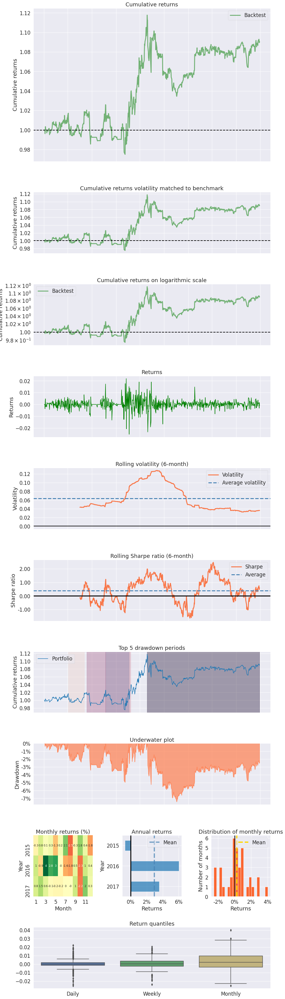

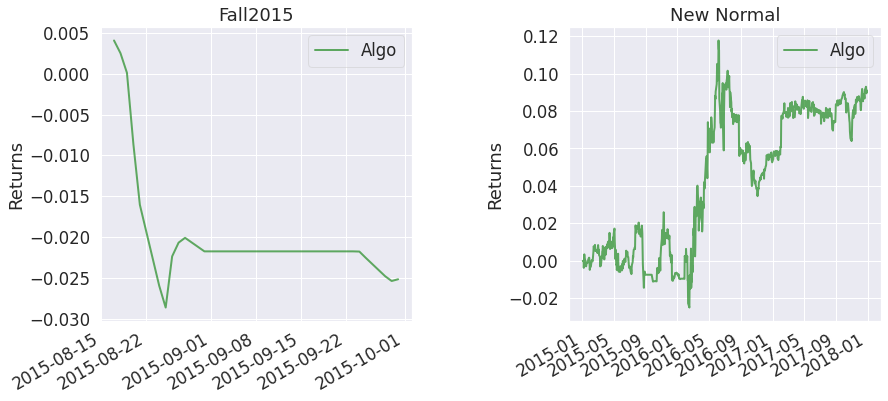

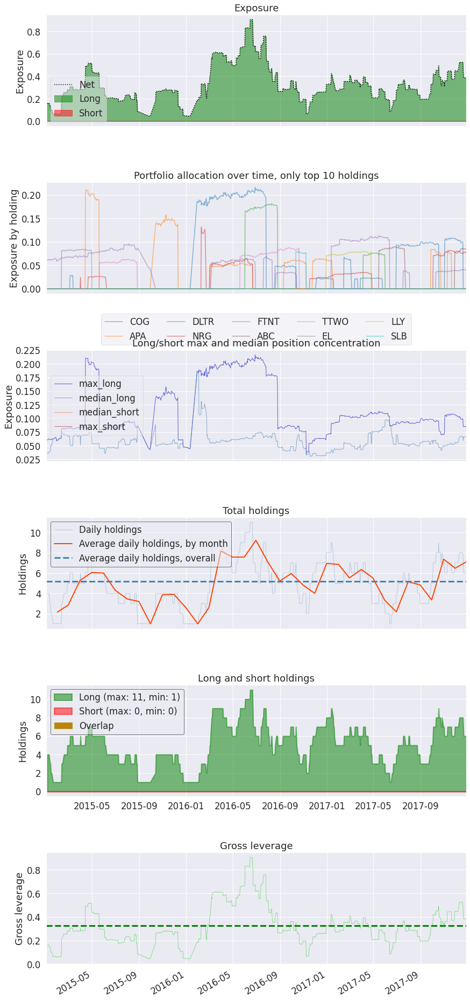

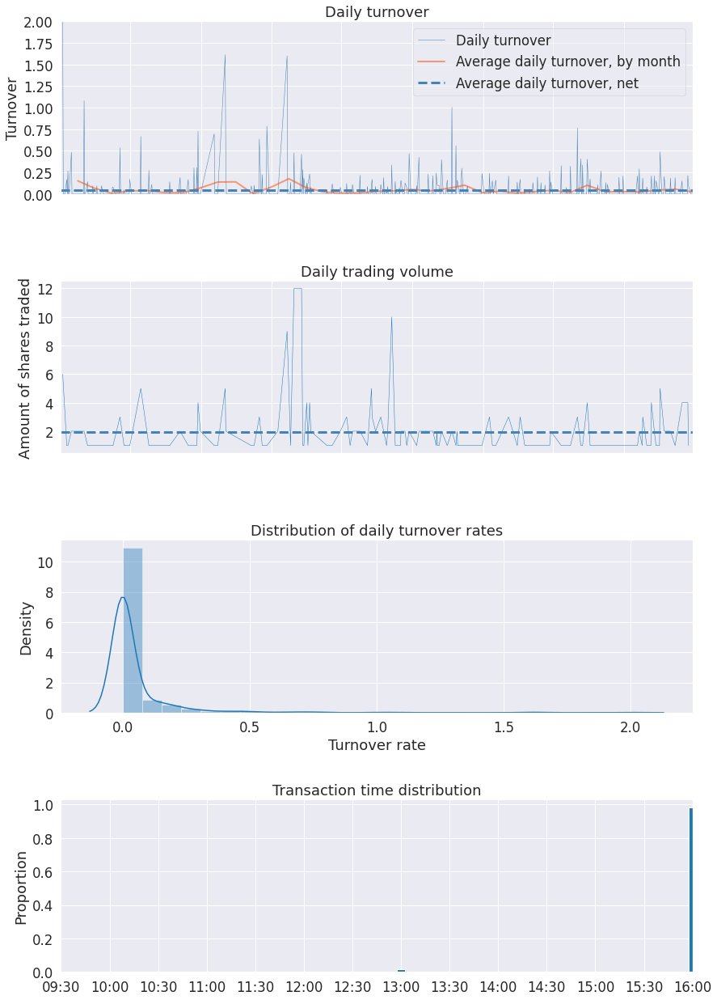

In [40]:
pf.create_full_tear_sheet(returns=returns, positions=positions, transactions=orders)